# Milestone 1

# Importing the Libraries

In [1]:
! pip install nltk

In [2]:
! pip install wordcloud

In [3]:
! pip install wordnet

In [4]:
! pip install textblob

In [5]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns,re,string
from datetime import datetime
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from matplotlib import rcParams
from textblob import TextBlob


from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download('omw-1.4')


from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split

import sklearn 
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets
from sklearn import preprocessing 

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


# Importing the CSV files

In [6]:
f=pd.read_csv("Video_Games.csv") 
f

,_id,asin,helpful,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime
0,6215df8bf8b1187bb3adaa6a,700099867,"[8,12]",1,Installing the game was a struggle (because of...,"07 9, 2012",A2HD75EMZR8QLN,123,Pay to unlock content? I don't think so.,1341792000
1,6215df8bf8b1187bb3adaa6b,700099867,"[0,0]",4,If you like rally cars get this game you will ...,"06 30, 2013",A3UR8NLLY1ZHCX,"Alejandro Henao ""Electronic Junky""",Good rally game,1372550400
2,6215df8bf8b1187bb3adaa6c,700099867,"[0,0]",1,1st shipment received a book instead of the ga...,"06 28, 2014",A1INA0F5CWW3J4,"Amazon Shopper ""Mr.Repsol""",Wrong key,1403913600
3,6215df8bf8b1187bb3adaa6d,700099867,"[7,10]",3,"I got this version instead of the PS3 version,...","09 14, 2011",A1DLMTOTHQ4AST,ampgreen,"awesome game, if it did not crash frequently !!",1315958400
4,6215df8bf8b1187bb3adaa6e,700099867,"[2,2]",4,I had Dirt 2 on Xbox 360 and it was an okay ga...,"06 14, 2011",A361M14PU2GUEG,"Angry Ryan ""Ryan A. Forrest""",DIRT 3,1308009600
...,...,...,...,...,...,...,...,...,...,...
231775,6215dfabf8b1187bb3b133c9,B00KHECZXO,"[0,1]",5,Funny people on here are rating sellers that a...,"07 20, 2014",A1ICREREXO9J81,Frustrated gamer,this is for rating the system not the seller,1405814400
231776,6215dfabf8b1187bb3b133ca,B00KHECZXO,"[8,11]",1,All this is is the Deluxe 32GB Wii U with Mari...,"06 21, 2014",A3VVMIMMTYQV5F,Johnny Saigon,Get the Other Bundle Which Includes Extra Whee...,1403308800
231777,6215dfabf8b1187bb3b133cb,B00KHECZXO,"[62,66]",1,The package should have more red on it and sho...,"05 29, 2014",A1DD4B97M4DUC5,migit,Fake bundle,1401321600
231778,6215dfabf8b1187bb3b133cc,B00KHECZXO,"[33,36]",1,Can get this at Newegg for $329.00 and the pac...,"06 2, 2014",A2Q9CNJ4T6ZK99,"Philip Brown ""Philip & Chana""",Looks Like We Have Gougers Again.,1401667200


In [7]:
e = pd.read_csv("Video_Games_3.csv") 
e

,asin,category
0,42000742,"[""Video Games"",""PC"",""Games""]"
1,78764343,"[""Video Games"",""Xbox 360"",""Games"",""</span></sp..."
2,276425316,"[""Video Games"",""Retro Gaming & Microconsoles"",..."
3,324411812,"[""Video Games"",""Xbox 360"",""Accessories"",""Contr..."
4,439335310,"[""Video Games"",""PC"",""Games"",""</span></span></s..."
...,...,...
84826,B01HJ1521Y,"[""Video Games"",""PlayStation Vita"",""Digital Gam..."
84827,B01HJ14TTA,"[""Video Games"",""PlayStation 4"",""Digital Games ..."
84828,B01HJ14OT0,"[""Video Games"",""PlayStation 4"",""Digital Games ..."
84829,B01HJC33WS,"[""Video Games"",""Xbox 360"",""Accessories"",""</spa..."


In [8]:
d = pd.merge(f,e, on='asin', how='inner')
d

,_id,asin,helpful,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,category
0,6215df8bf8b1187bb3adaa6a,700099867,"[8,12]",1,Installing the game was a struggle (because of...,"07 9, 2012",A2HD75EMZR8QLN,123,Pay to unlock content? I don't think so.,1341792000,"[""Video Games"",""PC"",""Games""]"
1,6215df8bf8b1187bb3adaa6b,700099867,"[0,0]",4,If you like rally cars get this game you will ...,"06 30, 2013",A3UR8NLLY1ZHCX,"Alejandro Henao ""Electronic Junky""",Good rally game,1372550400,"[""Video Games"",""PC"",""Games""]"
2,6215df8bf8b1187bb3adaa6c,700099867,"[0,0]",1,1st shipment received a book instead of the ga...,"06 28, 2014",A1INA0F5CWW3J4,"Amazon Shopper ""Mr.Repsol""",Wrong key,1403913600,"[""Video Games"",""PC"",""Games""]"
3,6215df8bf8b1187bb3adaa6d,700099867,"[7,10]",3,"I got this version instead of the PS3 version,...","09 14, 2011",A1DLMTOTHQ4AST,ampgreen,"awesome game, if it did not crash frequently !!",1315958400,"[""Video Games"",""PC"",""Games""]"
4,6215df8bf8b1187bb3adaa6e,700099867,"[2,2]",4,I had Dirt 2 on Xbox 360 and it was an okay ga...,"06 14, 2011",A361M14PU2GUEG,"Angry Ryan ""Ryan A. Forrest""",DIRT 3,1308009600,"[""Video Games"",""PC"",""Games""]"
...,...,...,...,...,...,...,...,...,...,...,...
228529,6215dfabf8b1187bb3b133c3,B00KAI3KW2,"[3,6]",5,Wow this really is an all in one gaming consol...,"06 24, 2014",AJQB6I00X8WAI,SmokeyNYY,Just got it and really like it so far,1403568000,"[""Video Games"",""Xbox One"",""</span></span></spa..."
228530,6215dfabf8b1187bb3b133c4,B00KAI3KW2,"[17,88]",1,Microsoft decided to remove the camera thingy ...,"06 14, 2014",A1MHB1HRR6VPEH,Stephanie,They couldnt compete with PS4,1402704000,"[""Video Games"",""Xbox One"",""</span></span></spa..."
228531,6215dfabf8b1187bb3b133c5,B00KAI3KW2,"[2,4]",5,Xbox One was initially announced and revealed ...,"07 19, 2014",A2IGEPJJYKMOWK,UziHorowitz,An Incredibly Reliable & Advanced Game Console,1405728000,"[""Video Games"",""Xbox One"",""</span></span></spa..."
228532,6215dfabf8b1187bb3b133c6,B00KAI3KW2,"[24,113]",2,The Titanfall bundle has been as low as $450. ...,"06 9, 2014",A1M19BGTJ5PI1I,V. T.,"No kinect, worse value",1402272000,"[""Video Games"",""Xbox One"",""</span></span></spa..."


In [9]:
d.isnull().sum()

_id                  0
asin                 0
helpful              0
overall              0
reviewText          36
reviewTime           0
reviewerID           0
reviewerName      1468
summary             10
unixReviewTime       0
category             0
dtype: int64

In [10]:
f1=pd.read_csv("Toys_and_Games.csv")  
f1

,_id,asin,helpful,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime
0,6215e0f9f8b1187bb3b133d0,439893577,"[0,0]",5,I like the item pricing. My granddaughter want...,"01 29, 2014",A1VXOAVRGKGEAK,Angie,Magnetic board,1390953600
1,6215e0f9f8b1187bb3b133d1,439893577,"[1,1]",4,Love the magnet easel... great for moving to d...,"03 28, 2014",A8R62G708TSCM,Candace,it works pretty good for moving to different a...,1395964800
2,6215e0f9f8b1187bb3b133d2,439893577,"[1,1]",5,Both sides are magnetic. A real plus when you...,"01 28, 2013",A21KH420DK0ICA,capemaychristy,love this!,1359331200
3,6215e0f9f8b1187bb3b133d3,439893577,"[0,0]",5,Bought one a few years ago for my daughter and...,"02 8, 2014",AR29QK6HPFYZ4,dcrm,Daughters love it,1391817600
4,6215e0f9f8b1187bb3b133d4,439893577,"[1,1]",4,I have a stainless steel refrigerator therefor...,"05 5, 2014",ACCH8EOML6FN5,DoyZ,Great to have so he can play with his alphabet...,1399248000
...,...,...,...,...,...,...,...,...,...,...
167592,6215e10df8b1187bb3b3c278,B00LBI9BKA,"[0,0]",5,This drone is very fun and super duarable. Its...,"07 7, 2014",A18Q24BZK2CB5P,nicole todhunter,Very fun,1404691200
167593,6215e10df8b1187bb3b3c279,B00LBI9BKA,"[1,1]",5,This is my brother's most prized toy. It's ext...,"07 7, 2014",A1I8ON1X0B2N2W,PF,Coolest toy on the market,1404691200
167594,6215e10df8b1187bb3b3c27a,B00LBI9BKA,"[0,0]",5,This Panther Drone toy is awesome. I definitel...,"07 8, 2014",A3V24H5350ULKI,Sara Tafuri,A great idea for kids!,1404777600
167595,6215e10df8b1187bb3b3c27b,B00LBI9BKA,"[0,0]",5,This is my first drone and it has proven to be...,"07 18, 2014",A1W2F1WI0QZ4AJ,Tabitha Nicole,Excellent Drone,1405641600


In [11]:
e1=pd.read_csv("Toys_and_Games_3.csv")  
e1

,asin,category
0,191639,"[""Toys & Games"",""Puzzles"",""Jigsaw Puzzles""]"
1,NaN,NaN
2,NaN,NaN
3,4983289,"[""Toys & Games"",""Games"",""Card Games""]"
4,NaN,NaN
...,...,...
633883,B01HJDFWDK,"[""Toys & Games"",""Hobbies"",""Remote & App Contro..."
633884,B01HJDGVFS,"[""Toys & Games"",""Sports & Outdoor Play"",""Pools..."
633885,B01HJDUNRU,"[""Toys & Games"",""Sports & Outdoor Play"",""Pools..."
633886,B01HJFAGJI,"[""Toys & Games"",""Learning & Education"",""Early ..."


In [12]:
d1 = pd.merge(f1,e1, on='asin', how='inner')
d1

,_id,asin,helpful,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,category
0,6215e0f9f8b1187bb3b1346a,786950072,"[1,2]",5,We were thrilled to find Acquire finally; my h...,"05 8, 2013",A35T7AVM3A5F4A,Betsy,one of the best games,1367971200,"[""Toys & Games"",""Games"",""Board Games""]"
1,6215e0f9f8b1187bb3b1346b,786950072,"[5,6]",5,"If you have never played, don't let the review...","11 23, 2008",AA3TDQ34248M7,ChaCha,I didn't like the 3d version anyway,1227398400,"[""Toys & Games"",""Games"",""Board Games""]"
2,6215e0f9f8b1187bb3b1346c,786950072,"[0,0]",4,"Whenever I see this game on my shelf, I get a ...","09 10, 2012",A1UP19XQH91JT0,Dad's Gaming Addiction,Acquire Review by Dad's Gaming Addiction,1347235200,"[""Toys & Games"",""Games"",""Board Games""]"
3,6215e0f9f8b1187bb3b1346d,786950072,"[4,4]",1,A crappy cardboard ghost of the original. Har...,"06 5, 2012",A337DRCGSM0HSC,DAVAD,A crappy cardboard ghost of the original. Har...,1338854400,"[""Toys & Games"",""Games"",""Board Games""]"
4,6215e0f9f8b1187bb3b1346e,786950072,"[1,4]",2,not that great a game. have only played like o...,"06 12, 2013",AH1FE0H8VVV6E,"D ""person""",not great,1370995200,"[""Toys & Games"",""Games"",""Board Games""]"
...,...,...,...,...,...,...,...,...,...,...,...
118065,6215e10df8b1187bb3b3c278,B00LBI9BKA,"[0,0]",5,This drone is very fun and super duarable. Its...,"07 7, 2014",A18Q24BZK2CB5P,nicole todhunter,Very fun,1404691200,"[""Toys & Games"",""Hobbies"",""Remote & App Contro..."
118066,6215e10df8b1187bb3b3c279,B00LBI9BKA,"[1,1]",5,This is my brother's most prized toy. It's ext...,"07 7, 2014",A1I8ON1X0B2N2W,PF,Coolest toy on the market,1404691200,"[""Toys & Games"",""Hobbies"",""Remote & App Contro..."
118067,6215e10df8b1187bb3b3c27a,B00LBI9BKA,"[0,0]",5,This Panther Drone toy is awesome. I definitel...,"07 8, 2014",A3V24H5350ULKI,Sara Tafuri,A great idea for kids!,1404777600,"[""Toys & Games"",""Hobbies"",""Remote & App Contro..."
118068,6215e10df8b1187bb3b3c27b,B00LBI9BKA,"[0,0]",5,This is my first drone and it has proven to be...,"07 18, 2014",A1W2F1WI0QZ4AJ,Tabitha Nicole,Excellent Drone,1405641600,"[""Toys & Games"",""Hobbies"",""Remote & App Contro..."


In [13]:
d1.isnull().sum()

_id                 0
asin                0
helpful             0
overall             0
reviewText         69
reviewTime          0
reviewerID          0
reviewerName      583
summary             0
unixReviewTime      0
category            0
dtype: int64

# Dataset 1

In [14]:
def change_format(dataframe):
    ReviewTime=[]
    for i in dataframe.unixReviewTime:
        ts = int(i)
        a=datetime.utcfromtimestamp(ts).strftime('%Y-%m-%d')
        ReviewTime.append(a)
    return ReviewTime

In [15]:
d['ReviewTime'] = change_format(d)

In [16]:
d

,_id,asin,helpful,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,category,ReviewTime
0,6215df8bf8b1187bb3adaa6a,700099867,"[8,12]",1,Installing the game was a struggle (because of...,"07 9, 2012",A2HD75EMZR8QLN,123,Pay to unlock content? I don't think so.,1341792000,"[""Video Games"",""PC"",""Games""]",2012-07-09
1,6215df8bf8b1187bb3adaa6b,700099867,"[0,0]",4,If you like rally cars get this game you will ...,"06 30, 2013",A3UR8NLLY1ZHCX,"Alejandro Henao ""Electronic Junky""",Good rally game,1372550400,"[""Video Games"",""PC"",""Games""]",2013-06-30
2,6215df8bf8b1187bb3adaa6c,700099867,"[0,0]",1,1st shipment received a book instead of the ga...,"06 28, 2014",A1INA0F5CWW3J4,"Amazon Shopper ""Mr.Repsol""",Wrong key,1403913600,"[""Video Games"",""PC"",""Games""]",2014-06-28
3,6215df8bf8b1187bb3adaa6d,700099867,"[7,10]",3,"I got this version instead of the PS3 version,...","09 14, 2011",A1DLMTOTHQ4AST,ampgreen,"awesome game, if it did not crash frequently !!",1315958400,"[""Video Games"",""PC"",""Games""]",2011-09-14
4,6215df8bf8b1187bb3adaa6e,700099867,"[2,2]",4,I had Dirt 2 on Xbox 360 and it was an okay ga...,"06 14, 2011",A361M14PU2GUEG,"Angry Ryan ""Ryan A. Forrest""",DIRT 3,1308009600,"[""Video Games"",""PC"",""Games""]",2011-06-14
...,...,...,...,...,...,...,...,...,...,...,...,...
228529,6215dfabf8b1187bb3b133c3,B00KAI3KW2,"[3,6]",5,Wow this really is an all in one gaming consol...,"06 24, 2014",AJQB6I00X8WAI,SmokeyNYY,Just got it and really like it so far,1403568000,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-24
228530,6215dfabf8b1187bb3b133c4,B00KAI3KW2,"[17,88]",1,Microsoft decided to remove the camera thingy ...,"06 14, 2014",A1MHB1HRR6VPEH,Stephanie,They couldnt compete with PS4,1402704000,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-14
228531,6215dfabf8b1187bb3b133c5,B00KAI3KW2,"[2,4]",5,Xbox One was initially announced and revealed ...,"07 19, 2014",A2IGEPJJYKMOWK,UziHorowitz,An Incredibly Reliable & Advanced Game Console,1405728000,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-07-19
228532,6215dfabf8b1187bb3b133c6,B00KAI3KW2,"[24,113]",2,The Titanfall bundle has been as low as $450. ...,"06 9, 2014",A1M19BGTJ5PI1I,V. T.,"No kinect, worse value",1402272000,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-09


In [17]:
d.rename(columns = {'asin':'product_id'}, inplace = True)

In [18]:
d2 =d.copy()

In [19]:
d2['reviews']=d2['reviewText']+d2['summary']
d2=d2.drop(['reviewText', 'summary'], axis=1)
d2.head()

,_id,product_id,helpful,overall,reviewTime,reviewerID,reviewerName,unixReviewTime,category,ReviewTime,reviews
0,6215df8bf8b1187bb3adaa6a,700099867,"[8,12]",1,"07 9, 2012",A2HD75EMZR8QLN,123,1341792000,"[""Video Games"",""PC"",""Games""]",2012-07-09,Installing the game was a struggle (because of...
1,6215df8bf8b1187bb3adaa6b,700099867,"[0,0]",4,"06 30, 2013",A3UR8NLLY1ZHCX,"Alejandro Henao ""Electronic Junky""",1372550400,"[""Video Games"",""PC"",""Games""]",2013-06-30,If you like rally cars get this game you will ...
2,6215df8bf8b1187bb3adaa6c,700099867,"[0,0]",1,"06 28, 2014",A1INA0F5CWW3J4,"Amazon Shopper ""Mr.Repsol""",1403913600,"[""Video Games"",""PC"",""Games""]",2014-06-28,1st shipment received a book instead of the ga...
3,6215df8bf8b1187bb3adaa6d,700099867,"[7,10]",3,"09 14, 2011",A1DLMTOTHQ4AST,ampgreen,1315958400,"[""Video Games"",""PC"",""Games""]",2011-09-14,"I got this version instead of the PS3 version,..."
4,6215df8bf8b1187bb3adaa6e,700099867,"[2,2]",4,"06 14, 2011",A361M14PU2GUEG,"Angry Ryan ""Ryan A. Forrest""",1308009600,"[""Video Games"",""PC"",""Games""]",2011-06-14,I had Dirt 2 on Xbox 360 and it was an okay ga...


In [20]:
d2 = d2.drop(['_id','unixReviewTime','reviewTime','reviewerName'], axis = 1)

In [21]:
d2

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,Installing the game was a struggle (because of...
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,If you like rally cars get this game you will ...
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,1st shipment received a book instead of the ga...
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,"I got this version instead of the PS3 version,..."
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,I had Dirt 2 on Xbox 360 and it was an okay ga...
...,...,...,...,...,...,...,...
228529,B00KAI3KW2,"[3,6]",5,AJQB6I00X8WAI,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-24,Wow this really is an all in one gaming consol...
228530,B00KAI3KW2,"[17,88]",1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-14,Microsoft decided to remove the camera thingy ...
228531,B00KAI3KW2,"[2,4]",5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-07-19,Xbox One was initially announced and revealed ...
228532,B00KAI3KW2,"[24,113]",2,A1M19BGTJ5PI1I,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-09,The Titanfall bundle has been as low as $450. ...


In [22]:
new1 = d2["helpful"].str.split(",", n = 1, expand = True)
new2 = new1[0].str.split("[", n = 1, expand = True)
new3 = new1[1].str.split("]", n = 1, expand = True)
new2.reset_index(drop=True, inplace=True)
new3.reset_index(drop=True, inplace=True)
new2=new2.drop([0], axis=1)
new3=new3.drop([1], axis=1)
helpful=pd.concat([new2, new3], axis=1)
def trim_columns(d2):
    trim_strings = lambda x: x.strip() if isinstance(x, str) else x
    return d2.applymap(trim_strings)
helpful= trim_columns(helpful)
helpful[0]=helpful[0].astype(str).astype(int)
helpful[1]=helpful[1].astype(str).astype(int)
try:
  helpful['result'] = helpful[1]/(helpful[0]+helpful[1])
except ZeroDivisionError:
  helpful['result']=0
helpful['result'] = helpful['result'].fillna(0)
helpful['result']=helpful['result'].round(2)*100 
d2['helpful_rate']=helpful['result']

In [23]:
d2

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,Installing the game was a struggle (because of...,40.0
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,If you like rally cars get this game you will ...,0.0
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,1st shipment received a book instead of the ga...,0.0
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,"I got this version instead of the PS3 version,...",41.0
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,I had Dirt 2 on Xbox 360 and it was an okay ga...,50.0
...,...,...,...,...,...,...,...,...
228529,B00KAI3KW2,"[3,6]",5,AJQB6I00X8WAI,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-24,Wow this really is an all in one gaming consol...,33.0
228530,B00KAI3KW2,"[17,88]",1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-14,Microsoft decided to remove the camera thingy ...,16.0
228531,B00KAI3KW2,"[2,4]",5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-07-19,Xbox One was initially announced and revealed ...,33.0
228532,B00KAI3KW2,"[24,113]",2,A1M19BGTJ5PI1I,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-09,The Titanfall bundle has been as low as $450. ...,18.0


In [24]:
d2.isnull().sum()

product_id       0
helpful          0
overall          0
reviewerID       0
category         0
ReviewTime       0
reviews         46
helpful_rate     0
dtype: int64

In [25]:
df01=d2.copy()

In [26]:
d2.shape

(228534, 8)

In [27]:
df01.shape

(228534, 8)

In [28]:
df01 = df01.dropna()

In [29]:
df01

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,Installing the game was a struggle (because of...,40.0
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,If you like rally cars get this game you will ...,0.0
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,1st shipment received a book instead of the ga...,0.0
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,"I got this version instead of the PS3 version,...",41.0
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,I had Dirt 2 on Xbox 360 and it was an okay ga...,50.0
...,...,...,...,...,...,...,...,...
228529,B00KAI3KW2,"[3,6]",5,AJQB6I00X8WAI,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-24,Wow this really is an all in one gaming consol...,33.0
228530,B00KAI3KW2,"[17,88]",1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-14,Microsoft decided to remove the camera thingy ...,16.0
228531,B00KAI3KW2,"[2,4]",5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-07-19,Xbox One was initially announced and revealed ...,33.0
228532,B00KAI3KW2,"[24,113]",2,A1M19BGTJ5PI1I,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-09,The Titanfall bundle has been as low as $450. ...,18.0


In [30]:
df=df01.copy()

In [31]:
stop_words = stopwords.words('english')
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [32]:
#df['reviews'] = str(df['reviews']).lower()
#df['reviews'] = df['reviews'].apply(lambda x: re.sub('[^A-Za-z0-9]', ' ', x))
#df['reviews'] = df['reviews'].apply(lambda x:re.sub('\[.*?\]', ' ', x))
#df['reviews'] = df['reviews'].apply(lambda x:re.sub('https?://\S+|www\.\S+', ' ', x))
#df['reviews'] = df['reviews'].apply(lambda x:re.sub('<.*?>+', '', x))
#df['reviews'] = df['reviews'].apply(lambda x:re.sub('[%s]' % re.escape(string.punctuation), '', x))
#df['reviews'] = df['reviews'].apply(lambda x:re.sub('\n', '', x))
#df['reviews'] = df['reviews'].apply(lambda x:re.sub('\w*\d\w*', '', x))

In [33]:
def data_cleaning(t):
    t = str(t).lower()
    t = re.sub('\[.*?\]', '', t)
    t = re.sub('https?://\S+|www\.\S+', '', t)
    t = re.sub('<.*?>+', '', t)
    t = re.sub('[%s]' % re.escape(string.punctuation), '', t)
    t = re.sub('\n', '', t)
    t = re.sub('\w*\d\w*', '', t)
    return t

In [34]:
df['reviews']=df['reviews'].apply(lambda i:data_cleaning(i))
df.head()

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing the game was a struggle because of ...,40.0
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,if you like rally cars get this game you will ...,0.0
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received a book instead of the ship...,0.0
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,i got this version instead of the version whi...,41.0
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,i had dirt on xbox and it was an okay game i...,50.0


In [35]:
stop_words = stopwords.words('english')
df['reviews'] = df['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [36]:
df01.head()

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,Installing the game was a struggle (because of...,40.0
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,If you like rally cars get this game you will ...,0.0
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,1st shipment received a book instead of the ga...,0.0
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,"I got this version instead of the PS3 version,...",41.0
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,I had Dirt 2 on Xbox 360 and it was an okay ga...,50.0


In [37]:
df.head()

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle games windows live bu...,40.0
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally cars get game funit oriented since ...,0.0
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing games lapt...,50.0


# Dataset 2

In [38]:
change_format(d1)

['2013-05-08',
 '2008-11-23',
 '2012-09-10',
 '2012-06-05',
 '2013-06-12',
 '2013-02-04',
 '2011-06-13',
 '2013-11-18',
 '2013-07-23',
 '2014-06-21',
 '2011-03-20',
 '2009-10-02',
 '2012-04-25',
 '2011-03-28',
 '2013-01-10',
 '2013-07-26',
 '2013-04-24',
 '2011-02-26',
 '2013-07-12',
 '2011-07-04',
 '2013-01-15',
 '2013-01-28',
 '2013-05-21',
 '2013-11-27',
 '2014-06-17',
 '2013-08-22',
 '2013-08-21',
 '2013-10-31',
 '2013-09-27',
 '2014-01-29',
 '2014-06-17',
 '2013-12-10',
 '2012-12-07',
 '2011-10-04',
 '2013-05-06',
 '2013-02-24',
 '2013-09-11',
 '2014-01-07',
 '2011-11-02',
 '2013-12-24',
 '2014-01-10',
 '2011-06-17',
 '2010-07-27',
 '2010-12-29',
 '2012-01-04',
 '2008-01-09',
 '2014-03-12',
 '2007-09-30',
 '2013-11-19',
 '2013-12-04',
 '2012-11-29',
 '2013-10-11',
 '2014-02-21',
 '2012-11-26',
 '2005-11-09',
 '2014-05-07',
 '2012-02-11',
 '2014-01-03',
 '2013-03-28',
 '2014-06-10',
 '2008-03-09',
 '2013-02-23',
 '2011-04-04',
 '2010-12-27',
 '2013-11-29',
 '2005-12-07',
 '2012-07-

In [39]:
d1['ReviewTime'] = change_format(d1)

In [40]:
d1

,_id,asin,helpful,overall,reviewText,reviewTime,reviewerID,reviewerName,summary,unixReviewTime,category,ReviewTime
0,6215e0f9f8b1187bb3b1346a,786950072,"[1,2]",5,We were thrilled to find Acquire finally; my h...,"05 8, 2013",A35T7AVM3A5F4A,Betsy,one of the best games,1367971200,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08
1,6215e0f9f8b1187bb3b1346b,786950072,"[5,6]",5,"If you have never played, don't let the review...","11 23, 2008",AA3TDQ34248M7,ChaCha,I didn't like the 3d version anyway,1227398400,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23
2,6215e0f9f8b1187bb3b1346c,786950072,"[0,0]",4,"Whenever I see this game on my shelf, I get a ...","09 10, 2012",A1UP19XQH91JT0,Dad's Gaming Addiction,Acquire Review by Dad's Gaming Addiction,1347235200,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10
3,6215e0f9f8b1187bb3b1346d,786950072,"[4,4]",1,A crappy cardboard ghost of the original. Har...,"06 5, 2012",A337DRCGSM0HSC,DAVAD,A crappy cardboard ghost of the original. Har...,1338854400,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05
4,6215e0f9f8b1187bb3b1346e,786950072,"[1,4]",2,not that great a game. have only played like o...,"06 12, 2013",AH1FE0H8VVV6E,"D ""person""",not great,1370995200,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12
...,...,...,...,...,...,...,...,...,...,...,...,...
118065,6215e10df8b1187bb3b3c278,B00LBI9BKA,"[0,0]",5,This drone is very fun and super duarable. Its...,"07 7, 2014",A18Q24BZK2CB5P,nicole todhunter,Very fun,1404691200,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07
118066,6215e10df8b1187bb3b3c279,B00LBI9BKA,"[1,1]",5,This is my brother's most prized toy. It's ext...,"07 7, 2014",A1I8ON1X0B2N2W,PF,Coolest toy on the market,1404691200,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07
118067,6215e10df8b1187bb3b3c27a,B00LBI9BKA,"[0,0]",5,This Panther Drone toy is awesome. I definitel...,"07 8, 2014",A3V24H5350ULKI,Sara Tafuri,A great idea for kids!,1404777600,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08
118068,6215e10df8b1187bb3b3c27b,B00LBI9BKA,"[0,0]",5,This is my first drone and it has proven to be...,"07 18, 2014",A1W2F1WI0QZ4AJ,Tabitha Nicole,Excellent Drone,1405641600,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18


In [41]:
d1.rename(columns = {'asin':'product_id'}, inplace = True)

In [42]:
d3 =d1.copy()

In [43]:
d3['reviews']=d3['reviewText']+d3['summary']
d3=d3.drop(['reviewText', 'summary'], axis=1)
d3.head()

,_id,product_id,helpful,overall,reviewTime,reviewerID,reviewerName,unixReviewTime,category,ReviewTime,reviews
0,6215e0f9f8b1187bb3b1346a,786950072,"[1,2]",5,"05 8, 2013",A35T7AVM3A5F4A,Betsy,1367971200,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,We were thrilled to find Acquire finally; my h...
1,6215e0f9f8b1187bb3b1346b,786950072,"[5,6]",5,"11 23, 2008",AA3TDQ34248M7,ChaCha,1227398400,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,"If you have never played, don't let the review..."
2,6215e0f9f8b1187bb3b1346c,786950072,"[0,0]",4,"09 10, 2012",A1UP19XQH91JT0,Dad's Gaming Addiction,1347235200,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,"Whenever I see this game on my shelf, I get a ..."
3,6215e0f9f8b1187bb3b1346d,786950072,"[4,4]",1,"06 5, 2012",A337DRCGSM0HSC,DAVAD,1338854400,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,A crappy cardboard ghost of the original. Har...
4,6215e0f9f8b1187bb3b1346e,786950072,"[1,4]",2,"06 12, 2013",AH1FE0H8VVV6E,"D ""person""",1370995200,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,not that great a game. have only played like o...


In [44]:
d3 = d3.drop(['_id', 'unixReviewTime', 'reviewTime','reviewerName'], axis = 1)

In [45]:
new1 = d3["helpful"].str.split(",", n = 1, expand = True)
new2 = new1[0].str.split("[", n = 1, expand = True)
new3 = new1[1].str.split("]", n = 1, expand = True)
new2.reset_index(drop=True, inplace=True)
new3.reset_index(drop=True, inplace=True)
new2=new2.drop([0], axis=1)
new3=new3.drop([1], axis=1)
helpful=pd.concat([new2, new3], axis=1)
def trim_columns(d3):
    trim_strings = lambda x: x.strip() if isinstance(x, str) else x
    return d3.applymap(trim_strings)
helpful= trim_columns(helpful)
helpful[0]=helpful[0].astype(str).astype(int)
helpful[1]=helpful[1].astype(str).astype(int)
try:
  helpful['result'] = helpful[1]/(helpful[0]+helpful[1])
except ZeroDivisionError:
  helpful['result']=0
helpful['result'] = helpful['result'].fillna(0)
helpful['result']=helpful['result'].round(2)*100 
d3['helpful_rate']=helpful['result']

In [46]:
d3

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,786950072,"[1,2]",5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,We were thrilled to find Acquire finally; my h...,33.0
1,786950072,"[5,6]",5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,"If you have never played, don't let the review...",45.0
2,786950072,"[0,0]",4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,"Whenever I see this game on my shelf, I get a ...",0.0
3,786950072,"[4,4]",1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,A crappy cardboard ghost of the original. Har...,50.0
4,786950072,"[1,4]",2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,not that great a game. have only played like o...,20.0
...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,"[0,0]",5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,This drone is very fun and super duarable. Its...,0.0
118066,B00LBI9BKA,"[1,1]",5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,This is my brother's most prized toy. It's ext...,50.0
118067,B00LBI9BKA,"[0,0]",5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,This Panther Drone toy is awesome. I definitel...,0.0
118068,B00LBI9BKA,"[0,0]",5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,This is my first drone and it has proven to be...,0.0


In [47]:
d3.isnull().sum()

product_id       0
helpful          0
overall          0
reviewerID       0
category         0
ReviewTime       0
reviews         69
helpful_rate     0
dtype: int64

In [48]:
df02=d3.copy()

In [49]:
df02 = df02.dropna()

In [50]:
df02.isnull().sum()

product_id      0
helpful         0
overall         0
reviewerID      0
category        0
ReviewTime      0
reviews         0
helpful_rate    0
dtype: int64

In [51]:
d3.shape

(118070, 8)

In [52]:
df02.shape

(118001, 8)

In [53]:
df1=df02.copy()

In [54]:
stop_words = stopwords.words('english')
df1['reviews'] = df1['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [55]:
df02.head()

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,786950072,"[1,2]",5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,We were thrilled to find Acquire finally; my h...,33.0
1,786950072,"[5,6]",5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,"If you have never played, don't let the review...",45.0
2,786950072,"[0,0]",4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,"Whenever I see this game on my shelf, I get a ...",0.0
3,786950072,"[4,4]",1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,A crappy cardboard ghost of the original. Har...,50.0
4,786950072,"[1,4]",2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,not that great a game. have only played like o...,20.0


In [56]:
df1['reviews']=df1['reviews'].apply(lambda i:data_cleaning(i))
df1.head()

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,786950072,"[1,2]",5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0
1,786950072,"[5,6]",5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let reviews turn off this wond...,45.0
2,786950072,"[0,0]",4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0
3,786950072,"[4,4]",1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0
4,786950072,"[1,4]",2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0


In [57]:
df1

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate
0,786950072,"[1,2]",5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0
1,786950072,"[5,6]",5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let reviews turn off this wond...,45.0
2,786950072,"[0,0]",4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0
3,786950072,"[4,4]",1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0
4,786950072,"[1,4]",2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0
...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,"[0,0]",5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable its easy use kid...,0.0
118066,B00LBI9BKA,"[1,1]",5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brothers prized toy its extremely durable...,50.0
118067,B00LBI9BKA,"[0,0]",5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0
118068,B00LBI9BKA,"[0,0]",5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0


In [58]:
df=df.drop(['helpful'], axis=1)

In [59]:
df1=df1.drop(['helpful'], axis=1)

In [60]:
def remove_tags(string):
    result = re.sub('<.*?>','',string)
    return result
df['category']=df['category'].apply(lambda i : remove_tags(i))

In [61]:
df1['category']=df1['category'].apply(lambda i : remove_tags(i))

In [62]:
df.to_csv('Video_Games1.csv')

In [63]:
df1.to_csv('Toys_and_Games1.csv')

# Milestone 2

# Dataset 1(Sentiment Analysis and Clustering)

In [64]:
def sent(DF):
    if DF['overall'] == 1.0 or DF['overall'] == 2.0:
        value = 'Negative'
    elif DF['overall'] == 3.0:
        value = 'Neutral'
    else:
        value = 'Positive'
    return value

In [65]:
df['sentiment'] = df.apply(sent,axis=1)
df.head()

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle games windows live bu...,40.0,Negative
1,700099867,4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally cars get game funit oriented since ...,0.0,Positive
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral
4,700099867,4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing games lapt...,50.0,Positive


In [66]:
df['sentiment'].value_counts()

Positive    172768
Neutral      28054
Negative     27666
Name: sentiment, dtype: int64

In [67]:
review_pos = df[df["sentiment"]=='Positive'].dropna()
review_neg = df[df["sentiment"]=='Negative'].dropna()

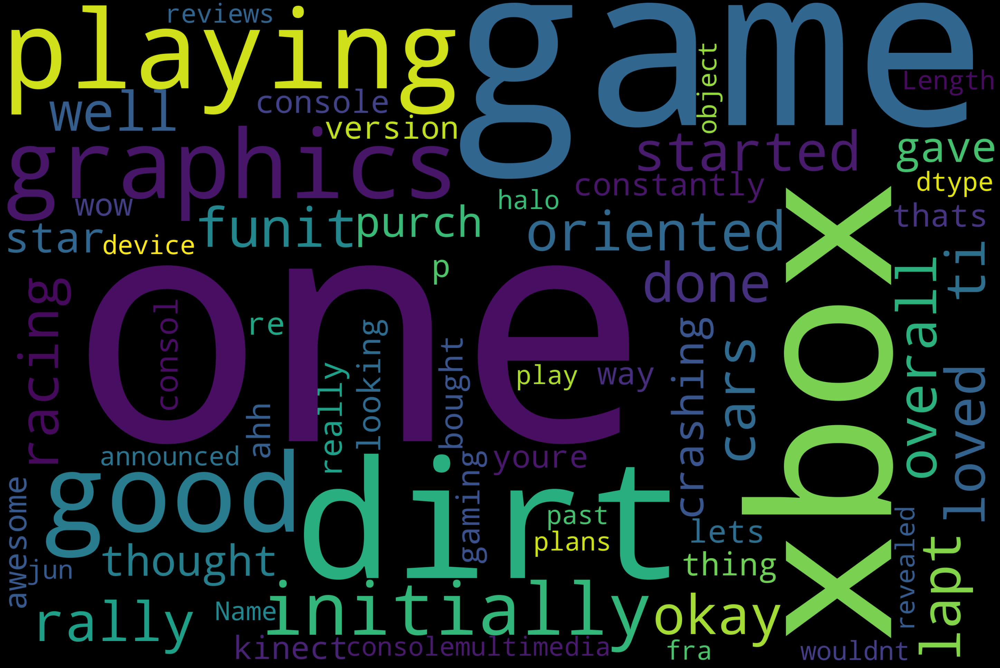

In [68]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

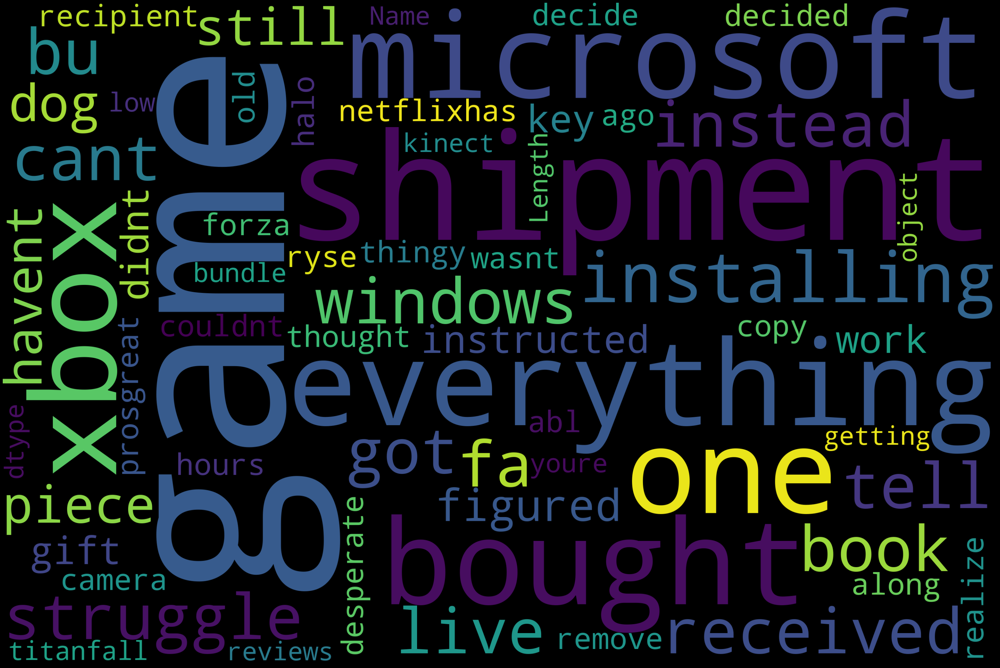

In [69]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [70]:
rev=df.copy()

In [71]:
rev["category"].unique()

array(['["Video Games","PC","Games"]',
       '["Video Games","PlayStation 3","Accessories","Controllers","Music Controllers","Microphones",""]',
       '["Video Games","Wii","Accessories","Cables & Adapters","Cables",""]',
       ...,
       '["Video Games","PlayStation 4","Games","","See description below for everything included in the Collector\'s Edition","Now in full HD (1080p) and able to display hundreds of characters on screen, FINAL FANTASY XIV: A Realm Reborn delivers a truly beautiful and smooth gaming experience","With Remote Play for PlayStation 4 and PlayStation Vita open up your gaming experience with the high quality graphics at home or on the move; an ideal function to help you with your crafting and gathering needs","By using the SHARE feature on your PlayStation 4, you can quickly share your gameplay, screenshots and even live stream your game to friends around the world","Use the PlayStation 4 Controller Touchpad to navigate menus quickly and easily"]',
       '["Vi

In [72]:
counts = rev["category"].value_counts().to_frame()
counts

,category
"[""Video Games"",""PC"",""Games"",""""]",26701
"[""Video Games"",""Xbox 360"",""Games"",""""]",17584
"[""Video Games"",""PlayStation 3"",""Games"",""""]",15370
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",11920
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",6303
...,...
"[""Video Games"",""PC"",""Accessories"",""Controllers"",""Gamepads & Standard Controllers"","""",""2.4 Ghz Wireless Controller"",""Single 2.4 Ghz Usb Dongle For Pc, Ps3 & Ps2 Connector"",""Automatic Shutdown Feature"",""On/Off Power Switch Allowing Extended Autonomy"",""Genuine Rubber 360 degrees Handgrips & Mini-Sticks"",""Single 2.4 GHz USB dongle for PC and PS3 and PS2 connector (exclusive design by Thrustmaster)"",""Two handgrips featuring a genuine rubber non-slip textured surface, for optimum grip and long-lasting comfort, even after the lengthiest gaming sessions""]",5
"[""Video Games"",""PlayStation 3"",""Accessories"",""Controllers""]",5
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"","""",""Build your home in the heartland"",""Earn profits to buy John Deere equipment"",""Great use of dual screens to monitor your farm"",""As your farm grows so do your customization choices"",""Uses both touch screen & Stylus""]",5
"[""Video Games"",""Sony PSP"",""Accessories"","""",""Officially Licensed S.P.F (Special Player Forces) Case for PS Vita"",""Shock resistant XL hard case to safely transport your PS Vita"",""Sliding locking system with secure opening mechanism. Double inner high-density foam inspired by military weapons cases"",""Unique military-themed design, directly inspired by the world of the special forces Alliance of black and silver color perfectly in line with PlayStationVita's design"",""Optimized for full compatibility with all PS Vita wireless features: Bluetooth / Near / Wi-Fi / 3G""]",5


In [73]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [74]:
rev["reviews"].apply(lambda x: TextBlob(x).words).head() 

0    [installing, game, struggle, games, windows, l...
1    [like, rally, cars, get, game, funit, oriented...
2    [shipment, received, book, instead, shipment, ...
3    [got, version, instead, version, turned, mista...
4    [dirt, xbox, okay, game, started, playing, gam...
Name: reviews, dtype: object

In [75]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [76]:
lemmatizer = WordNetLemmatizer()
def lemmatize_text(Df):
    Df.reviews = " ".join(lemmatizer.lemmatize(word) for word in Df.reviews.split())
    return Df
rev= rev.apply(lemmatize_text, axis = 1)

In [77]:
rev

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative
1,700099867,4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral
4,700099867,4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing game lapto...,50.0,Positive
...,...,...,...,...,...,...,...,...
228529,B00KAI3KW2,5,AJQB6I00X8WAI,"[""Video Games"",""Xbox One"",""""]",2014-06-24,wow really one gaming consolemultimedia device...,33.0,Positive
228530,B00KAI3KW2,1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""""]",2014-06-14,microsoft decided remove camera thingy realize...,16.0,Negative
228531,B00KAI3KW2,5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""""]",2014-07-19,xbox one initially announced revealed past jun...,33.0,Positive
228532,B00KAI3KW2,2,A1M19BGTJ5PI1I,"[""Video Games"",""Xbox One"",""""]",2014-06-09,titanfall bundle low youre getting game kinect...,18.0,Negative


In [78]:
rev['polarity'] = rev['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)

In [79]:
rev.head()

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790
1,700099867,4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive,0.033333
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral,-0.011501
4,700099867,4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing game lapto...,50.0,Positive,0.039669


In [80]:
avg_polarity = rev.groupby("category")["polarity"].mean().to_frame()
avg_polarity

,polarity
category,
"[""Video Games"",""Accessories"","""",""Brand New Generic Bulk Package""]",0.339492
"[""Video Games"",""Accessories"","""",""Converts the video and audio signals into your VGA monitor."",""Compatible with Playstation, PS2, XBOX, Gamecube, Nintendo 64 or Dreamcast""]",0.166652
"[""Video Games"",""Accessories"","""",""PS3 Controller"",""Silicone Controller"",""Red Controller"",""Blue Controller"",""Black Controller""]",0.272305
"[""Video Games"",""Accessories"","""",""USB cable allows you to charge your Microsoft xBox 360 Wireless Headset"",""Charge through any USB port and never run out of power again"",""Compatible With Xbox 360"",""Color: White; Package Contents: 1 x USB 2.0 Xbox 360 Wireless Headset Charging Cable""]",0.286500
"[""Video Games"",""Accessories"",""""]",0.223579
...,...
"[""Video Games"",""Xbox One"",""Games"",""""]",0.050597
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""All Skylanders Spyro's Adventure, Skylanders Giants, and Skylanders SWAP Force figures work with Skylanders Trap Team.""]",0.215208
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""Warnado"",""Warnado"",""CAN contain Glow-in-the-dark Warnado variant."",""Skylanders Triple Pack {Ignitor, Camo, Warnado}""]",0.236359


In [81]:
avg_rating = rev.groupby("category")["overall"].mean().to_frame()
avg_rating

,overall
category,
"[""Video Games"",""Accessories"","""",""Brand New Generic Bulk Package""]",3.800000
"[""Video Games"",""Accessories"","""",""Converts the video and audio signals into your VGA monitor."",""Compatible with Playstation, PS2, XBOX, Gamecube, Nintendo 64 or Dreamcast""]",3.800000
"[""Video Games"",""Accessories"","""",""PS3 Controller"",""Silicone Controller"",""Red Controller"",""Blue Controller"",""Black Controller""]",4.111111
"[""Video Games"",""Accessories"","""",""USB cable allows you to charge your Microsoft xBox 360 Wireless Headset"",""Charge through any USB port and never run out of power again"",""Compatible With Xbox 360"",""Color: White; Package Contents: 1 x USB 2.0 Xbox 360 Wireless Headset Charging Cable""]",4.000000
"[""Video Games"",""Accessories"",""""]",4.023256
...,...
"[""Video Games"",""Xbox One"",""Games"",""""]",3.693613
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""All Skylanders Spyro's Adventure, Skylanders Giants, and Skylanders SWAP Force figures work with Skylanders Trap Team.""]",4.444444
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""Warnado"",""Warnado"",""CAN contain Glow-in-the-dark Warnado variant."",""Skylanders Triple Pack {Ignitor, Camo, Warnado}""]",4.750000


In [82]:
fin_rev = counts.join(avg_polarity)
fin_rev.head(30)

,category,polarity
"[""Video Games"",""PC"",""Games"",""""]",26701,0.058848
"[""Video Games"",""Xbox 360"",""Games"",""""]",17584,0.059814
"[""Video Games"",""PlayStation 3"",""Games"",""""]",15370,0.064587
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",11920,0.059331
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",6303,0.063846
"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""""]",5699,0.084380
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games""]",5692,0.048700
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"",""""]",5114,0.069926
"[""Video Games"",""Retro Gaming & Microconsoles"",""Xbox"",""Games"",""""]",4493,0.061136
"[""Video Games"",""Kids & Family"",""Xbox 360"",""Games"",""""]",3364,0.074468


In [83]:
fin_rev = fin_rev.join(avg_rating)
fin_rev

,category,polarity,overall
"[""Video Games"",""PC"",""Games"",""""]",26701,0.058848,3.822891
"[""Video Games"",""Xbox 360"",""Games"",""""]",17584,0.059814,3.937784
"[""Video Games"",""PlayStation 3"",""Games"",""""]",15370,0.064587,4.108783
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",11920,0.059331,4.093456
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",6303,0.063846,4.090750
...,...,...,...
"[""Video Games"",""PC"",""Accessories"",""Controllers"",""Gamepads & Standard Controllers"","""",""2.4 Ghz Wireless Controller"",""Single 2.4 Ghz Usb Dongle For Pc, Ps3 & Ps2 Connector"",""Automatic Shutdown Feature"",""On/Off Power Switch Allowing Extended Autonomy"",""Genuine Rubber 360 degrees Handgrips & Mini-Sticks"",""Single 2.4 GHz USB dongle for PC and PS3 and PS2 connector (exclusive design by Thrustmaster)"",""Two handgrips featuring a genuine rubber non-slip textured surface, for optimum grip and long-lasting comfort, even after the lengthiest gaming sessions""]",5,0.045554,3.400000
"[""Video Games"",""PlayStation 3"",""Accessories"",""Controllers""]",5,0.089524,4.800000
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"","""",""Build your home in the heartland"",""Earn profits to buy John Deere equipment"",""Great use of dual screens to monitor your farm"",""As your farm grows so do your customization choices"",""Uses both touch screen & Stylus""]",5,0.016532,3.800000
"[""Video Games"",""Sony PSP"",""Accessories"","""",""Officially Licensed S.P.F (Special Player Forces) Case for PS Vita"",""Shock resistant XL hard case to safely transport your PS Vita"",""Sliding locking system with secure opening mechanism. Double inner high-density foam inspired by military weapons cases"",""Unique military-themed design, directly inspired by the world of the special forces Alliance of black and silver color perfectly in line with PlayStationVita's design"",""Optimized for full compatibility with all PS Vita wireless features: Bluetooth / Near / Wi-Fi / 3G""]",5,0.261142,3.400000


In [508]:
def sent1(f):
    if f['polarity'] < 0.0 :
        value = 'Negative'
    elif f['polarity'] == 0.0 or f['polarity'] < 0.1:
        value = 'Neutral'
    else:
        value = 'Positive'
    return value

In [85]:
fin_rev['polarity_sentiment'] = fin_rev.apply(sent1,axis=1)
fin_rev

,category,polarity,overall,polarity_sentiment
"[""Video Games"",""PC"",""Games"",""""]",26701,0.058848,3.822891,Neutral
"[""Video Games"",""Xbox 360"",""Games"",""""]",17584,0.059814,3.937784,Neutral
"[""Video Games"",""PlayStation 3"",""Games"",""""]",15370,0.064587,4.108783,Neutral
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",11920,0.059331,4.093456,Neutral
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",6303,0.063846,4.090750,Neutral
...,...,...,...,...
"[""Video Games"",""PC"",""Accessories"",""Controllers"",""Gamepads & Standard Controllers"","""",""2.4 Ghz Wireless Controller"",""Single 2.4 Ghz Usb Dongle For Pc, Ps3 & Ps2 Connector"",""Automatic Shutdown Feature"",""On/Off Power Switch Allowing Extended Autonomy"",""Genuine Rubber 360 degrees Handgrips & Mini-Sticks"",""Single 2.4 GHz USB dongle for PC and PS3 and PS2 connector (exclusive design by Thrustmaster)"",""Two handgrips featuring a genuine rubber non-slip textured surface, for optimum grip and long-lasting comfort, even after the lengthiest gaming sessions""]",5,0.045554,3.400000,Neutral
"[""Video Games"",""PlayStation 3"",""Accessories"",""Controllers""]",5,0.089524,4.800000,Neutral
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"","""",""Build your home in the heartland"",""Earn profits to buy John Deere equipment"",""Great use of dual screens to monitor your farm"",""As your farm grows so do your customization choices"",""Uses both touch screen & Stylus""]",5,0.016532,3.800000,Neutral
"[""Video Games"",""Sony PSP"",""Accessories"","""",""Officially Licensed S.P.F (Special Player Forces) Case for PS Vita"",""Shock resistant XL hard case to safely transport your PS Vita"",""Sliding locking system with secure opening mechanism. Double inner high-density foam inspired by military weapons cases"",""Unique military-themed design, directly inspired by the world of the special forces Alliance of black and silver color perfectly in line with PlayStationVita's design"",""Optimized for full compatibility with all PS Vita wireless features: Bluetooth / Near / Wi-Fi / 3G""]",5,0.261142,3.400000,Positive


In [86]:
fin_rev['polarity_sentiment'].value_counts()

Positive    953
Neutral     865
Negative    177
Name: polarity_sentiment, dtype: int64

In [87]:
rev['polarity_sentiment'] = rev.apply(sent1,axis=1)
rev

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790,Negative
1,700099867,4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive,0.033333,Neutral
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429,Negative
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral,-0.011501,Negative
4,700099867,4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing game lapto...,50.0,Positive,0.039669,Neutral
...,...,...,...,...,...,...,...,...,...,...
228529,B00KAI3KW2,5,AJQB6I00X8WAI,"[""Video Games"",""Xbox One"",""""]",2014-06-24,wow really one gaming consolemultimedia device...,33.0,Positive,0.189394,Positive
228530,B00KAI3KW2,1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""""]",2014-06-14,microsoft decided remove camera thingy realize...,16.0,Negative,-0.450000,Negative
228531,B00KAI3KW2,5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""""]",2014-07-19,xbox one initially announced revealed past jun...,33.0,Positive,0.041888,Neutral
228532,B00KAI3KW2,2,A1M19BGTJ5PI1I,"[""Video Games"",""Xbox One"",""""]",2014-06-09,titanfall bundle low youre getting game kinect...,18.0,Negative,0.016944,Neutral


In [501]:
review_pos = rev[rev["polarity_sentiment"]=='Positive'].dropna()
review_neu = rev[rev["polarity_sentiment"]=='Neutral'].dropna()
review_neg = rev[rev["polarity_sentiment"]=='Negative'].dropna()

In [502]:
review_pos

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
6,700099867,5,AN3YYDZAS3O1Y,"[""Video Games"",""PC"",""Games""]",2011-08-14,loved playing dirt thought graphic good purcha...,46.0,Positive,0.265385,Positive
10,700099867,5,A38NXTZUFB1O2K,"[""Video Games"",""PC"",""Games""]",2011-06-28,im quite finished game dirt tour mode believe ...,50.0,Positive,0.184149,Positive
11,700099867,5,ANW6EGY12V5XS,"[""Video Games"",""PC"",""Games""]",2011-10-19,playing car racing game since early beginning ...,0.0,Positive,0.235880,Positive
13,700099867,1,A248LSBZT4P38V,"[""Video Games"",""PC"",""Games""]",2014-06-30,bought key didnt work gift recipient wasnt abl...,0.0,Negative,0.157143,Positive
15,700099867,1,A14L115LBOB0A5,"[""Video Games"",""PC"",""Games""]",2013-07-15,game ripoff le terrain le track le feature dir...,50.0,Negative,0.150000,Positive
...,...,...,...,...,...,...,...,...,...,...
228525,B00KAI3KW2,5,A1XNZ7PCE45KK7,"[""Video Games"",""Xbox One"",""""]",2014-06-10,day one version bought version xbox college so...,44.0,Positive,0.110833,Positive
228526,B00KAI3KW2,5,A25NSTXNN16KG8,"[""Video Games"",""Xbox One"",""""]",2014-06-09,let get one thing way youre looking console po...,39.0,Positive,0.138462,Positive
228527,B00KAI3KW2,1,A37T2MU6L4521N,"[""Video Games"",""Xbox One"",""""]",2014-06-22,prosgreat netflixhas forza old halo game xbox ...,16.0,Negative,0.193457,Positive
228528,B00KAI3KW2,5,A3D8VPZNKYIAP0,"[""Video Games"",""Xbox One"",""""]",2014-06-09,ahh bought kinect version thats awesome consol...,34.0,Positive,0.344773,Positive


In [503]:
review_neu

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
1,700099867,4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive,0.033333,Neutral
4,700099867,4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing game lapto...,50.0,Positive,0.039669,Neutral
16,700099867,4,A20DRRKAN5Z9Q,"[""Video Games"",""PC"",""Games""]",2012-03-19,today game market easy miss racing game arent ...,50.0,Positive,0.054655,Neutral
23,700099867,3,A1CB8HH9YJ2YZE,"[""Video Games"",""PC"",""Games""]",2012-06-09,pretty fun game buy car track online store gam...,50.0,Neutral,0.047277,Neutral
24,700099867,5,A2LQCBLLJVVR5T,"[""Video Games"",""PC"",""Games""]",2011-06-13,must gamer codemasters really hit home run one...,45.0,Positive,0.050369,Neutral
...,...,...,...,...,...,...,...,...,...,...
228511,B00KAI3KW2,5,AKCXS6JVW6E8L,"[""Video Games"",""Xbox One"",""""]",2014-06-09,love console brings living room together perfe...,38.0,Positive,0.087986,Neutral
228515,B00KAI3KW2,1,A1DDGFYGFY6TDC,"[""Video Games"",""Xbox One"",""""]",2014-06-09,know superior hardware xbox one kinect cool fe...,14.0,Negative,0.048611,Neutral
228521,B00KAI3KW2,4,A2VCOIPPA48ICC,"[""Video Games"",""Xbox One"",""""]",2014-06-17,removal kinect using resource improve quality ...,29.0,Positive,0.033333,Neutral
228531,B00KAI3KW2,5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""""]",2014-07-19,xbox one initially announced revealed past jun...,33.0,Positive,0.041888,Neutral


In [504]:
review_neg

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790,Negative
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429,Negative
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral,-0.011501,Negative
5,700099867,4,A2UTRVO4FDCBH6,"[""Video Games"",""PC"",""Games""]",2013-05-11,overall well done racing game good graphic tim...,0.0,Positive,-0.076285,Negative
7,700099867,1,AQTC623NCESZW,"[""Video Games"",""PC"",""Games""]",2012-11-24,cant tell piece dog game like everything else ...,20.0,Negative,-0.224126,Negative
...,...,...,...,...,...,...,...,...,...,...
228507,B00KAI3KW2,3,A2BVX2MCXPP49R,"[""Video Games"",""Xbox One"",""""]",2014-06-24,hey finally able go buy xbox one xbox one got ...,34.0,Neutral,-0.038762,Negative
228510,B00KAI3KW2,1,A1ZR8AIM298DFT,"[""Video Games"",""Xbox One"",""""]",2014-07-09,still isnt worth weak console overall buy inst...,15.0,Negative,-0.025000,Negative
228519,B00KAI3KW2,1,AQOFQWJYJRA5W,"[""Video Games"",""Xbox One"",""""]",2014-06-15,bought xbox one hour ago along copy ryse game ...,25.0,Negative,-0.235294,Negative
228530,B00KAI3KW2,1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""""]",2014-06-14,microsoft decided remove camera thingy realize...,16.0,Negative,-0.450000,Negative


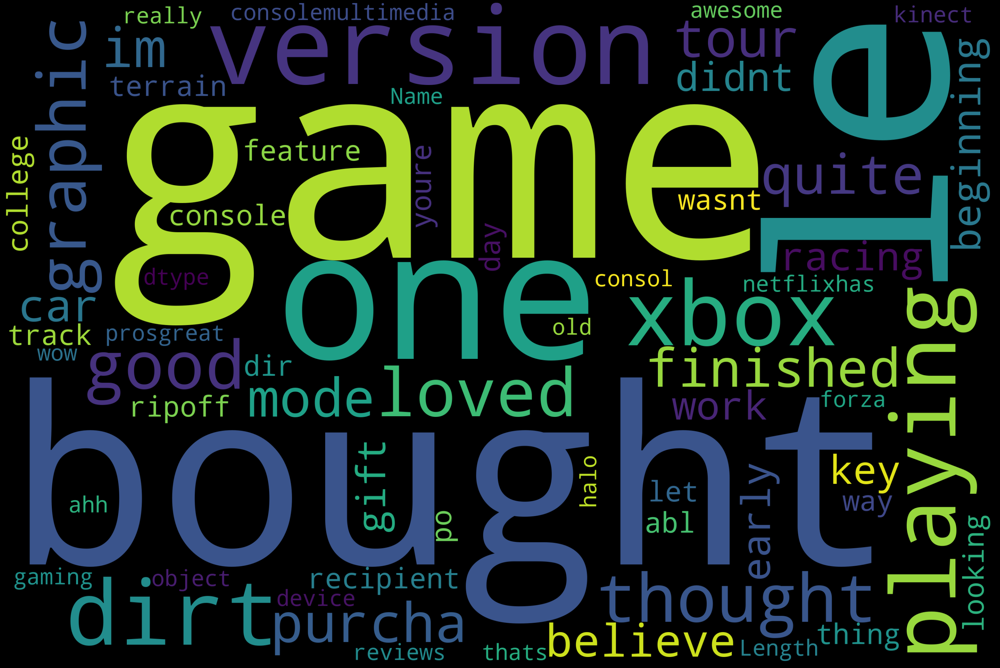

In [505]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

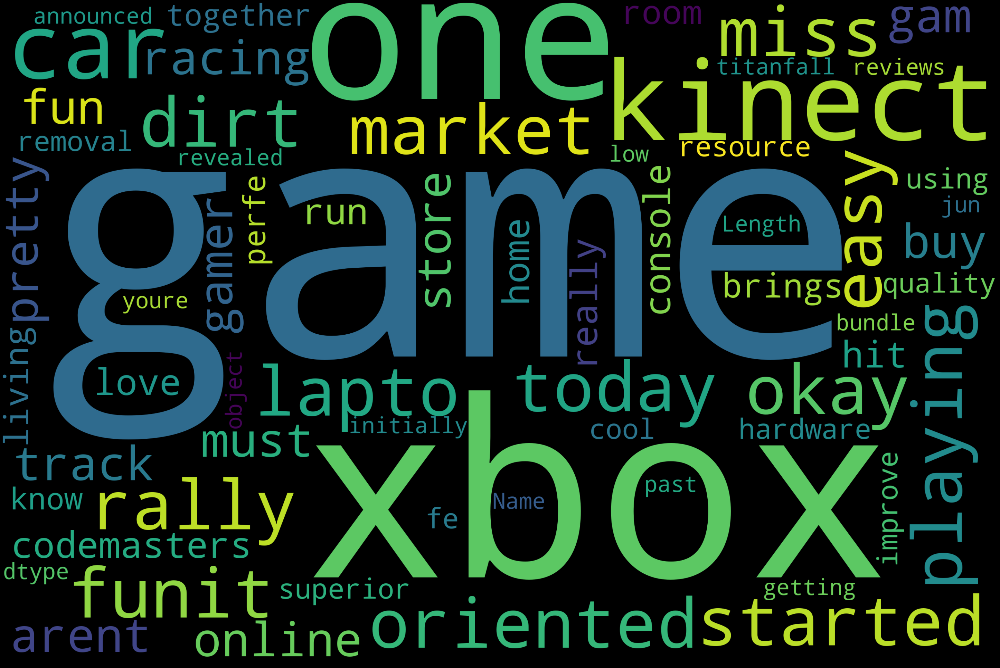

In [506]:
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

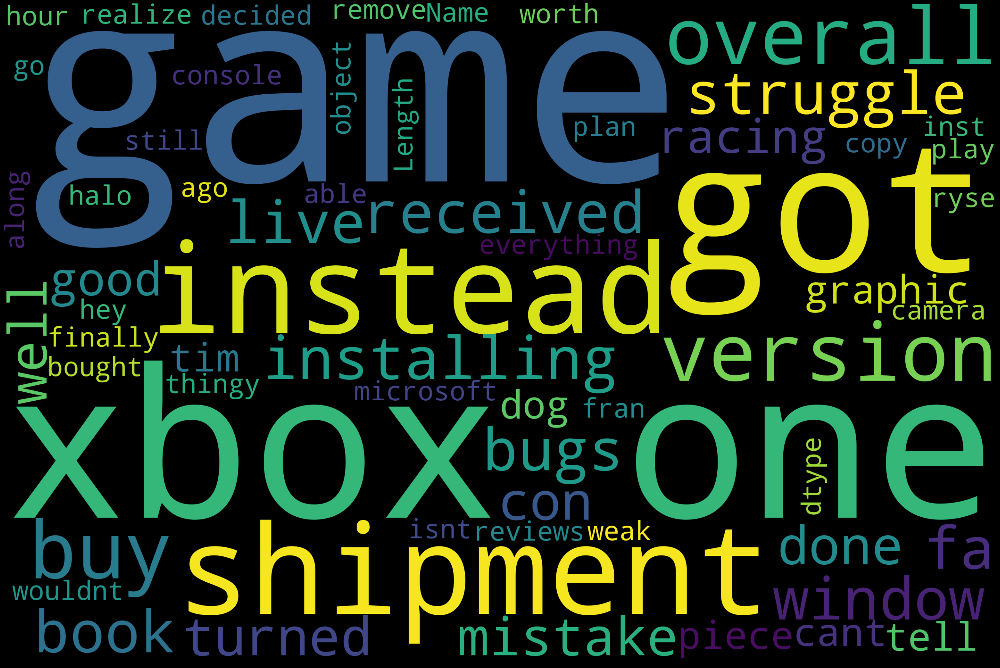

In [507]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [95]:
fin_rev['product_ids']=fin_rev.index
fin_rev

,category,polarity,overall,polarity_sentiment,product_ids
"[""Video Games"",""PC"",""Games"",""""]",26701,0.058848,3.822891,Neutral,"[""Video Games"",""PC"",""Games"",""""]"
"[""Video Games"",""Xbox 360"",""Games"",""""]",17584,0.059814,3.937784,Neutral,"[""Video Games"",""Xbox 360"",""Games"",""""]"
"[""Video Games"",""PlayStation 3"",""Games"",""""]",15370,0.064587,4.108783,Neutral,"[""Video Games"",""PlayStation 3"",""Games"",""""]"
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",11920,0.059331,4.093456,Neutral,"[""Video Games"",""Retro Gaming & Microconsoles"",..."
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",6303,0.063846,4.090750,Neutral,"[""Video Games"",""Retro Gaming &amp; Microconsol..."
...,...,...,...,...,...
"[""Video Games"",""PC"",""Accessories"",""Controllers"",""Gamepads & Standard Controllers"","""",""2.4 Ghz Wireless Controller"",""Single 2.4 Ghz Usb Dongle For Pc, Ps3 & Ps2 Connector"",""Automatic Shutdown Feature"",""On/Off Power Switch Allowing Extended Autonomy"",""Genuine Rubber 360 degrees Handgrips & Mini-Sticks"",""Single 2.4 GHz USB dongle for PC and PS3 and PS2 connector (exclusive design by Thrustmaster)"",""Two handgrips featuring a genuine rubber non-slip textured surface, for optimum grip and long-lasting comfort, even after the lengthiest gaming sessions""]",5,0.045554,3.400000,Neutral,"[""Video Games"",""PC"",""Accessories"",""Controllers..."
"[""Video Games"",""PlayStation 3"",""Accessories"",""Controllers""]",5,0.089524,4.800000,Neutral,"[""Video Games"",""PlayStation 3"",""Accessories"",""..."
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"","""",""Build your home in the heartland"",""Earn profits to buy John Deere equipment"",""Great use of dual screens to monitor your farm"",""As your farm grows so do your customization choices"",""Uses both touch screen & Stylus""]",5,0.016532,3.800000,Neutral,"[""Video Games"",""Kids & Family"",""Nintendo DS"",""..."
"[""Video Games"",""Sony PSP"",""Accessories"","""",""Officially Licensed S.P.F (Special Player Forces) Case for PS Vita"",""Shock resistant XL hard case to safely transport your PS Vita"",""Sliding locking system with secure opening mechanism. Double inner high-density foam inspired by military weapons cases"",""Unique military-themed design, directly inspired by the world of the special forces Alliance of black and silver color perfectly in line with PlayStationVita's design"",""Optimized for full compatibility with all PS Vita wireless features: Bluetooth / Near / Wi-Fi / 3G""]",5,0.261142,3.400000,Positive,"[""Video Games"",""Sony PSP"",""Accessories"","""",""Of..."


In [96]:
fin_rev = fin_rev.reset_index(drop=True)

In [97]:
fin_rev.reset_index()

,index,category,polarity,overall,polarity_sentiment,product_ids
0,0,26701,0.058848,3.822891,Neutral,"[""Video Games"",""PC"",""Games"",""""]"
1,1,17584,0.059814,3.937784,Neutral,"[""Video Games"",""Xbox 360"",""Games"",""""]"
2,2,15370,0.064587,4.108783,Neutral,"[""Video Games"",""PlayStation 3"",""Games"",""""]"
3,3,11920,0.059331,4.093456,Neutral,"[""Video Games"",""Retro Gaming & Microconsoles"",..."
4,4,6303,0.063846,4.090750,Neutral,"[""Video Games"",""Retro Gaming &amp; Microconsol..."
...,...,...,...,...,...,...
1990,1990,5,0.045554,3.400000,Neutral,"[""Video Games"",""PC"",""Accessories"",""Controllers..."
1991,1991,5,0.089524,4.800000,Neutral,"[""Video Games"",""PlayStation 3"",""Accessories"",""..."
1992,1992,5,0.016532,3.800000,Neutral,"[""Video Games"",""Kids & Family"",""Nintendo DS"",""..."
1993,1993,5,0.261142,3.400000,Positive,"[""Video Games"",""Sony PSP"",""Accessories"","""",""Of..."


In [98]:
fin_rev.polarity_sentiment.value_counts()

Positive    953
Neutral     865
Negative    177
Name: polarity_sentiment, dtype: int64

In [99]:
fin_rev.rename(columns = {'category':'counts'}, inplace = True)

In [100]:
fin_rev.rename(columns = {'product_ids':'category'}, inplace = True)

In [101]:
fin_rev

,counts,polarity,overall,polarity_sentiment,category
0,26701,0.058848,3.822891,Neutral,"[""Video Games"",""PC"",""Games"",""""]"
1,17584,0.059814,3.937784,Neutral,"[""Video Games"",""Xbox 360"",""Games"",""""]"
2,15370,0.064587,4.108783,Neutral,"[""Video Games"",""PlayStation 3"",""Games"",""""]"
3,11920,0.059331,4.093456,Neutral,"[""Video Games"",""Retro Gaming & Microconsoles"",..."
4,6303,0.063846,4.090750,Neutral,"[""Video Games"",""Retro Gaming &amp; Microconsol..."
...,...,...,...,...,...
1990,5,0.045554,3.400000,Neutral,"[""Video Games"",""PC"",""Accessories"",""Controllers..."
1991,5,0.089524,4.800000,Neutral,"[""Video Games"",""PlayStation 3"",""Accessories"",""..."
1992,5,0.016532,3.800000,Neutral,"[""Video Games"",""Kids & Family"",""Nintendo DS"",""..."
1993,5,0.261142,3.400000,Positive,"[""Video Games"",""Sony PSP"",""Accessories"","""",""Of..."


In [102]:
labelencoder = LabelEncoder()
fin_rev['category1']=labelencoder.fit_transform(fin_rev['category'])
fin_rev.head()

,counts,polarity,overall,polarity_sentiment,category,category1
0,26701,0.058848,3.822891,Neutral,"[""Video Games"",""PC"",""Games"",""""]",872
1,17584,0.059814,3.937784,Neutral,"[""Video Games"",""Xbox 360"",""Games"",""""]",1968
2,15370,0.064587,4.108783,Neutral,"[""Video Games"",""PlayStation 3"",""Games"",""""]",1042
3,11920,0.059331,4.093456,Neutral,"[""Video Games"",""Retro Gaming & Microconsoles"",...",1325
4,6303,0.063846,4.090750,Neutral,"[""Video Games"",""Retro Gaming &amp; Microconsol...",1508


In [103]:
fin_rev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1995 entries, 0 to 1994
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   counts              1995 non-null   int64  
 1   polarity            1995 non-null   float64
 2   overall             1995 non-null   float64
 3   polarity_sentiment  1995 non-null   object 
 4   category            1995 non-null   object 
 5   category1           1995 non-null   int32  
dtypes: float64(2), int32(1), int64(1), object(2)
memory usage: 85.8+ KB


In [104]:
fin_rev=fin_rev.drop(['polarity_sentiment'], axis=1)
fin_rev.head()

,counts,polarity,overall,category,category1
0,26701,0.058848,3.822891,"[""Video Games"",""PC"",""Games"",""""]",872
1,17584,0.059814,3.937784,"[""Video Games"",""Xbox 360"",""Games"",""""]",1968
2,15370,0.064587,4.108783,"[""Video Games"",""PlayStation 3"",""Games"",""""]",1042
3,11920,0.059331,4.093456,"[""Video Games"",""Retro Gaming & Microconsoles"",...",1325
4,6303,0.063846,4.090750,"[""Video Games"",""Retro Gaming &amp; Microconsol...",1508


In [105]:
#fin_rev=fin_rev.drop(['category'], axis=1)
#fin_rev.head()

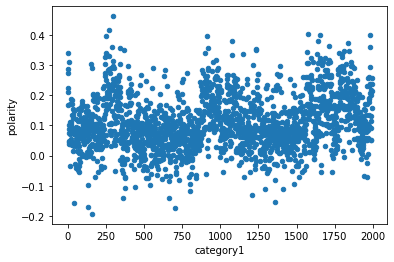

In [83]:
fin_rev.plot.scatter(x='category1',y='polarity')
plt.show()

In [84]:
std_scaler = StandardScaler()
b = fin_rev.select_dtypes('number')
std_scaler = StandardScaler()
fin_rev_std = fin_rev
scale_columns = ['category1','polarity']
fin_rev_std[scale_columns] = std_scaler.fit_transform(fin_rev[scale_columns])

In [85]:
c = std_scaler.fit_transform(b)

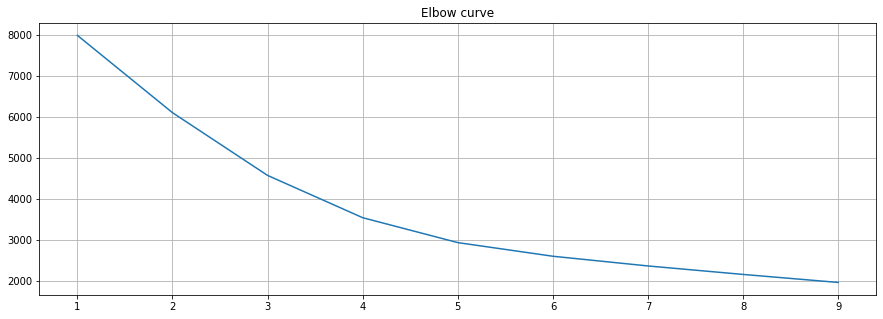

In [86]:
import pandas as pd
from string import ascii_letters
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings("ignore")
distorsions = []
for k in range(1, 10):
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(c)
  distorsions.append(kmeans.inertia_)
fig = plt.figure(figsize=(15, 5))
plt.plot(range(1, 10), distorsions)
plt.grid(True)
plt.title('Elbow curve');

In [87]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=10)
  cluster_labels = clusterer.fit_predict(c)
  silhouette_avg = silhouette_score(c, cluster_labels)
  print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.2756307634009959
For n_clusters = 3 The average silhouette_score is : 0.281402651596256
For n_clusters = 4 The average silhouette_score is : 0.2865053426451276
For n_clusters = 5 The average silhouette_score is : 0.2831072755009162
For n_clusters = 6 The average silhouette_score is : 0.27116628580717583
For n_clusters = 7 The average silhouette_score is : 0.2682946901627759
For n_clusters = 8 The average silhouette_score is : 0.2599762553991757
For n_clusters = 9 The average silhouette_score is : 0.2663888205131565
For n_clusters = 10 The average silhouette_score is : 0.26367972982848664
For n_clusters = 11 The average silhouette_score is : 0.2639906321435634
For n_clusters = 12 The average silhouette_score is : 0.26495413201990103
For n_clusters = 13 The average silhouette_score is : 0.2627374692639094
For n_clusters = 14 The average silhouette_score is : 0.25282986067332225
For n_clusters = 15 The average silhouette_score is : 0.

In [88]:
!pip install hdbscan

     |████████████████████████████████| 5.2 MB 4.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2330757 sha256=65caff571784c421fc0ceb7d53f6b11aa3ebd80e42bd8361f42164d6faa91d6d
  Stored in directory: /root/.cache/pip/wheels/6e/7a/5e/259ccc841c085fc41b99ef4a71e896b62f5161f2bc8a14c97a
Successfully built hdbscan


In [89]:
import warnings
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
warnings.filterwarnings("ignore")
from string import ascii_letters 
import matplotlib.cm as cm
%matplotlib inline 
from sklearn.preprocessing import MinMaxScaler, StandardScaler, FunctionTransformer
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
sns.set_context('poster')
sns.set_style('white') 
sns.set_color_codes() 
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}
warnings.filterwarnings("ignore")

eps =  0.1 ,min_samples =  12 -1    1995
dtype: int64


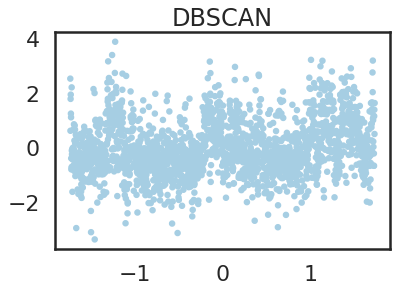

eps =  0.1 ,min_samples =  13 -1    1995
dtype: int64


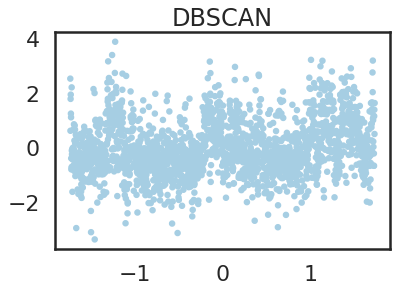

eps =  0.1 ,min_samples =  14 -1    1995
dtype: int64


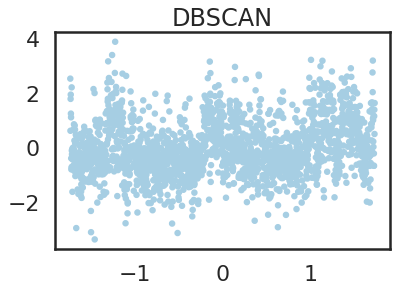

eps =  0.2 ,min_samples =  12 -1    1983
 0      12
dtype: int64


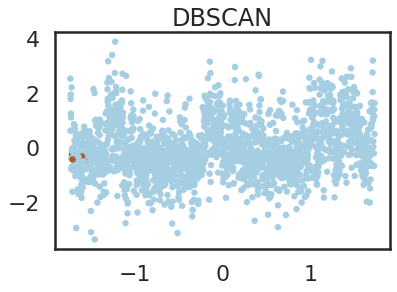

eps =  0.2 ,min_samples =  13 -1    1995
dtype: int64


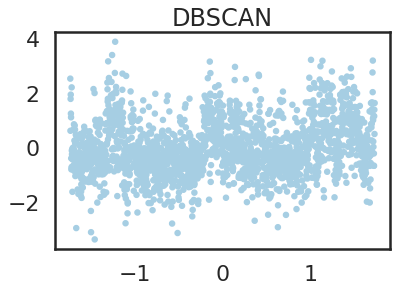

eps =  0.2 ,min_samples =  14 -1    1995
dtype: int64


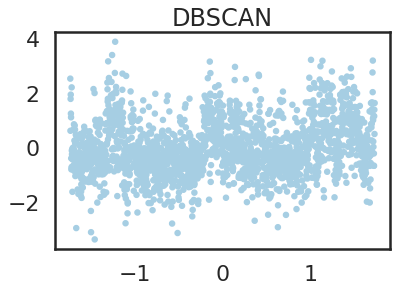

eps =  0.3 ,min_samples =  12 -1    1120
 0     412
 1     322
 2      52
 3      22
 4      17
 5      14
 7      12
 9      10
 8       8
 6       6
dtype: int64


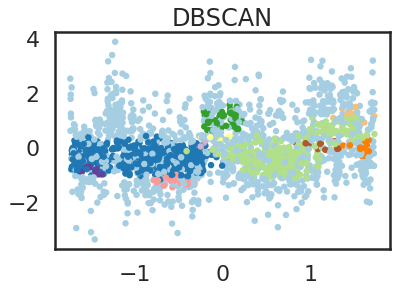

eps =  0.3 ,min_samples =  13 -1     1227
 1      356
 0      188
 3       64
 4       46
 2       38
 5       22
 6       17
 7       11
 9       11
 10       8
 8        7
dtype: int64


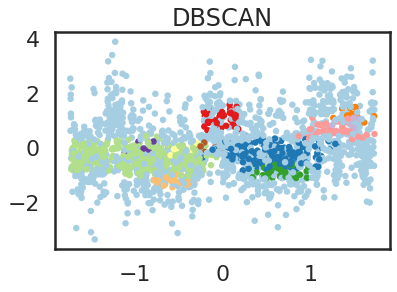

eps =  0.3 ,min_samples =  14 -1     1319
 2      182
 0      169
 1      111
 4       56
 5       46
 3       30
 6       19
 10      15
 9       14
 8       13
 11      12
 7        9
dtype: int64


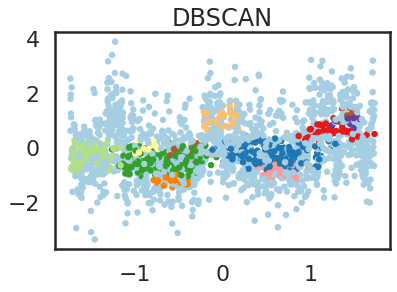

eps =  0.33 ,min_samples =  12  0    995
-1    870
 1     73
 3     17
 2     14
 4     14
 5     12
dtype: int64


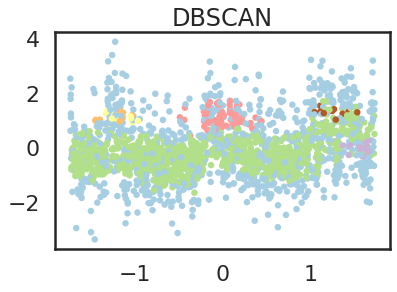

eps =  0.33 ,min_samples =  13  0    949
-1    943
 1     74
 2     16
 3     13
dtype: int64


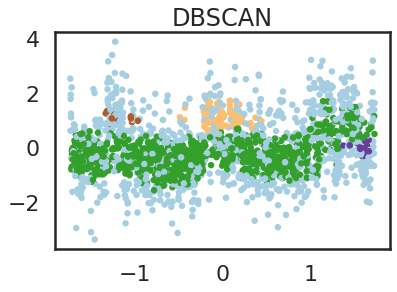

eps =  0.33 ,min_samples =  14 -1    1009
 0     889
 1      67
 3      16
 2      14
dtype: int64


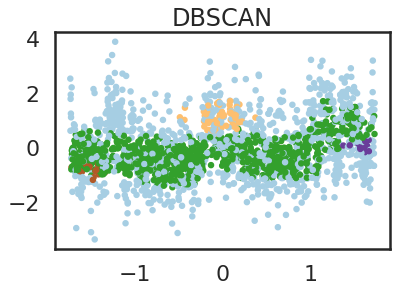

In [90]:
eps=[0.1,0.2,0.3,0.33] 
min_samples=[12,13,14]     
fin_rev_scaled=fin_rev[scale_columns]
for i in eps:
  for j in min_samples:
    dbscan = DBSCAN(eps=i, min_samples=j) 
    y_pred = dbscan.fit_predict(c)
    d=pd.DataFrame(y_pred)
    print('eps = ', i,',min_samples = ',j,d.value_counts() )
    plt.scatter(fin_rev['category1'], fin_rev['polarity'],c=y_pred, cmap='Paired',s=20) 
    plt.title("DBSCAN")
    plt.show()

eps =  0.3 ,min_samples =  13 -1    1009
 0     889
 1      67
 3      16
 2      14
dtype: int64


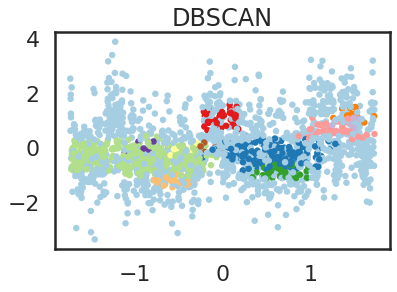

In [91]:
eps= 0.3
min_samples=13   
fin_rev_scaled=fin_rev[scale_columns]
dbscan = DBSCAN(eps=eps, min_samples=min_samples) 
fin_rev['clusterid'] = dbscan.fit_predict(c)
y_pred=fin_rev['clusterid'] 
print('eps = ', eps,',min_samples = ',min_samples,d.value_counts() )
plt.scatter(fin_rev['category1'], fin_rev['polarity'],c=y_pred, cmap='Paired',s=20) 
plt.title("DBSCAN")
plt.show()

In [92]:
clust_0 = fin_rev[fin_rev['clusterid']==0]['category'].unique()
print(len(clust_0))
clust_0

188


array(['["Video Games","Retro Gaming & Microconsoles","Super Nintendo","Games"]',
       '["Video Games","Retro Gaming & Microconsoles","Game Boy Advance","Consoles",""]',
       '["Video Games","Retro Gaming & Microconsoles","Sega Dreamcast","Consoles",""]',
       '["Video Games","Retro Gaming &amp; Microconsoles","Sega Dreamcast","Games",""]',
       '["Video Games","Retro Gaming &amp; Microconsoles","Game Boy Color","Games",""]',
       '["Video Games","Retro Gaming & Microconsoles","GameCube","Accessories"]',
       '["Video Games","Retro Gaming &amp; Microconsoles","GameCube","Accessories",""]',
       '["Video Games","PlayStation 4",""]',
       '["Video Games","Wii U","Games",""]',
       '["Video Games","Retro Gaming & Microconsoles","Game Boy Advance","","Mario Kart is back with over forty tracks and eight characters!","Play with up to three friends using single or multiple cartridge link.","Includes Grand Prix and Time Trial Modes.","This portable game blends features from t

In [93]:
clust_neg1 = fin_rev[fin_rev['clusterid']==-1]['category'].unique()
print(len(clust_neg1))
clust_neg1

1227


array(['["Video Games","PC","Games",""]',
       '["Video Games","Xbox 360","Games",""]',
       '["Video Games","PlayStation 3","Games",""]', ...,
       '["Video Games","Kids & Family","Nintendo DS","Games","","Build your home in the heartland","Earn profits to buy John Deere equipment","Great use of dual screens to monitor your farm","As your farm grows so do your customization choices","Uses both touch screen & Stylus"]',
       '["Video Games","Sony PSP","Accessories","","Officially Licensed S.P.F (Special Player Forces) Case for PS Vita","Shock resistant XL hard case to safely transport your PS Vita","Sliding locking system with secure opening mechanism. Double inner high-density foam inspired by military weapons cases","Unique military-themed design, directly inspired by the world of the special forces Alliance of black and silver color perfectly in line with PlayStationVita\'s design","Optimized for full compatibility with all PS Vita wireless features: Bluetooth / Near / Wi-Fi

In [94]:
clust_1 = fin_rev[fin_rev['clusterid']==1]['category'].unique()
print(len(clust_1))
clust_1

356


array(['["Video Games","PC","Games","","Action shooter game set in South Pacific","Hugely detailed environments and action sequences","Cunning and complex AI tactics","Nonlinear gameplay","For one player","Action shooter game set in South Pacific","Hugely detailed environments and action sequences"]',
       '["Video Games","Kids &amp; Family","Sony PSP","Games",""]',
       '["Video Games","Nintendo 3DS & 2DS",""]',
       '["Video Games","PC","Games","","Battle in over 20 missions as you accomplish yor mission objectives and turn back the Nazi tide","Over 21 different historically-accurate weapons -- from mounted machine guns to flame-throwers to stick grenades","Fully interactive environments allow you to use terrain as an advantage and destroy whatever is in your way","Special disguise mode lets you wear enemy uniforms and sneak around","Realistic battle action in the days of World War II!"]',
       '["Video Games","PC","Games","","A group of alien races called the Covenant is wip

In [95]:
cluster0=fin_rev[(fin_rev['clusterid'] == 0)]

In [96]:
cluster0high = cluster0.sort_values(by=['overall'], ascending=False)
cluster0high.head(10)

,counts,polarity,overall,category,category1,clusterid
1136,12,-0.311049,5.000000,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.395897,0
395,44,-0.226969,4.863636,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.399370,0
1002,14,-0.347715,4.857143,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.661565,0
399,42,-0.090079,4.857143,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.199685,0
1106,13,-0.297948,4.846154,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.210103,0
260,72,-0.191305,4.833333,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.310814,0
1807,6,-0.027537,4.833333,"[""Video Games"",""PlayStation 4"",""Accessories"",""...",0.097238,0
684,22,-0.510234,4.818182,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.757067,0
428,40,-0.304265,4.800000,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.562591,0
1297,10,-0.402949,4.800000,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.633783,0


In [97]:
cluster0low = cluster0.sort_values(by=['overall'], ascending=True)
cluster0low.head(10)


,counts,polarity,overall,category,category1,clusterid
658,24,-0.448444,3.833333,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.677193,0
572,28,-0.447182,3.857143,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.628574,0
525,31,-0.515919,3.870968,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.875142,0
268,70,-0.322529,3.885714,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.625101,0
190,112,-0.275252,3.910714,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.939388,0
278,68,-0.378998,3.970588,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.805686,0
1958,5,-0.674468,4.000000,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.536545,0
1355,10,-0.268558,4.000000,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.566064,0
1842,5,-0.294938,4.000000,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.800477,0
1178,12,-0.177191,4.000000,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.961961,0


In [98]:
clusterneg1=fin_rev[(fin_rev['clusterid'] == -1)]
clusterneg1high = clusterneg1.sort_values(by=['overall'], ascending=False)
clusterneg1high.head(10)

,counts,polarity,overall,category,category1,clusterid
1981,5,0.454002,5.0,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.465353,-1
1161,12,-0.240891,5.0,"[""Video Games"",""Mac"",""Games"","""",""Works on Mac ...",-1.321394,-1
1979,5,1.641210,5.0,"[""Video Games"",""Xbox 360"",""Accessories"",""Contr...",1.446415,-1
1941,5,2.613978,5.0,"[""Video Games"",""Xbox 360"",""Accessories"",""Contr...",1.416896,-1
1379,10,0.600679,5.0,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.369851,-1
1955,5,1.315308,5.0,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.421943,-1
1346,10,2.231239,5.0,"[""Video Games"",""Wii"",""Accessories"",""Memory""]",1.253675,-1
1328,10,1.339336,5.0,"[""Video Games"",""PC"",""Games"","""",""Included new A...",-0.604264,-1
1607,7,-1.078814,5.0,"[""Video Games"",""Sony PSP"",""Accessories"",""Cases...",1.020998,-1
1134,12,0.582591,5.0,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.925497,-1


In [99]:
clusterneg1low = clusterneg1.sort_values(by=['overall'], ascending=True)
clusterneg1low.head(10)

,counts,polarity,overall,category,category1,clusterid
1677,7,0.440971,1.000000,"[""Video Games"",""Wii"",""Points Cards""]",1.323131,-1
541,30,-0.950119,1.266667,"[""Video Games"",""PC"",""Games"","""",""Strategy game ...",-0.388952,-1
813,19,-1.717125,1.473684,"[""Video Games"",""PC"",""Games"","""",""Compilation pa...",-0.829995,-1
702,22,-2.494178,1.545455,"[""Video Games"",""PC"",""Games"","""",""The first expa...",-0.343806,-1
943,16,0.295850,1.687500,"[""Video Games"",""PlayStation 3"",""Accessories"",""...",-0.187530,-1
1604,7,-1.707660,1.714286,"[""Video Games"",""PC"",""Games"","""",""3rd-person act...",-0.977589,-1
1980,5,-3.071863,1.800000,"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""...",-1.495034,-1
1960,5,-1.953043,1.800000,"[""Video Games"",""PC"",""Games"","""",""Live the life ...",-0.566064,-1
494,34,-2.010031,1.823529,"[""Video Games"",""PC"",""Games"","""",""Create Your Un...",-0.816104,-1
1443,9,-0.961985,1.888889,"[""Video Games"",""PC"",""Games"","""",""Experience NAS...",-0.739703,-1


In [100]:
cluster1=fin_rev[(fin_rev['clusterid'] == 1)]
cluster1high = cluster1.sort_values(by=['overall'], ascending=False)
cluster1high.head(10)

,counts,polarity,overall,category,category1,clusterid
1461,9,-0.333391,4.777778,"[""Video Games"",""Kids & Family"",""Sony PSP"",""Gam...",-1.508925,1
455,37,-0.122453,4.729730,"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""...",-1.460306,1
1245,11,0.130250,4.727273,"[""Video Games"",""Kids & Family"",""Nintendo DS"",""...",-1.633945,1
185,115,0.027791,4.704348,"[""Video Games"",""Kids & Family"",""PlayStation 3""...",-1.559280,1
1410,9,0.276534,4.666667,"[""Video Games"",""Nintendo DS"",""Accessories"",""Ca...",-1.199847,1
1179,12,-0.059578,4.666667,"[""Video Games"",""Kids & Family"",""Xbox 360"",""Gam...",-1.404741,1
1231,11,0.078487,4.636364,"[""Video Games"",""PC"",""Games"","""",""Enjoy incredib...",-0.762276,1
904,16,0.014776,4.625000,"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""...",-1.462042,1
1103,13,-0.285683,4.615385,"[""Video Games"",""Kids & Family"",""PlayStation Vi...",-1.538443,1
459,36,-0.149548,4.611111,"[""Video Games"",""PC"",""Games"","""",""&nbsp;Back in ...",-1.001898,1


In [101]:
cluster1low = cluster1.sort_values(by=['overall'], ascending=True)
cluster1low.head(10)

,counts,polarity,overall,category,category1,clusterid
460,36,-1.002646,3.277778,"[""Video Games"",""PC"",""Games"","""",""After 20 years...",-0.937652,1
1343,10,-0.746528,3.300000,"[""Video Games"",""Nintendo DS"",""Games"","""",""Battl...",-1.123446,1
505,33,-0.991722,3.303030,"[""Video Games"",""PC"","""",""Open World Action - Lo...",-1.057463,1
830,18,-0.611770,3.333333,"[""Video Games"",""PC"",""Games"","""",""1,000 of the m...",-1.000162,1
1692,6,-0.397675,3.333333,"[""Video Games"",""PC"",""Games"","""",""Take control o...",-0.362906,1
578,28,-0.536477,3.357143,"[""Video Games"",""PC"",""Games"","""",""This new & imp...",-0.314287,1
899,16,-0.364346,3.375000,"[""Video Games"",""PC"",""Games"","""",""Locked.&nbsp; ...",-0.564327,1
1482,8,-0.597886,3.375000,"[""Video Games"",""PC"",""Games"","""",""Players will b...",-0.482717,1
473,35,-0.982011,3.400000,"[""Video Games"",""PC"",""Games"","""",""Atmosphere of ...",-0.925497,1
1397,10,-0.890482,3.400000,"[""Video Games"",""PC"",""Games"","""",""A captivating ...",-0.958488,1


In [102]:
cluster1high.to_csv('cluster1high.csv')

In [103]:
rev.head(3)

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790,Negative
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive,0.033333,Neutral
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429,Negative


In [105]:
import hdbscan
min_size=[9,13,14,17,18]
clusters=[]
outliers=[]
for i in min_size:
  clusterer_label = hdbscan.HDBSCAN(min_cluster_size=i).fit_predict(c)
  a,b=np.unique(clusterer_label,return_counts=True)
  print('---------','for',i,'min_samples','-------------')
  clusters.append(len(a))
  print('the number of clusters:',len(a))
  if(a[0]==-1):
    outliers.append(b[0])
    print('No. of outliers is: ',b[0])
  else:
    outliers.append(0)
    print('No. of outliers: 0')

--------- for 9 min_samples -------------
the number of clusters: 4
No. of outliers is:  1140
--------- for 13 min_samples -------------
the number of clusters: 3
No. of outliers is:  1068
--------- for 14 min_samples -------------
the number of clusters: 3
No. of outliers is:  1503
--------- for 17 min_samples -------------
the number of clusters: 3
No. of outliers is:  1453
--------- for 18 min_samples -------------
the number of clusters: 3
No. of outliers is:  1463


For:  9
no. of clusters formed are:  4
for min samples:  9 , cluster count:  
 clusterid
-1           1227
 1            356
 0            188
 3             64
 4             46
 2             38
 5             22
 6             17
 7             11
 9             11
 10             8
 8              7
dtype: int64


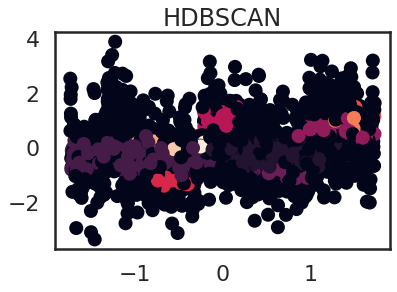

the number of clusters: 4
No. of outliers is:  1140
For:  13
no. of clusters formed are:  3
for min samples:  13 , cluster count:  
 clusterid
-1           1227
 1            356
 0            188
 3             64
 4             46
 2             38
 5             22
 6             17
 7             11
 9             11
 10             8
 8              7
dtype: int64


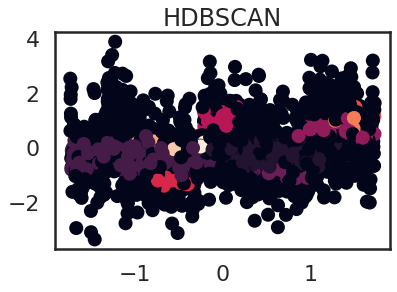

the number of clusters: 3
No. of outliers is:  1068
For:  14
no. of clusters formed are:  3
for min samples:  14 , cluster count:  
 clusterid
-1           1227
 1            356
 0            188
 3             64
 4             46
 2             38
 5             22
 6             17
 7             11
 9             11
 10             8
 8              7
dtype: int64


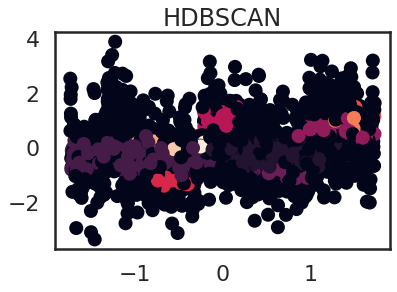

the number of clusters: 3
No. of outliers is:  1503
For:  17
no. of clusters formed are:  3
for min samples:  17 , cluster count:  
 clusterid
-1           1227
 1            356
 0            188
 3             64
 4             46
 2             38
 5             22
 6             17
 7             11
 9             11
 10             8
 8              7
dtype: int64


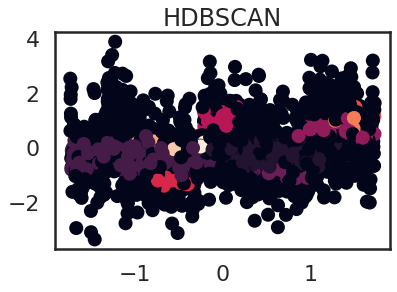

the number of clusters: 3
No. of outliers is:  1453
For:  18
no. of clusters formed are:  3
for min samples:  18 , cluster count:  
 clusterid
-1           1227
 1            356
 0            188
 3             64
 4             46
 2             38
 5             22
 6             17
 7             11
 9             11
 10             8
 8              7
dtype: int64


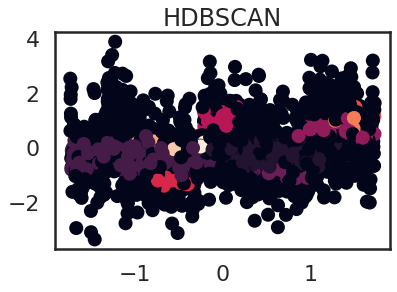

the number of clusters: 3
No. of outliers is:  1463


In [106]:
min_size=[9,13,14,17,18]
clusters=[]
outliers=[]
for i in min_size:
  clusterer_label = hdbscan.HDBSCAN(min_cluster_size=i).fit_predict(c)
  a,b=np.unique(clusterer_label,return_counts=True)
  print('For: ',i)
  clusters.append(len(a))
  print('no. of clusters formed are: ',len(a))
  d=pd.DataFrame(y_pred)
  print('for min samples: ',i,',','cluster count: ','\n',d.value_counts())
  plt.scatter(fin_rev['category1'],fin_rev['polarity'],c = y_pred)
  plt.title('HDBSCAN')
  plt.show()
  print('the number of clusters:',len(a))
  if(a[0]==-1):
    outliers.append(b[0])
    print('No. of outliers is: ',b[0])
  else:
    outliers.append(0)
    print('No. of outliers: 0')

In [107]:
test_data = np.vstack([c]) 

In [108]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=12, gen_min_span_tree=True) 
clusterer.fit(test_data)

HDBSCAN(gen_min_span_tree=True, min_cluster_size=12)

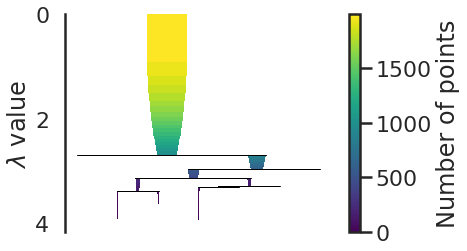

In [109]:
clusterer.condensed_tree_.plot()

HDBSCAN has 8 clusters with sillehoute score of 0.3409905638377929
DBSCAN has 9 clusters with sillehoute score of  0.3479687169298696
So in this case DBSCAN results are better

In [ ]:
rev

,product_id,helpful,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,700099867,"[8,12]",1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790,Negative
1,700099867,"[0,0]",4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive,0.033333,Neutral
2,700099867,"[0,0]",1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429,Negative
3,700099867,"[7,10]",3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral,-0.011501,Negative
4,700099867,"[2,2]",4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing game lapto...,50.0,Positive,0.039669,Neutral
...,...,...,...,...,...,...,...,...,...,...,...
228529,B00KAI3KW2,"[3,6]",5,AJQB6I00X8WAI,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-24,wow really one gaming consolemultimedia device...,33.0,Positive,0.189394,Positive
228530,B00KAI3KW2,"[17,88]",1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-14,microsoft decided remove camera thingy realize...,16.0,Negative,-0.450000,Negative
228531,B00KAI3KW2,"[2,4]",5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-07-19,xbox one initially announced revealed past jun...,33.0,Positive,0.041888,Neutral
228532,B00KAI3KW2,"[24,113]",2,A1M19BGTJ5PI1I,"[""Video Games"",""Xbox One"",""</span></span></spa...",2014-06-09,titanfall bundle low youre getting game kinect...,18.0,Negative,0.016944,Neutral


# Time Series Analysis Dataset 1

In [ ]:
tm = rev.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
tm

,overall,category,ReviewTime,polarity,polarity_sentiment
0,1,"[""Video Games"",""PC"",""Games""]",2012-07-09,-0.109790,Negative
1,4,"[""Video Games"",""PC"",""Games""]",2013-06-30,0.033333,Neutral
2,1,"[""Video Games"",""PC"",""Games""]",2014-06-28,-0.171429,Negative
3,3,"[""Video Games"",""PC"",""Games""]",2011-09-14,-0.011501,Negative
4,4,"[""Video Games"",""PC"",""Games""]",2011-06-14,0.039669,Neutral
...,...,...,...,...,...
228529,5,"[""Video Games"",""Xbox One"",""""]",2014-06-24,0.189394,Positive
228530,1,"[""Video Games"",""Xbox One"",""""]",2014-06-14,-0.450000,Negative
228531,5,"[""Video Games"",""Xbox One"",""""]",2014-07-19,0.041888,Neutral
228532,2,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.016944,Neutral


In [ ]:
tm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 228488 entries, 0 to 228533
Data columns (total 5 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   overall             228488 non-null  int64  
 1   category            228488 non-null  object 
 2   ReviewTime          228488 non-null  object 
 3   polarity            228488 non-null  float64
 4   polarity_sentiment  228488 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 10.5+ MB


In [ ]:
tm['ReviewTime'] = pd.to_datetime(tm['ReviewTime'])

In [ ]:
tm.dtypes

overall                        int64
category                      object
ReviewTime            datetime64[ns]
polarity                     float64
polarity_sentiment            object
dtype: object

In [ ]:
tm = tm.set_index("ReviewTime")
print(tm)

            overall                       category  polarity  \
ReviewTime                                                     
2012-07-09        1   ["Video Games","PC","Games"] -0.109790   
2013-06-30        4   ["Video Games","PC","Games"]  0.033333   
2014-06-28        1   ["Video Games","PC","Games"] -0.171429   
2011-09-14        3   ["Video Games","PC","Games"] -0.011501   
2011-06-14        4   ["Video Games","PC","Games"]  0.039669   
...             ...                            ...       ...   
2014-06-24        5  ["Video Games","Xbox One",""]  0.189394   
2014-06-14        1  ["Video Games","Xbox One",""] -0.450000   
2014-07-19        5  ["Video Games","Xbox One",""]  0.041888   
2014-06-09        2  ["Video Games","Xbox One",""]  0.016944   
2014-06-13        4  ["Video Games","Xbox One",""] -0.010417   

           polarity_sentiment  
ReviewTime                     
2012-07-09           Negative  
2013-06-30            Neutral  
2014-06-28           Negative  
2011-09

In [ ]:
tm=tm.sort_values(by='ReviewTime')
tm

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
1999-10-14,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.486667,Positive
1999-10-14,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.486667,Positive
1999-11-10,4,"[""Video Games"",""PC"",""Games"",""""]",0.115152,Positive
1999-11-10,4,"[""Video Games"",""PC"",""Games"",""""]",0.294048,Positive
1999-11-10,4,"[""Video Games"",""PC"",""Games"",""""]",0.294048,Positive
...,...,...,...,...
2014-07-22,2,"[""Video Games"",""PlayStation 4"",""Games"",""""]",0.102564,Positive
2014-07-22,2,"[""Video Games"",""PlayStation 4"",""Games"",""""]",-0.070160,Negative
2014-07-22,3,"[""Video Games"",""Xbox 360"",""Games"","""",""Co-opera...",0.500000,Positive


In [ ]:
tm = tm.resample('M').mean().round(2)

<AxesSubplot:xlabel='ReviewTime'>

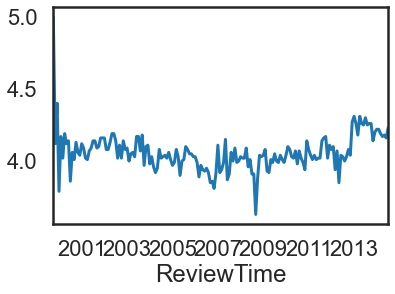

In [ ]:
tm.overall.plot()

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller,acf,pacf
from statsmodels.tsa.statespace.tools import diff
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from pandas.plotting import autocorrelation_plot
from pandas.tseries.offsets import DateOffset
import warnings
warnings.filterwarnings('ignore')

Text(0.5, 1.0, 'Random')

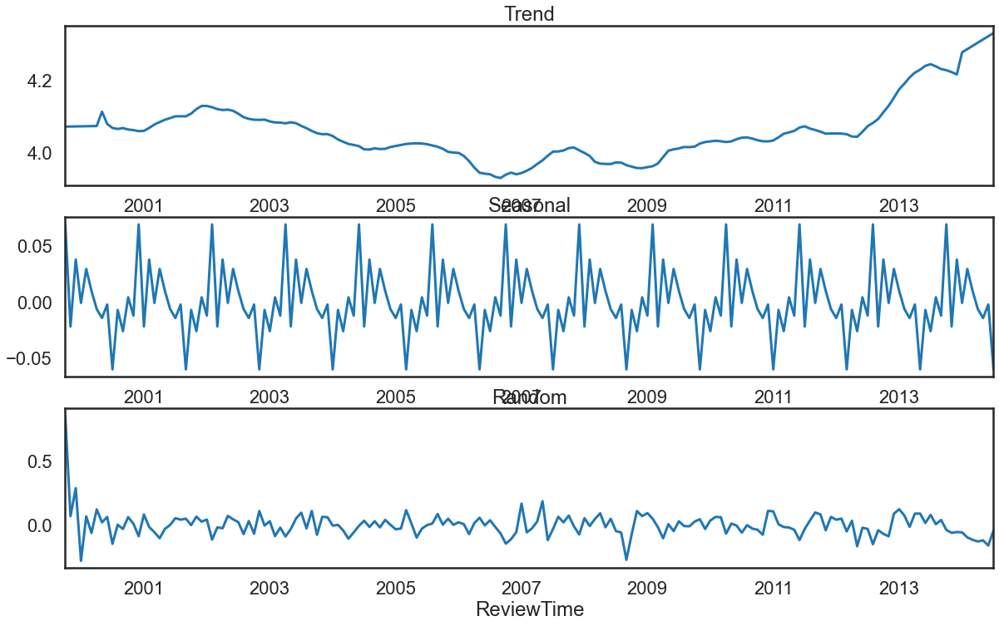

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(tm['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
tm1=tm['overall']
tm1

ReviewTime
1999-10-31    5.00
1999-11-30    4.12
1999-12-31    4.40
2000-01-31    3.79
2000-02-29    4.17
              ... 
2014-03-31    4.19
2014-04-30    4.17
2014-05-31    4.18
2014-06-30    4.16
2014-07-31    4.23
Freq: M, Name: overall, Length: 178, dtype: float64

In [ ]:
tm1 = pd.DataFrame(tm1)

In [ ]:
tm1

,overall
ReviewTime,
1999-10-31,5.00
1999-11-30,4.12
1999-12-31,4.40
2000-01-31,3.79
2000-02-29,4.17
...,...
2014-03-31,4.19
2014-04-30,4.17
2014-05-31,4.18


In [ ]:
def checkStationarity(tm1):
  pvalue = adfuller(tm1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(tm1);
ret

'p-value=0.05487989160286537. Data is not stationary'

In [ ]:
data_diff=tm1-tm1.shift()
data_diff

,overall
ReviewTime,
1999-10-31,NaN
1999-11-30,-0.88
1999-12-31,0.28
2000-01-31,-0.61
2000-02-29,0.38
...,...
2014-03-31,-0.03
2014-04-30,-0.02
2014-05-31,0.01


In [ ]:
checkStationarity(data_diff[1:].dropna())

'p-value=3.687148998666646e-17. Data is stationary'

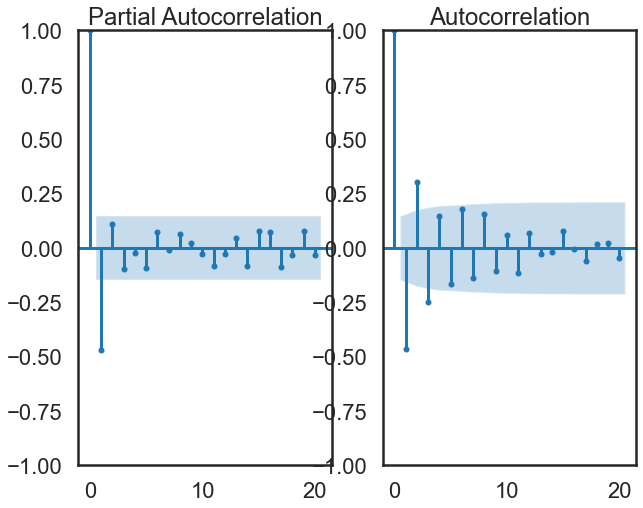

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(data_diff.dropna(),lags=20,ax=ax[0])
plot_acf(data_diff.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(tm1['overall'])) 
train_df = tm1.iloc[:ss] 
test_df = tm1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 142, test = 36


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 142, test = 36


## ARMA

In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  142
Model:                 ARIMA(7, 0, 6)   Log Likelihood                 127.253
Date:                Wed, 09 Mar 2022   AIC                           -224.505
Time:                        01:21:44   BIC                           -180.168
Sample:                    10-31-1999   HQIC                          -206.488
                         - 07-31-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.0610      0.040    101.455      0.000       3.983       4.139
ar.L1          0.9021      1.118      0.807      0.420      -1.289       3.093
ar.L2         -0.2254      0.534     -0.422      0.6

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
1999-10-31    4.060989
1999-11-30    3.487033
1999-12-31    4.823137
2000-01-31    3.843009
2000-02-29    4.492616
2000-03-31    3.885760
2000-04-30    4.456407
2000-05-31    3.888492
2000-06-30    4.265546
2000-07-31    3.881505
2000-08-31    4.045983
2000-09-30    3.875977
2000-10-31    4.230580
2000-11-30    4.020924
2000-12-31    4.165718
2001-01-31    4.007660
2001-02-28    4.119623
2001-03-31    4.008412
2001-04-30    4.038675
2001-05-31    4.019686
2001-06-30    4.082576
2001-07-31    4.087014
2001-08-31    4.114543
2001-09-30    4.110756
2001-10-31    4.075205
2001-11-30    4.069124
2001-12-31    4.123535
2002-01-31    4.139111
2002-02-28    4.120476
2002-03-31    4.119961
2002-04-30    4.097696
2002-05-31    4.120605
2002-06-30    4.132232
2002-07-31    4.143091
2002-08-31    4.100494
2002-09-30    4.070466
Freq: M, Name: predicted_mean, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

    actual  predicted       err
0     5.00   4.060989  0.939011
1     4.12   3.487033  0.632967
2     4.40   4.823137 -0.423137
3     3.79   3.843009 -0.053009
4     4.17   4.492616 -0.322616
5     4.02   3.885760  0.134240
6     4.19   4.456407 -0.266407
7     4.12   3.888492  0.231508
8     4.14   4.265546 -0.125546
9     3.86   3.881505 -0.021505
10    4.06   4.045983  0.014017
11    4.01   3.875977  0.134023
12    4.13   4.230580 -0.100580
13    4.06   4.020924  0.039076
14    4.04   4.165718 -0.125718
15    4.12   4.007660  0.112340
16    4.09   4.119623 -0.029623
17    4.02   4.008412  0.011588
18    4.01   4.038675 -0.028675
19    4.07   4.019686  0.050314
20    4.09   4.082576  0.007424
21    4.14   4.087014  0.052986
22    4.14   4.114543  0.025457
23    4.09   4.110756 -0.020756
24    4.10   4.075205  0.024795
25    4.16   4.069124  0.090876
26    4.16   4.123535  0.036465
27    4.16   4.139111  0.020889
28    4.08   4.120476 -0.040476
29    4.08   4.119961 -0.039961
30    4.

In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.05068871069009992
	RMSE = 0.22514153479555904


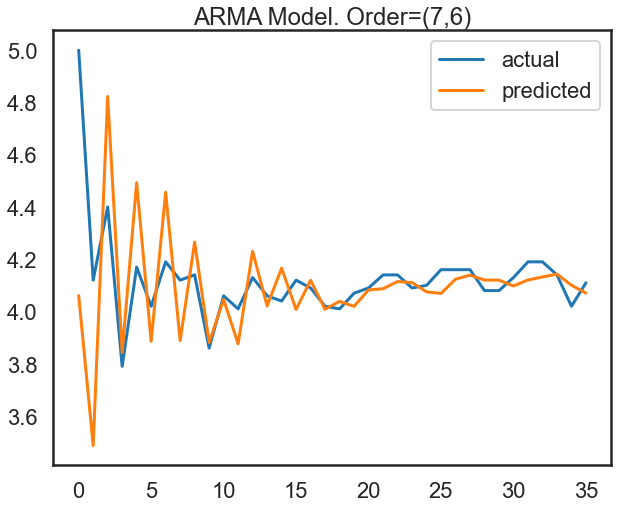

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m1)

2011-08-31    4.049251
2011-09-30    4.063697
2011-10-31    4.031415
2011-11-30    3.987892
2011-12-31    4.040443
2012-01-31    4.040006
2012-02-29    4.043177
2012-03-31    4.052421
2012-04-30    4.080153
2012-05-31    4.038427
2012-06-30    4.042461
2012-07-31    4.043272
2012-08-31    4.054473
2012-09-30    4.037469
2012-10-31    4.069217
2012-11-30    4.060757
2012-12-31    4.061737
2013-01-31    4.046618
2013-02-28    4.064717
2013-03-31    4.044746
2013-04-30    4.058262
2013-05-31    4.054771
2013-06-30    4.069995
2013-07-31    4.051709
2013-08-31    4.066980
2013-09-30    4.053844
2013-10-31    4.062423
2013-11-30    4.049442
2013-12-31    4.067613
2014-01-31    4.054195
2014-02-28    4.066562
Freq: M, Name: predicted_mean, dtype: float64


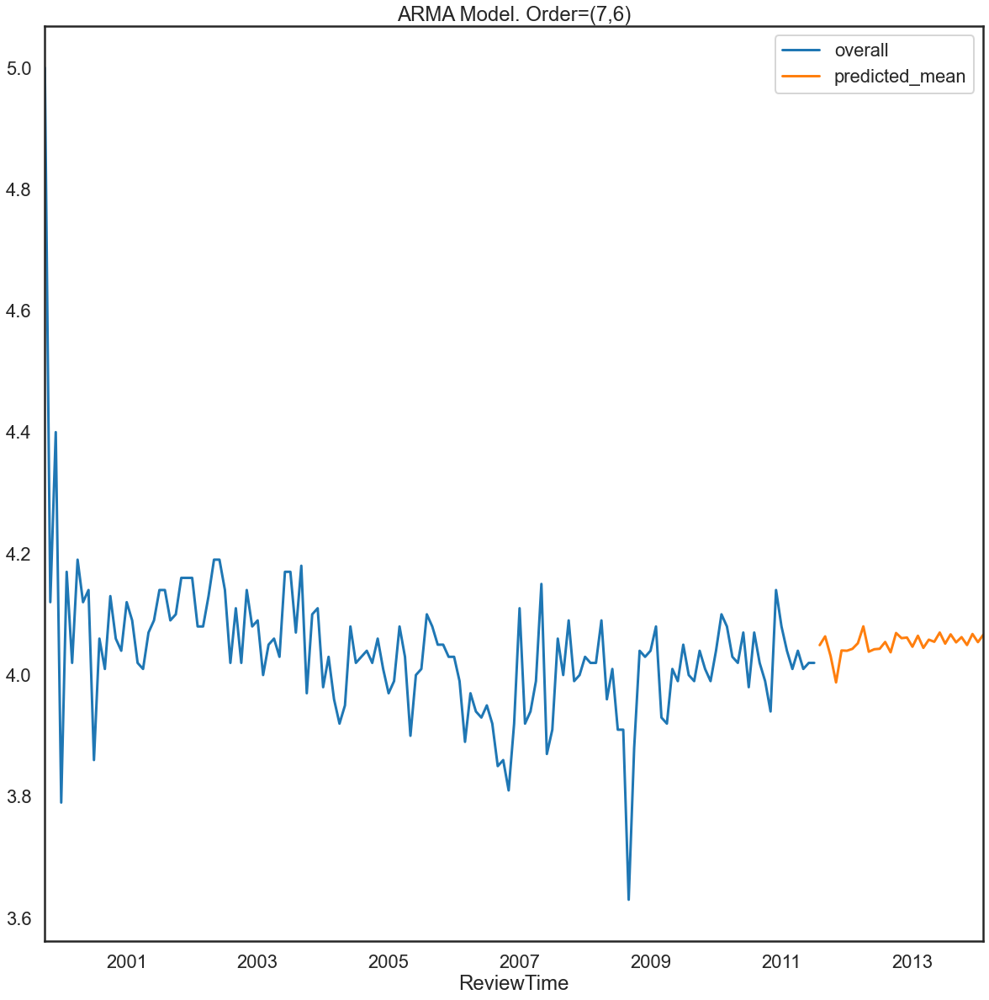

In [ ]:
train.plot(figsize=(20,20),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## ARIMA

In [ ]:
m2 = auto_arima(train,start_p=1,max_p=3, start_q=1,max_q=3, seasonal=False, trace=True)
print(m2.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-223.112, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-166.965, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-217.965, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-209.273, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-168.574, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-220.122, Time=0.27 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-226.139, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-207.620, Time=0.30 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-233.489, Time=0.30 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=-232.315, Time=0.33 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-231.987, Time=0.31 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-231.802, Time=0.27 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-231.512, Time=0.27 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=-229.561, Time=0.42 sec
 ARIMA(2,1,2)(0,0,0)[0]          

In [ ]:
p=2
d=1
q=2
m2 = ARIMA(train,order=(p,d,q)).fit()
print(m2.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  142
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 121.975
Date:                Wed, 09 Mar 2022   AIC                           -233.950
Time:                        01:21:51   BIC                           -219.207
Sample:                    10-31-1999   HQIC                          -227.959
                         - 07-31-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4306      0.086     -5.021      0.000      -0.599      -0.263
ar.L2          0.5409      0.084      6.444      0.000       0.376       0.705
ma.L1         -0.2757      0.088     -3.141      0.0

In [ ]:
predictions1=m2.predict(0,len(train)-1)
predictions1

ReviewTime
1999-10-31    0.000000
1999-11-30    5.000000
1999-12-31    4.898904
2000-01-31    4.036922
2000-02-29    4.488515
                ...   
2011-03-31    4.004860
2011-04-30    4.042393
2011-05-31    4.008444
2011-06-30    4.040146
2011-07-31    4.004092
Freq: M, Name: predicted_mean, Length: 142, dtype: float64

In [ ]:
actual = []; pred = []
for i in range(len(predictions1)):
  actual.append(train[i])
  pred.append(predictions1[i])
df_res1 = pd.DataFrame({'actual':actual, 'predicted':pred})
df_res1['err'] = df_res1.actual - df_res1.predicted
print(df_res1)

     actual  predicted       err
0      5.00   0.000000  5.000000
1      4.12   5.000000 -0.880000
2      4.40   4.898904 -0.498904
3      3.79   4.036922 -0.246922
4      4.17   4.488515 -0.318515
..      ...        ...       ...
137    4.01   4.004860  0.005140
138    4.04   4.042393 -0.002393
139    4.01   4.008444  0.001556
140    4.02   4.040146 -0.020146
141    4.02   4.004092  0.015908

[142 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m2.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg1 = 'ARIMA Model. Order=(' + str(p) + ',' + str(d) + ',' + str(q) + ')'
mse1 = mean_squared_error(df_res1.actual, df_res1.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse1,np.sqrt(mse1)))

ARMA Model. Order=(7,6)
	MSE = 0.19133363523487446
	RMSE = 0.4374170038245821


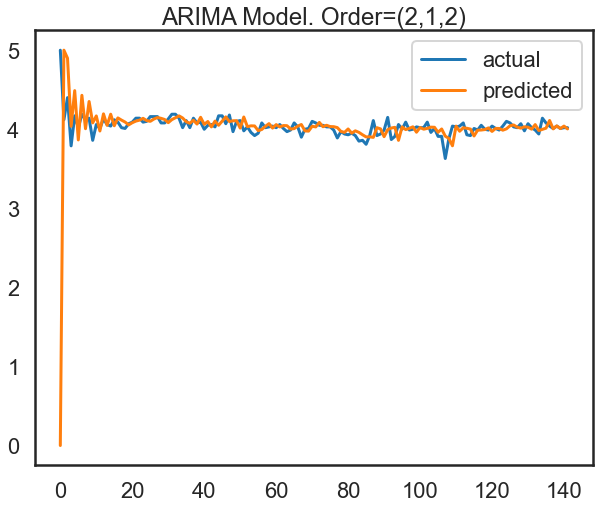

In [ ]:
df_res1.actual.plot(figsize=(10,8),legend=True)
df_res1.predicted.plot(legend=True)
plt.title(msg1)
plt.show()

In [ ]:
fcast_m2 = m2.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m2)

2011-08-31    4.033056
2011-09-30    4.017932
2011-10-31    4.031507
2011-11-30    4.017481
2011-12-31    4.030863
2012-01-31    4.017514
2012-02-29    4.030501
2012-03-31    4.017688
2012-04-30    4.030230
2012-05-31    4.017898
2012-06-30    4.029993
2012-07-31    4.018115
2012-08-31    4.029771
2012-09-30    4.018327
2012-10-31    4.029560
2012-11-30    4.018532
2012-12-31    4.029357
2013-01-31    4.018731
2013-02-28    4.029162
2013-03-31    4.018923
2013-04-30    4.028974
2013-05-31    4.019107
2013-06-30    4.028793
2013-07-31    4.019285
2013-08-31    4.028618
2013-09-30    4.019456
2013-10-31    4.028450
2013-11-30    4.019622
2013-12-31    4.028288
2014-01-31    4.019781
2014-02-28    4.028132
Freq: M, Name: predicted_mean, dtype: float64


Text(0.5, 1.0, 'ARIMA Model. Order=(2,1,2)')

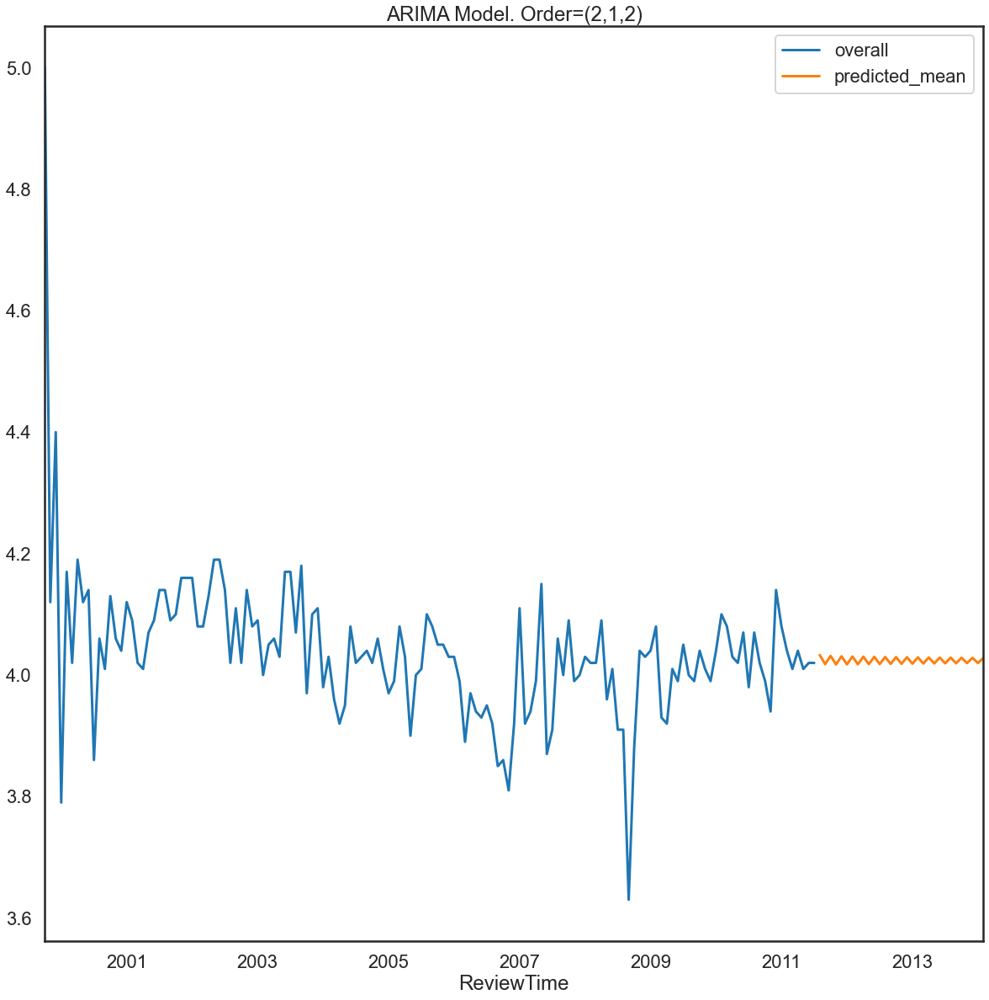

In [ ]:
train.plot(figsize=(20,20),legend=True)
fcast_m2.plot(legend=True)
plt.title(msg1)

## SARIMA

In [ ]:
m3 = SARIMAX(train, order=(2,1,2), seasonal_order=(1,1,1,30)).fit()
m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                              overall   No. Observations:                  142
Model:             SARIMAX(2, 1, 2)x(1, 1, [1], 30)   Log Likelihood                  77.631
Date:                              Wed, 09 Mar 2022   AIC                           -141.262
Time:                                      01:21:57   BIC                           -122.295
Sample:                                  10-31-1999   HQIC                          -133.567
                                       - 07-31-2011                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4471      0.154     -2.901      0.004      -0.749      -0.145
ar.L2          0.5255      0.144      3.656      0.000       0.244       0.807
ma.L1         -0.3338      0.136     -2.463      0.014      -0.599      -0.068
ma.L2         -0.5545      0.088     -6.295      0.000      -0.727      -0.382
ar.S.L30       0.0525      0.359      0.146      0.884      -0.652       0.757
ma.S.L30      -0.6164      0.457     -1.348      0.178      -1.513       0.280
sigma2         0.0128      0.002      6.326      0.000       0.009       0.017
===================================================================================
Ljung-Box (L1) (Q):                   1.05   Jarque-Bera (JB):                18.07
Prob(Q):                              0.30   Prob(JB):                         0.00
Heteroskedasticity (H):               0.42   Skew:                             0.73
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
predictions2=m3.predict(0,len(test)-1)
predictions2

ReviewTime
1999-10-31    0.000000
1999-11-30    5.000000
1999-12-31    4.120000
2000-01-31    4.400000
2000-02-29    3.790000
2000-03-31    4.170000
2000-04-30    4.020000
2000-05-31    4.190000
2000-06-30    4.120000
2000-07-31    4.140000
2000-08-31    3.860000
2000-09-30    4.060000
2000-10-31    4.010000
2000-11-30    4.130000
2000-12-31    4.060000
2001-01-31    4.040000
2001-02-28    4.120000
2001-03-31    4.090000
2001-04-30    4.020000
2001-05-31    4.010000
2001-06-30    4.070000
2001-07-31    4.090000
2001-08-31    4.140000
2001-09-30    4.140000
2001-10-31    4.090000
2001-11-30    4.100000
2001-12-31    4.160000
2002-01-31    4.160000
2002-02-28    4.160000
2002-03-31    4.080000
2002-04-30    6.580000
2002-05-31    3.250000
2002-06-30    3.674552
2002-07-31    3.909786
2002-08-31    3.852250
2002-09-30    4.221134
Freq: M, Name: predicted_mean, dtype: float64

In [ ]:
# actual vs predicted values
# print("test = {}, predicted = {}".format(len(test), len(predictions) ))
actual = []; pred= [] 
for i in range(len(predictions2)):
    actual.append(train[i]) 
    pred.append(predictions2[i]) 
df_res3 = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res3['err'] = df_res3.actual- df_res3.predicted
print(df_res3) #MAE Mean(|E|)

    actual  predicted           err
0     5.00   0.000000  5.000000e+00
1     4.12   5.000000 -8.799998e-01
2     4.40   4.120000  2.799998e-01
3     3.79   4.400000 -6.099998e-01
4     4.17   3.790000  3.799998e-01
5     4.02   4.170000 -1.499998e-01
6     4.19   4.020000  1.699998e-01
7     4.12   4.190000 -6.999975e-02
8     4.14   4.120000  1.999976e-02
9     3.86   4.140000 -2.799998e-01
10    4.06   3.860000  1.999998e-01
11    4.01   4.060000 -4.999976e-02
12    4.13   4.010000  1.199998e-01
13    4.06   4.130000 -6.999978e-02
14    4.04   4.060000 -2.000022e-02
15    4.12   4.040000  8.000020e-02
16    4.09   4.120000 -3.000019e-02
17    4.02   4.090000 -6.999983e-02
18    4.01   4.020000 -1.000017e-02
19    4.07   4.010000  6.000015e-02
20    4.09   4.070000  1.999986e-02
21    4.14   4.090000  5.000013e-02
22    4.14   4.140000 -1.156282e-07
23    4.09   4.140000 -4.999990e-02
24    4.10   4.090000  9.999903e-03
25    4.16   4.100000  6.000009e-02
26    4.16   4.160000 -7.224

In [ ]:
mse2=mean_squared_error(df_res3.actual,df_res3.predicted)
print("\n\tMSE = {}\n\tRMSE = {}".format(mse2,np.sqrt(mse2)))


	MSE = 0.9400909677078566
	RMSE = 0.9695828833616322


<AxesSubplot:>

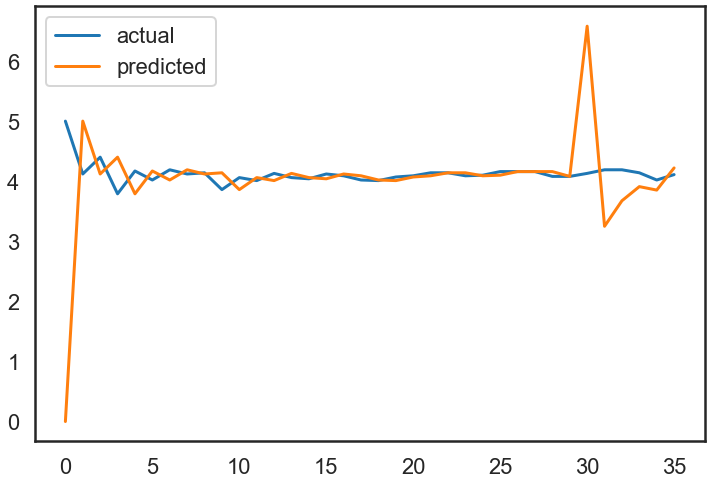

In [ ]:
df_res3[['actual','predicted']].plot(figsize=(12,8))

In [ ]:
fcast_m3 = m3.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m3)

2011-08-31    4.053534
2011-09-30    3.932394
2011-10-31    3.944940
2011-11-30    3.965817
2011-12-31    4.030644
2012-01-31    4.069067
2012-02-29    4.026153
2012-03-31    4.005765
2012-04-30    4.096953
2012-05-31    4.075673
2012-06-30    4.002753
2012-07-31    3.987276
2012-08-31    4.055992
2012-09-30    4.056370
2012-10-31    4.040679
2012-11-30    4.011431
2012-12-31    4.037054
2013-01-31    3.990057
2013-02-28    4.042638
2013-03-31    4.023038
2013-04-30    4.029093
2013-05-31    3.970527
2013-06-30    4.079573
2013-07-31    4.036275
2013-08-31    4.002521
2013-09-30    3.912978
2013-10-31    3.977380
2013-11-30    4.007191
2013-12-31    4.018851
2014-01-31    4.005537
2014-02-28    4.041232
Freq: M, Name: predicted_mean, dtype: float64


<AxesSubplot:xlabel='ReviewTime'>

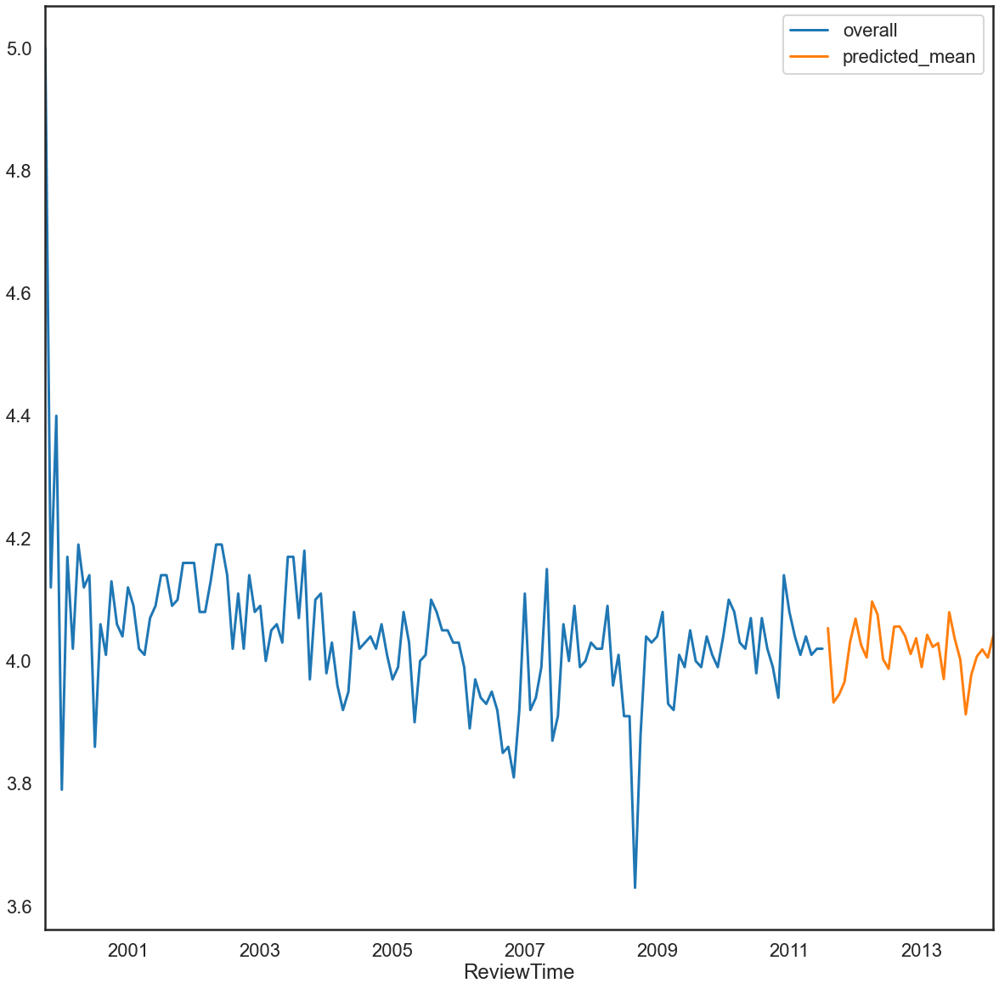

In [ ]:
train.plot(figsize=(20,20),legend=True)
fcast_m3.plot(legend=True)

ARMA Model is the best as it has the lowest RMSE

## Finding for positive,neutral and negative polarity sentiments

## Neutral

In [155]:
top = rev[(rev['polarity_sentiment'] == 'Neutral')]
top

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
1,700099867,4,A3UR8NLLY1ZHCX,"[""Video Games"",""PC"",""Games""]",2013-06-30,like rally car get game funit oriented since a...,0.0,Positive,0.033333,Neutral
4,700099867,4,A361M14PU2GUEG,"[""Video Games"",""PC"",""Games""]",2011-06-14,dirt xbox okay game started playing game lapto...,50.0,Positive,0.039669,Neutral
16,700099867,4,A20DRRKAN5Z9Q,"[""Video Games"",""PC"",""Games""]",2012-03-19,today game market easy miss racing game arent ...,50.0,Positive,0.054655,Neutral
23,700099867,3,A1CB8HH9YJ2YZE,"[""Video Games"",""PC"",""Games""]",2012-06-09,pretty fun game buy car track online store gam...,50.0,Neutral,0.047277,Neutral
24,700099867,5,A2LQCBLLJVVR5T,"[""Video Games"",""PC"",""Games""]",2011-06-13,must gamer codemasters really hit home run one...,45.0,Positive,0.050369,Neutral
...,...,...,...,...,...,...,...,...,...,...
228511,B00KAI3KW2,5,AKCXS6JVW6E8L,"[""Video Games"",""Xbox One"",""""]",2014-06-09,love console brings living room together perfe...,38.0,Positive,0.087986,Neutral
228515,B00KAI3KW2,1,A1DDGFYGFY6TDC,"[""Video Games"",""Xbox One"",""""]",2014-06-09,know superior hardware xbox one kinect cool fe...,14.0,Negative,0.048611,Neutral
228521,B00KAI3KW2,4,A2VCOIPPA48ICC,"[""Video Games"",""Xbox One"",""""]",2014-06-17,removal kinect using resource improve quality ...,29.0,Positive,0.033333,Neutral
228531,B00KAI3KW2,5,A2IGEPJJYKMOWK,"[""Video Games"",""Xbox One"",""""]",2014-07-19,xbox one initially announced revealed past jun...,33.0,Positive,0.041888,Neutral


In [156]:
top = top.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
top

,overall,category,ReviewTime,polarity,polarity_sentiment
1,4,"[""Video Games"",""PC"",""Games""]",2013-06-30,0.033333,Neutral
4,4,"[""Video Games"",""PC"",""Games""]",2011-06-14,0.039669,Neutral
16,4,"[""Video Games"",""PC"",""Games""]",2012-03-19,0.054655,Neutral
23,3,"[""Video Games"",""PC"",""Games""]",2012-06-09,0.047277,Neutral
24,5,"[""Video Games"",""PC"",""Games""]",2011-06-13,0.050369,Neutral
...,...,...,...,...,...
228511,5,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.087986,Neutral
228515,1,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.048611,Neutral
228521,4,"[""Video Games"",""Xbox One"",""""]",2014-06-17,0.033333,Neutral
228531,5,"[""Video Games"",""Xbox One"",""""]",2014-07-19,0.041888,Neutral


In [157]:
top['ReviewTime'] = pd.to_datetime(top['ReviewTime'])

In [158]:
top = top.set_index("ReviewTime")
print(top)

            overall                       category  polarity  \
ReviewTime                                                     
2013-06-30        4   ["Video Games","PC","Games"]  0.033333   
2011-06-14        4   ["Video Games","PC","Games"]  0.039669   
2012-03-19        4   ["Video Games","PC","Games"]  0.054655   
2012-06-09        3   ["Video Games","PC","Games"]  0.047277   
2011-06-13        5   ["Video Games","PC","Games"]  0.050369   
...             ...                            ...       ...   
2014-06-09        5  ["Video Games","Xbox One",""]  0.087986   
2014-06-09        1  ["Video Games","Xbox One",""]  0.048611   
2014-06-17        4  ["Video Games","Xbox One",""]  0.033333   
2014-07-19        5  ["Video Games","Xbox One",""]  0.041888   
2014-06-09        2  ["Video Games","Xbox One",""]  0.016944   

           polarity_sentiment  
ReviewTime                     
2013-06-30            Neutral  
2011-06-14            Neutral  
2012-03-19            Neutral  
2012-06

In [159]:
top=top.sort_values(by='ReviewTime')
top

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
1999-11-10,2,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.060000,Neutral
1999-11-10,2,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.060000,Neutral
1999-11-19,5,"[""Video Games"",""PC"",""Games"",""""]",0.053954,Neutral
1999-11-19,5,"[""Video Games"",""PC"",""Games"",""""]",0.053954,Neutral
1999-11-26,5,"[""Video Games"",""PC"",""Games"","""",""Space Game"",""T...",0.012500,Neutral
...,...,...,...,...
2014-07-22,4,"[""Video Games"",""PC""]",0.000000,Neutral
2014-07-22,5,"[""Video Games"",""PC"",""Accessories"",""Gaming Keyb...",0.000000,Neutral
2014-07-22,4,"[""Video Games"",""Kids & Family"",""PlayStation 4""...",0.000000,Neutral


In [160]:
top = top.resample('W').mean().round(2)

In [161]:
top = top.interpolate(method='linear')
top

,overall,polarity
ReviewTime,,
1999-11-14,2.00,0.06
1999-11-21,5.00,0.05
1999-11-28,5.00,0.01
1999-12-05,4.43,0.05
1999-12-12,4.43,0.06
...,...,...
2014-06-29,4.08,0.05
2014-07-06,4.20,0.04
2014-07-13,4.12,0.04


<AxesSubplot:xlabel='ReviewTime'>

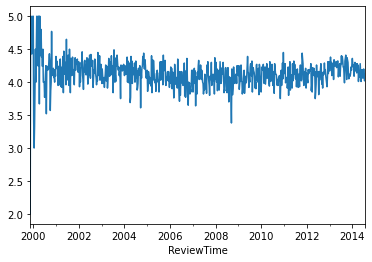

In [162]:
top.overall.plot()

Text(0.5, 1.0, 'Random')

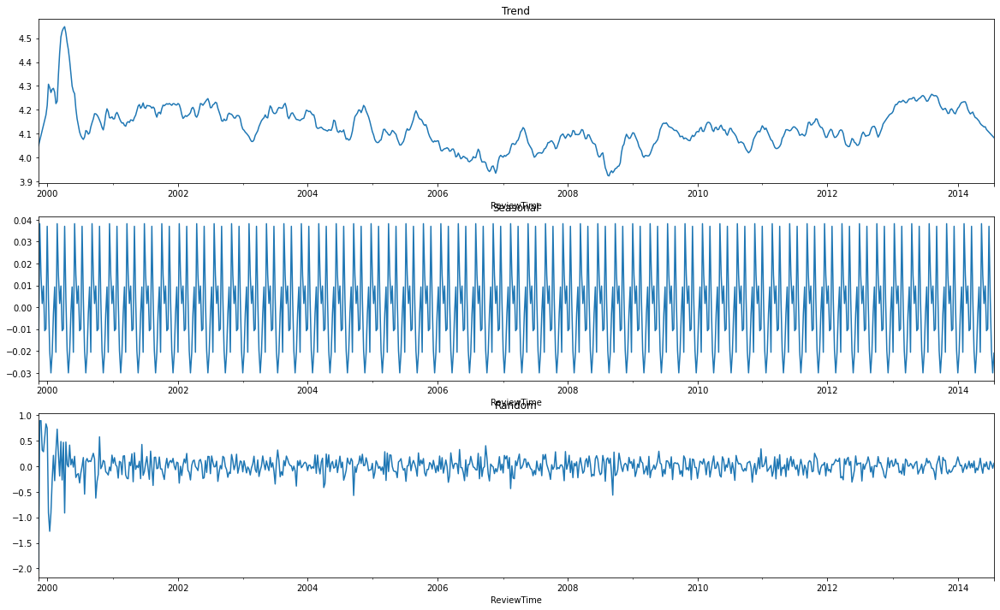

In [163]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(top['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [164]:
top1=top['overall']
top1

ReviewTime
1999-11-14    2.00
1999-11-21    5.00
1999-11-28    5.00
1999-12-05    4.43
1999-12-12    4.43
              ... 
2014-06-29    4.08
2014-07-06    4.20
2014-07-13    4.12
2014-07-20    4.02
2014-07-27    4.12
Freq: W-SUN, Name: overall, Length: 768, dtype: float64

In [165]:
top1 = pd.DataFrame(top1)

In [166]:
def checkStationarity(top1):
  pvalue = adfuller(top1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [167]:
ret = checkStationarity(top1);
ret

'p-value=2.142258640653892e-16. Data is stationary'

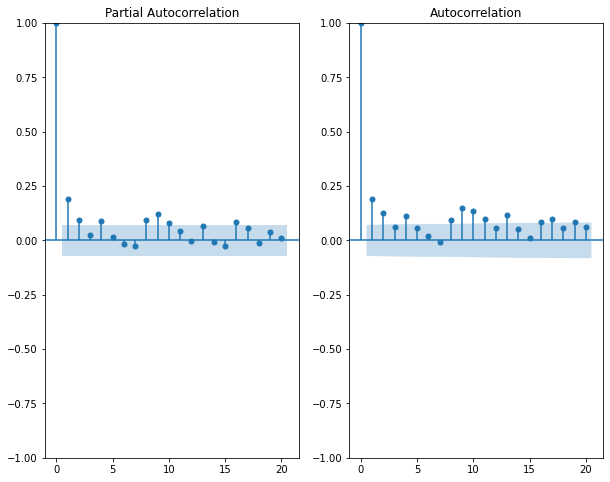

In [168]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(top1,lags=20,ax=ax[0])
plot_acf(top1.dropna(),lags=20,ax=ax[1])
plt.show()

In [169]:
ss = int(0.80 * len(top1['overall'])) 
train_df = top1.iloc[:ss] 
test_df = top1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 614, test = 154


In [170]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 614, test = 154


In [171]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  614
Model:                 ARIMA(7, 0, 6)   Log Likelihood                  61.858
Date:                Sun, 13 Mar 2022   AIC                            -93.716
Time:                        17:49:29   BIC                            -27.416
Sample:                    11-14-1999   HQIC                           -67.934
                         - 08-14-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.1286      0.023    176.883      0.000       4.083       4.174
ar.L1         -0.4240      0.182     -2.329      0.020      -0.781      -0.067
ar.L2          1.1660      0.090     13.002      0.0

In [172]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
1999-11-14    4.128584
1999-11-21    3.753541
1999-11-28    4.069989
1999-12-05    4.255904
1999-12-12    4.084001
                ...   
2002-09-22    4.164463
2002-09-29    4.173892
2002-10-06    4.182877
2002-10-13    4.207112
2002-10-20    4.192812
Freq: W-SUN, Name: predicted_mean, Length: 154, dtype: float64


In [173]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      2.00   4.128584 -2.128584
1      5.00   3.753541  1.246459
2      5.00   4.069989  0.930011
3      4.43   4.255904  0.174096
4      4.43   4.084001  0.345999
..      ...        ...       ...
149    4.31   4.164463  0.145537
150    4.12   4.173892 -0.053892
151    4.07   4.182877 -0.112877
152    3.96   4.207112 -0.247112
153    4.08   4.192812 -0.112812

[154 rows x 3 columns]


In [174]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [175]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.12323562495447052
	RMSE = 0.351049319831944


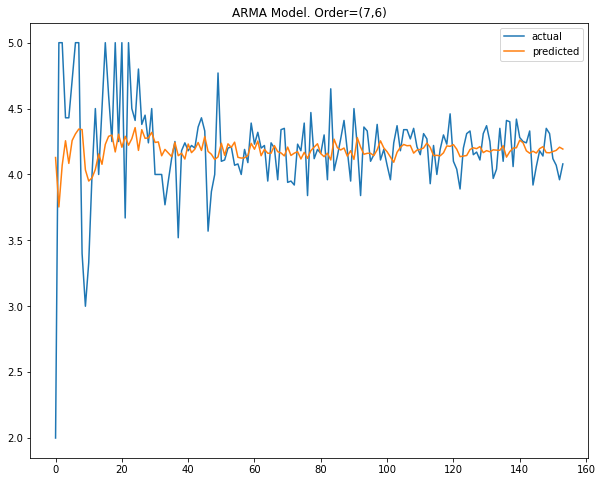

In [176]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [177]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+50, typ='levels')
print(fcast_m1)

2011-08-21    4.119084
2011-08-28    4.120306
2011-09-04    4.087051
2011-09-11    4.076123
2011-09-18    4.087551
2011-09-25    4.106799
2011-10-02    4.130634
2011-10-09    4.121540
2011-10-16    4.107127
2011-10-23    4.086707
2011-10-30    4.082596
2011-11-06    4.102104
2011-11-13    4.112737
2011-11-20    4.129606
2011-11-27    4.110459
2011-12-04    4.102761
2011-12-11    4.086294
2011-12-18    4.094465
2011-12-25    4.108919
2012-01-01    4.117520
2012-01-08    4.122806
2012-01-15    4.104870
2012-01-22    4.099692
2012-01-29    4.091504
2012-02-05    4.102800
2012-02-12    4.114201
2012-02-19    4.117105
2012-02-26    4.117482
2012-03-04    4.100702
2012-03-11    4.101033
2012-03-18    4.096608
2012-03-25    4.110046
2012-04-01    4.115481
2012-04-08    4.115921
2012-04-15    4.112359
2012-04-22    4.100056
2012-04-29    4.103416
2012-05-06    4.102164
2012-05-13    4.114270
2012-05-20    4.115300
2012-05-27    4.113808
2012-06-03    4.109281
2012-06-10    4.101111
2012-06-17 

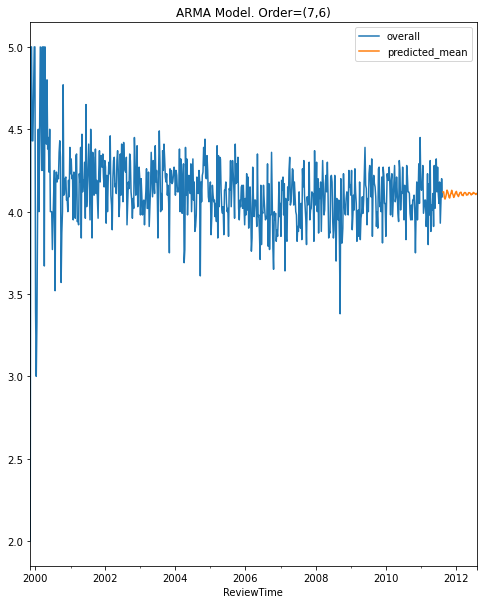

In [178]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Negative

In [419]:
sec = rev[(rev['polarity_sentiment'] == 'Negative')]
sec

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790,Negative
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429,Negative
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral,-0.011501,Negative
5,700099867,4,A2UTRVO4FDCBH6,"[""Video Games"",""PC"",""Games""]",2013-05-11,overall well done racing game good graphic tim...,0.0,Positive,-0.076285,Negative
7,700099867,1,AQTC623NCESZW,"[""Video Games"",""PC"",""Games""]",2012-11-24,cant tell piece dog game like everything else ...,20.0,Negative,-0.224126,Negative
...,...,...,...,...,...,...,...,...,...,...
228507,B00KAI3KW2,3,A2BVX2MCXPP49R,"[""Video Games"",""Xbox One"",""""]",2014-06-24,hey finally able go buy xbox one xbox one got ...,34.0,Neutral,-0.038762,Negative
228510,B00KAI3KW2,1,A1ZR8AIM298DFT,"[""Video Games"",""Xbox One"",""""]",2014-07-09,still isnt worth weak console overall buy inst...,15.0,Negative,-0.025000,Negative
228519,B00KAI3KW2,1,AQOFQWJYJRA5W,"[""Video Games"",""Xbox One"",""""]",2014-06-15,bought xbox one hour ago along copy ryse game ...,25.0,Negative,-0.235294,Negative
228530,B00KAI3KW2,1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""""]",2014-06-14,microsoft decided remove camera thingy realize...,16.0,Negative,-0.450000,Negative


In [420]:
sec['ReviewTime'] = pd.to_datetime(sec['ReviewTime'])

In [421]:
sec = sec.set_index("ReviewTime")
print(sec)

            product_id  overall      reviewerID  \
ReviewTime                                        
2012-07-09   700099867        1  A2HD75EMZR8QLN   
2014-06-28   700099867        1  A1INA0F5CWW3J4   
2011-09-14   700099867        3  A1DLMTOTHQ4AST   
2013-05-11   700099867        4  A2UTRVO4FDCBH6   
2012-11-24   700099867        1   AQTC623NCESZW   
...                ...      ...             ...   
2014-06-24  B00KAI3KW2        3  A2BVX2MCXPP49R   
2014-07-09  B00KAI3KW2        1  A1ZR8AIM298DFT   
2014-06-15  B00KAI3KW2        1   AQOFQWJYJRA5W   
2014-06-14  B00KAI3KW2        1  A1MHB1HRR6VPEH   
2014-06-13  B00KAI3KW2        4  A3PG9EEZMT9CJF   

                                 category  \
ReviewTime                                  
2012-07-09   ["Video Games","PC","Games"]   
2014-06-28   ["Video Games","PC","Games"]   
2011-09-14   ["Video Games","PC","Games"]   
2013-05-11   ["Video Games","PC","Games"]   
2012-11-24   ["Video Games","PC","Games"]   
...                  

In [422]:
sec=sec.sort_values(by='ReviewTime')
sec

,product_id,overall,reviewerID,category,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
ReviewTime,,,,,,,,,
1999-11-25,B00000DMAD,5,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"","""",""3-D Adventure""]",liked full trottle love lucasarts game general...,42.0,Positive,-3.529412e-02,Negative
1999-11-25,B00001W0J2,5,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",funkyist phates game late much fun ive recomme...,33.0,Positive,-9.251859e-18,Negative
1999-11-25,B00001W0J2,5,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",funkyist phates game late much fun ive recomme...,33.0,Positive,-9.251859e-18,Negative
1999-11-25,B00004SWKG,4,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",without doubt violent bloody driving game ever...,0.0,Positive,-2.649351e-01,Negative
1999-11-25,B00004SWKG,4,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",without doubt violent bloody driving game ever...,0.0,Positive,-2.649351e-01,Negative
...,...,...,...,...,...,...,...,...,...
2014-07-22,B00BMFIXKQ,1,A3D8VKH8GUOBYV,"[""Video Games"",""PlayStation 3"",""""]",game okay progress anything storyline need pur...,0.0,Negative,-5.000000e-03,Negative
2014-07-22,B00CX6XKK6,1,AO5CE7DBUWCDK,"[""Video Games"",""Xbox One"",""Games"",""""]",still terrible game wasted multiplayer unplaya...,0.0,Negative,-2.666667e-01,Negative
2014-07-22,B00I5LMSE2,1,ALI31O6E1W9EA,"[""Video Games"",""Kids & Family"",""Nintendo 3DS"",...",got game becose beat battlefield bored eat stu...,0.0,Negative,-2.000000e-01,Negative


In [423]:
sec = sec.resample('W').mean().round(2)

In [424]:
sec = sec.interpolate(method='linear')
sec

,overall,helpful_rate,polarity
ReviewTime,,,
1999-11-28,3.550,31.82,-0.07
1999-12-05,3.275,39.91,-0.07
1999-12-12,3.000,48.00,-0.07
1999-12-19,5.000,0.00,-0.01
1999-12-26,2.000,43.00,-0.18
...,...,...,...
2014-06-29,3.400,7.56,-0.11
2014-07-06,3.530,5.55,-0.17
2014-07-13,3.350,4.03,-0.18


<AxesSubplot:xlabel='ReviewTime'>

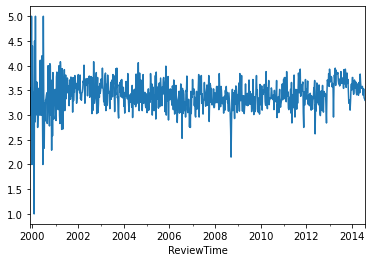

In [425]:
sec.overall.plot()

Text(0.5, 1.0, 'Random')

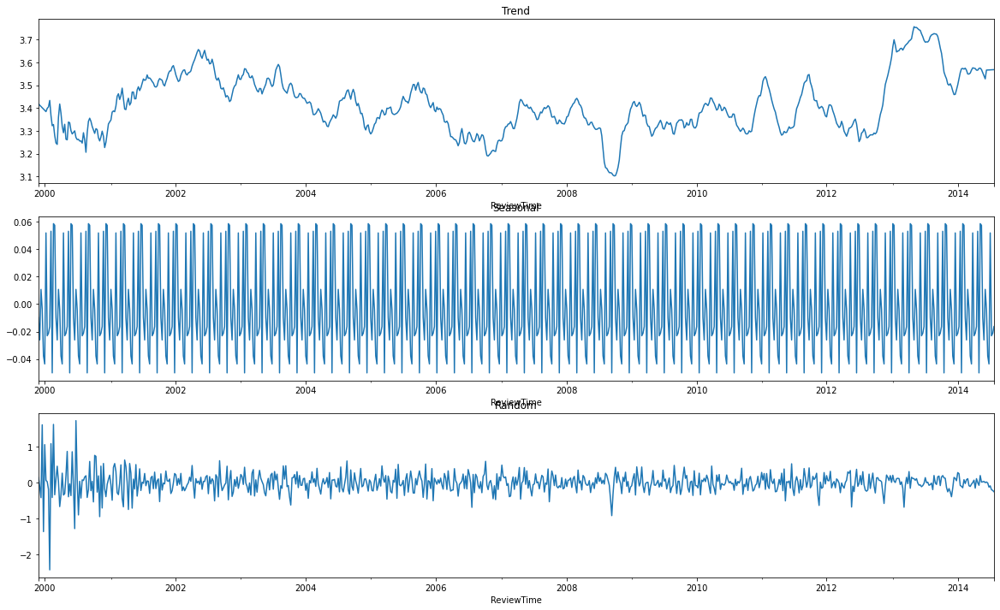

In [426]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(sec['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [427]:
sec1=sec['overall']
sec1

ReviewTime
1999-11-28    3.550
1999-12-05    3.275
1999-12-12    3.000
1999-12-19    5.000
1999-12-26    2.000
              ...  
2014-06-29    3.400
2014-07-06    3.530
2014-07-13    3.350
2014-07-20    3.330
2014-07-27    3.300
Freq: W-SUN, Name: overall, Length: 766, dtype: float64

In [428]:
sec1 = pd.DataFrame(sec1)

In [429]:
def checkStationarity(sec1):
  pvalue = adfuller(sec1)[1]
  if(pvalue>0.05):
    msg1 = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg1='p-value={}. Data is stationary'.format(pvalue)
  return(msg1)

In [430]:
ret = checkStationarity(sec1);
ret

'p-value=0.014131563521006058. Data is stationary'

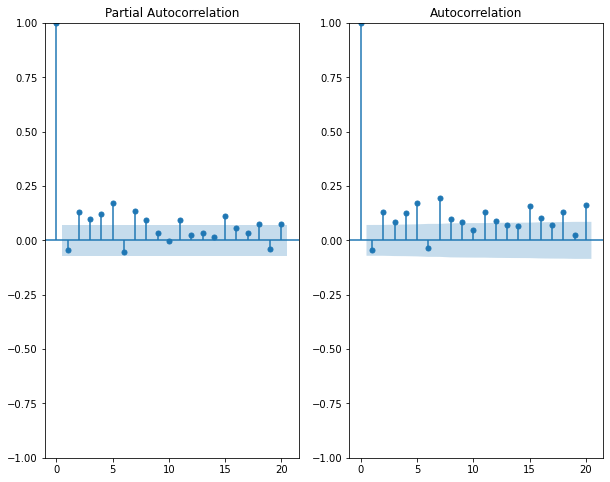

In [431]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(sec1,lags=20,ax=ax[0])
plot_acf(sec1,lags=20,ax=ax[1])
plt.show()

In [432]:
ss = int(0.80 * len(sec1['overall'])) 
train_df = sec1.iloc[:ss] 
test_df = sec1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 612, test = 154


In [433]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 612, test = 154


In [434]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  612
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -172.106
Date:                Sun, 13 Mar 2022   AIC                            374.212
Time:                        20:28:53   BIC                            440.463
Sample:                    11-28-1999   HQIC                           399.979
                         - 08-14-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.3884      0.017    202.032      0.000       3.356       3.421
ar.L1          0.1954      0.803      0.243      0.808      -1.379       1.770
ar.L2          0.0957      0.722      0.133      0.8

In [435]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
1999-11-28    3.388395
1999-12-05    3.357053
1999-12-12    3.423582
1999-12-19    3.452099
1999-12-26    3.064162
                ...   
2002-10-06    3.374630
2002-10-13    3.467710
2002-10-20    3.437394
2002-10-27    3.263379
2002-11-03    3.488340
Freq: W-SUN, Name: predicted_mean, Length: 154, dtype: float64


In [436]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0     3.550   3.388395  0.161605
1     3.275   3.357053 -0.082053
2     3.000   3.423582 -0.423582
3     5.000   3.452099  1.547901
4     2.000   3.064162 -1.064162
..      ...        ...       ...
149   3.390   3.374630  0.015370
150   3.490   3.467710  0.022290
151   3.860   3.437394  0.422606
152   3.030   3.263379 -0.233379
153   3.550   3.488340  0.061660

[154 rows x 3 columns]


In [437]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [438]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.22817185621735878
	RMSE = 0.4776733781752535


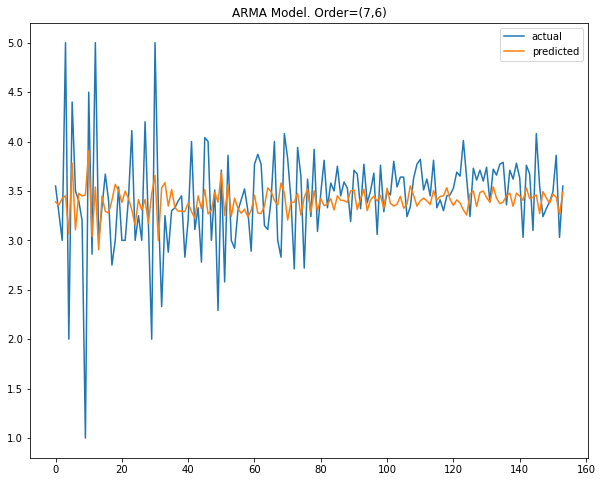

In [439]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [440]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+40, typ='levels')
print(fcast_m1)

2011-08-21    3.405433
2011-08-28    3.345498
2011-09-04    3.397763
2011-09-11    3.381799
2011-09-18    3.369571
2011-09-25    3.379215
2011-10-02    3.401176
2011-10-09    3.382317
2011-10-16    3.375696
2011-10-23    3.394633
2011-10-30    3.401389
2011-11-06    3.377295
2011-11-13    3.382937
2011-11-20    3.401105
2011-11-27    3.392905
2011-12-04    3.373673
2011-12-11    3.391012
2011-12-18    3.400853
2011-12-25    3.383229
2012-01-01    3.376186
2012-01-08    3.398664
2012-01-15    3.395617
2012-01-22    3.376900
2012-01-29    3.383679
2012-02-05    3.402372
2012-02-12    3.387364
2012-02-19    3.375899
2012-02-26    3.392536
2012-03-04    3.400386
2012-03-11    3.379488
2012-03-18    3.380311
2012-03-25    3.399068
2012-04-01    3.393706
2012-04-08    3.375334
2012-04-15    3.388128
2012-04-22    3.400743
2012-04-29    3.385264
2012-05-06    3.376555
2012-05-13    3.395969
2012-05-20    3.397075
2012-05-27    3.378586
Freq: W-SUN, Name: predicted_mean, dtype: float64


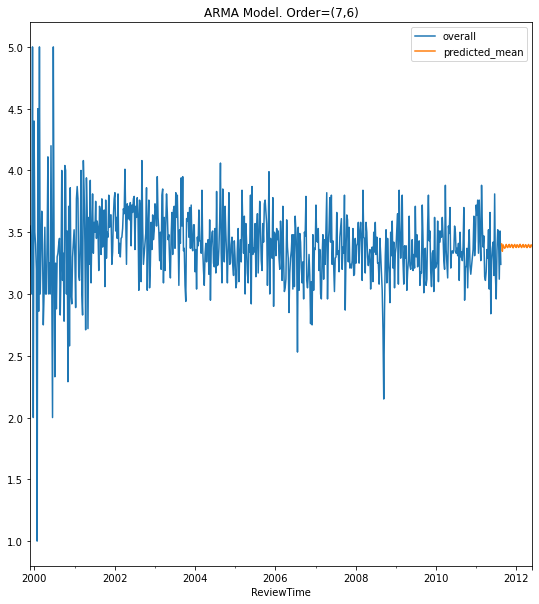

In [441]:
train.plot(figsize=(9,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Positive

In [268]:
third = rev[(rev['polarity_sentiment'] == 'Positive')]
third

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
6,700099867,5,AN3YYDZAS3O1Y,"[""Video Games"",""PC"",""Games""]",2011-08-14,loved playing dirt thought graphic good purcha...,46.0,Positive,0.265385,Positive
10,700099867,5,A38NXTZUFB1O2K,"[""Video Games"",""PC"",""Games""]",2011-06-28,im quite finished game dirt tour mode believe ...,50.0,Positive,0.184149,Positive
11,700099867,5,ANW6EGY12V5XS,"[""Video Games"",""PC"",""Games""]",2011-10-19,playing car racing game since early beginning ...,0.0,Positive,0.235880,Positive
13,700099867,1,A248LSBZT4P38V,"[""Video Games"",""PC"",""Games""]",2014-06-30,bought key didnt work gift recipient wasnt abl...,0.0,Negative,0.157143,Positive
15,700099867,1,A14L115LBOB0A5,"[""Video Games"",""PC"",""Games""]",2013-07-15,game ripoff le terrain le track le feature dir...,50.0,Negative,0.150000,Positive
...,...,...,...,...,...,...,...,...,...,...
228525,B00KAI3KW2,5,A1XNZ7PCE45KK7,"[""Video Games"",""Xbox One"",""""]",2014-06-10,day one version bought version xbox college so...,44.0,Positive,0.110833,Positive
228526,B00KAI3KW2,5,A25NSTXNN16KG8,"[""Video Games"",""Xbox One"",""""]",2014-06-09,let get one thing way youre looking console po...,39.0,Positive,0.138462,Positive
228527,B00KAI3KW2,1,A37T2MU6L4521N,"[""Video Games"",""Xbox One"",""""]",2014-06-22,prosgreat netflixhas forza old halo game xbox ...,16.0,Negative,0.193457,Positive
228528,B00KAI3KW2,5,A3D8VPZNKYIAP0,"[""Video Games"",""Xbox One"",""""]",2014-06-09,ahh bought kinect version thats awesome consol...,34.0,Positive,0.344773,Positive


In [269]:
third['ReviewTime'] = pd.to_datetime(third['ReviewTime'])

In [270]:
third=third.sort_values(by='ReviewTime')
third

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
7219,B0000296O5,5,A2AXQTB83VMK4L,"[""Video Games"",""Retro Gaming & Microconsoles"",...",1999-10-14,im fun ive ever playstation highly recommend b...,50.0,Positive,0.486667,Positive
7220,B0000296O5,5,A2AXQTB83VMK4L,"[""Video Games"",""Retro Gaming & Microconsoles"",...",1999-10-14,im fun ive ever playstation highly recommend b...,50.0,Positive,0.486667,Positive
2294,B00000JL6V,4,AMGJMFJ63DWWH,"[""Video Games"",""PC"",""Games"",""""]",1999-11-10,put hand book enter another worldthis time riv...,50.0,Positive,0.294048,Positive
6715,B000021XYY,4,AMGJMFJ63DWWH,"[""Video Games"",""PC"",""Games"",""""]",1999-11-10,game actually scared couple time witnessed sup...,48.0,Positive,0.115152,Positive
5244,B00001NFUA,5,AMGJMFJ63DWWH,"[""Video Games"",""PC"",""Games"",""""]",1999-11-10,gabriel knight want slacker writerit turn dest...,48.0,Positive,0.156250,Positive
...,...,...,...,...,...,...,...,...,...,...
86113,B0001UEHP8,3,A3RL3JVFKCKDNW,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-07-22,great gamesthree star,0.0,Neutral,0.800000,Positive
132923,B000TG531G,4,A3RL3JVFKCKDNW,"[""Video Games"",""Xbox 360"",""Games"",""""]",2014-07-22,great game lot funfour star,0.0,Positive,0.200000,Positive
91057,B0002B90SA,4,A3RL3JVFKCKDNW,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-07-22,good love blade colorsfour star,0.0,Positive,0.600000,Positive
208165,B00784HHUM,4,A3RL3JVFKCKDNW,"[""Video Games"",""PC"",""Games"","""",""Kotor I - A ma...",2014-07-22,one best game historyfour star,0.0,Positive,0.300000,Positive


In [271]:
third = third.set_index("ReviewTime")
print(third)

            product_id  overall      reviewerID  \
ReviewTime                                        
1999-10-14  B0000296O5        5  A2AXQTB83VMK4L   
1999-10-14  B0000296O5        5  A2AXQTB83VMK4L   
1999-11-10  B00000JL6V        4   AMGJMFJ63DWWH   
1999-11-10  B000021XYY        4   AMGJMFJ63DWWH   
1999-11-10  B00001NFUA        5   AMGJMFJ63DWWH   
...                ...      ...             ...   
2014-07-22  B0001UEHP8        3  A3RL3JVFKCKDNW   
2014-07-22  B000TG531G        4  A3RL3JVFKCKDNW   
2014-07-22  B0002B90SA        4  A3RL3JVFKCKDNW   
2014-07-22  B00784HHUM        4  A3RL3JVFKCKDNW   
2014-07-22  B00BGAA0SU        5  A1YCTG1JN1BA2X   

                                                     category  \
ReviewTime                                                      
1999-10-14  ["Video Games","Retro Gaming & Microconsoles",...   
1999-10-14  ["Video Games","Retro Gaming & Microconsoles",...   
1999-11-10                    ["Video Games","PC","Games",""]   
1999-11-10 

In [272]:
third = third.resample('W').mean().round(2)

In [273]:
third1 =third.interpolate(method='linear')
third1

,overall,helpful_rate,polarity
ReviewTime,,,
1999-10-17,5.00,50.00,0.4900
1999-10-24,4.90,49.50,0.4375
1999-10-31,4.80,49.00,0.3850
1999-11-07,4.70,48.50,0.3325
1999-11-14,4.60,48.00,0.2800
...,...,...,...
2014-06-29,4.52,5.20,0.3000
2014-07-06,4.59,3.09,0.3600
2014-07-13,4.56,1.71,0.3600


<AxesSubplot:xlabel='ReviewTime'>

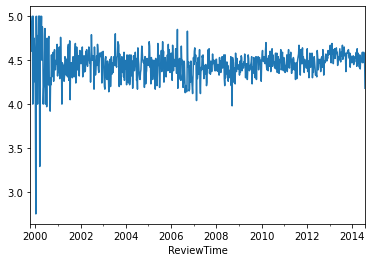

In [274]:
third1.overall.plot()

Text(0.5, 1.0, 'Random')

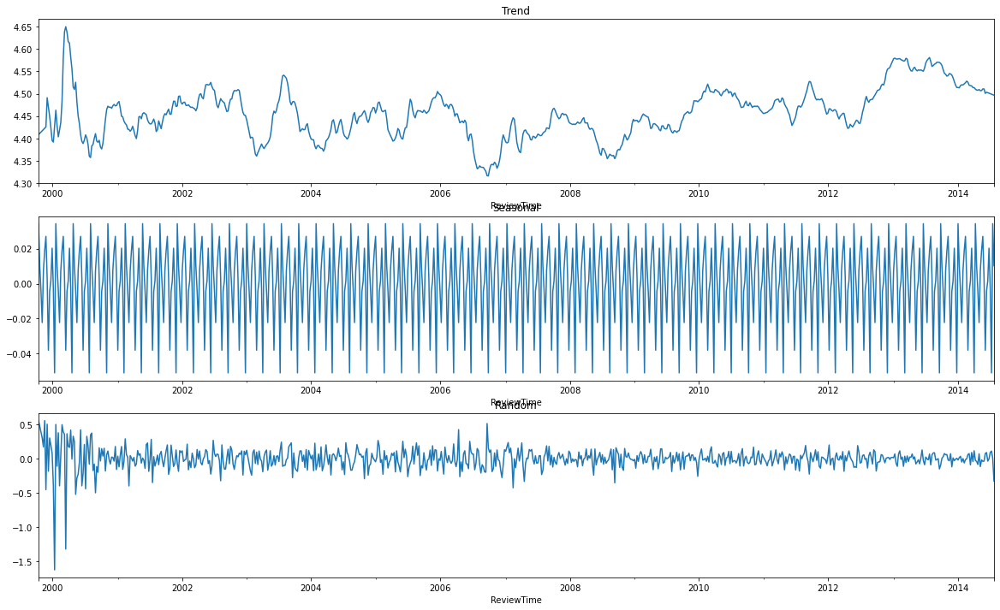

In [275]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(third1['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [276]:
third2=third1['overall']
third2

ReviewTime
1999-10-17    5.00
1999-10-24    4.90
1999-10-31    4.80
1999-11-07    4.70
1999-11-14    4.60
              ... 
2014-06-29    4.52
2014-07-06    4.59
2014-07-13    4.56
2014-07-20    4.54
2014-07-27    4.18
Freq: W-SUN, Name: overall, Length: 772, dtype: float64

In [277]:
third2 = pd.DataFrame(third2)

In [278]:
def checkStationarity(third2):
  pvalue = adfuller(third2)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [279]:
ret = checkStationarity(third2);
ret

'p-value=0.00013245024004339558. Data is stationary'

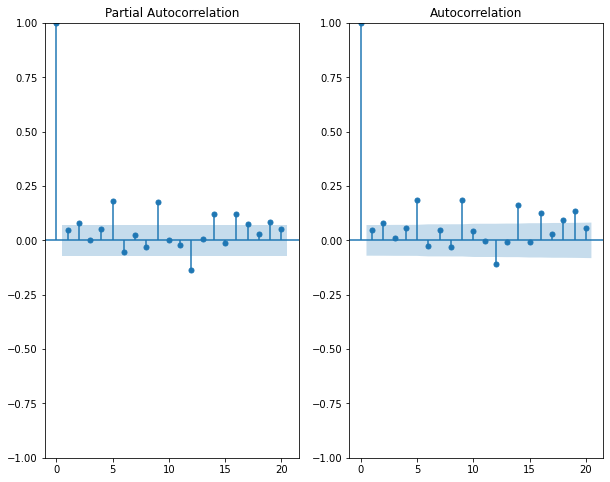

In [280]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(third2,lags=20,ax=ax[0])
plot_acf(third2,lags=20,ax=ax[1])
plt.show()

In [281]:
ss = int(0.80 * len(third1['overall'])) 
train_df = third2.iloc[:ss] 
test_df = third2.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 617, test = 155


In [282]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 617, test = 155


In [283]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  617
Model:                 ARIMA(7, 0, 6)   Log Likelihood                 218.208
Date:                Sun, 13 Mar 2022   AIC                           -406.416
Time:                        17:56:46   BIC                           -340.043
Sample:                    10-17-1999   HQIC                          -380.611
                         - 08-07-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.4455      0.008    582.053      0.000       4.431       4.460
ar.L1          0.1444      0.092      1.575      0.115      -0.035       0.324
ar.L2         -0.1568      0.061     -2.586      0.0

In [284]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
1999-10-17    4.445514
1999-10-24    4.436040
1999-10-31    4.409337
1999-11-07    4.327005
1999-11-14    4.374972
                ...   
2002-09-01    4.506055
2002-09-08    4.440219
2002-09-15    4.394893
2002-09-22    4.481787
2002-09-29    4.442352
Freq: W-SUN, Name: predicted_mean, Length: 155, dtype: float64


In [285]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      5.00   4.445514  0.554486
1      4.90   4.436040  0.463960
2      4.80   4.409337  0.390663
3      4.70   4.327005  0.372995
4      4.60   4.374972  0.225028
..      ...        ...       ...
150    4.33   4.506055 -0.176055
151    4.34   4.440219 -0.100219
152    4.47   4.394893  0.075107
153    4.55   4.481787  0.068213
154    4.44   4.442352 -0.002352

[155 rows x 3 columns]


In [286]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [287]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.07002507979553306
	RMSE = 0.26462252322040364


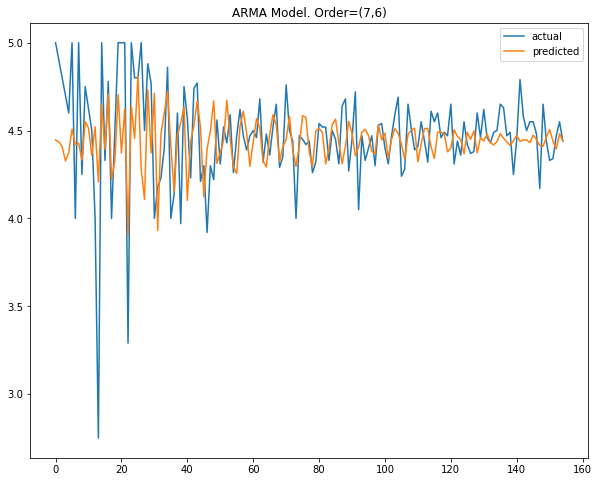

In [288]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [289]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+38, typ='levels')
print(fcast_m1)

2011-08-14    4.480992
2011-08-21    4.468485
2011-08-28    4.428107
2011-09-04    4.409597
2011-09-11    4.436929
2011-09-18    4.475946
2011-09-25    4.461802
2011-10-02    4.432921
2011-10-09    4.426044
2011-10-16    4.459116
2011-10-23    4.469540
2011-10-30    4.439141
2011-11-06    4.413868
2011-11-13    4.429517
2011-11-20    4.472059
2011-11-27    4.471253
2011-12-04    4.440252
2011-12-11    4.419782
2011-12-18    4.444086
2011-12-25    4.467870
2012-01-01    4.451018
2012-01-08    4.422620
2012-01-15    4.424328
2012-01-22    4.463448
2012-01-29    4.474986
2012-02-05    4.448306
2012-02-12    4.418586
2012-02-19    4.431576
2012-02-26    4.463137
2012-03-04    4.461106
2012-03-11    4.433875
2012-03-18    4.422030
2012-03-25    4.452226
2012-04-01    4.473331
2012-04-08    4.455961
2012-04-15    4.422356
2012-04-22    4.423038
2012-04-29    4.456033
2012-05-06    4.467525
Freq: W-SUN, Name: predicted_mean, dtype: float64


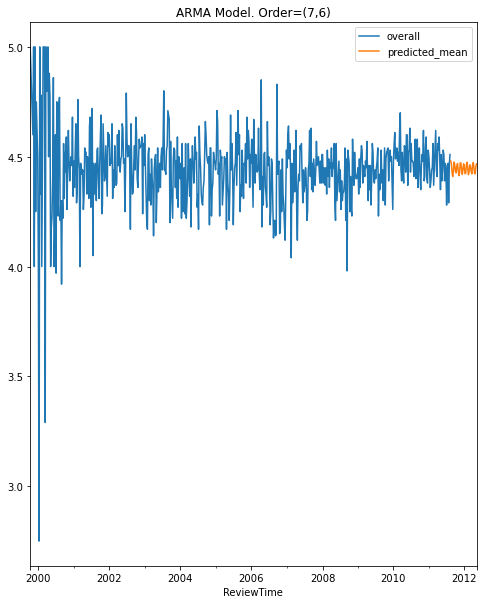

In [290]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## For a particular product

In [536]:
pos  = rev[(rev['polarity_sentiment'] == 'Positive')]

In [537]:
pos = pos.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
pos

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
6,700099867,5,"[""Video Games"",""PC"",""Games""]",2011-08-14,0.265385,Positive
10,700099867,5,"[""Video Games"",""PC"",""Games""]",2011-06-28,0.184149,Positive
11,700099867,5,"[""Video Games"",""PC"",""Games""]",2011-10-19,0.235880,Positive
13,700099867,1,"[""Video Games"",""PC"",""Games""]",2014-06-30,0.157143,Positive
15,700099867,1,"[""Video Games"",""PC"",""Games""]",2013-07-15,0.150000,Positive
...,...,...,...,...,...,...
228525,B00KAI3KW2,5,"[""Video Games"",""Xbox One"",""""]",2014-06-10,0.110833,Positive
228526,B00KAI3KW2,5,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.138462,Positive
228527,B00KAI3KW2,1,"[""Video Games"",""Xbox One"",""""]",2014-06-22,0.193457,Positive
228528,B00KAI3KW2,5,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.344773,Positive


In [538]:
counts = pos["category"].value_counts().to_frame()
counts

,category
"[""Video Games"",""PC"",""Games"",""""]",9467
"[""Video Games"",""Xbox 360"",""Games"",""""]",6269
"[""Video Games"",""PlayStation 3"",""Games"",""""]",5573
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",4171
"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""""]",2410
...,...
"[""Video Games"",""PC"",""Games"","""",""Thousands of Zombies On Screen: The undead are everywhere creating a dynamic and challenging zombie-killing experience for the player as weapons will be created to kill massive amounts of zombies at one time!"",""New Storyline and Characters: A new protagonist, Chuck Greene, is just the beginning in a long list of new characters, new survivors and new more vicious psychos that will be introduced to fans in the new world of Dead Rising."",""2-Player Co-Op: Co-op play is introduced to the Dead Rising universe for the first time as players can invite their friends to partner up with them at any time to take on the zombie massacre- tag-team style!"",""Play with a friend and have even more fun as you lure zombies in using strategic items like a toy helicopter or a firecracker."",""Terror is Reality: Allows 4 players to compete in a gladiator type show that pits zombies against a group of players in the ultimate Vs. multiplayer blood bath."",""Thousands of Zombies On Screen: The undead are everywhere creating a dynamic and challenging zombie-killing experience for the player as weapons will be created to kill massive amounts of zombies at one time!"",""New Storyline and Characters: A new protagonist, Chuck Greene, is just the beginning in a long list of new characters, new survivors and new more vicious psychos that will be introduced to fans in the new world of Dead Rising.""]",1
"[""Video Games"",""Kids & Family"",""Xbox 360"",""Games"","""",""High-Stakes Rivalry - Racers are lone wolves out for their own glory; driving agile cars built for high speed racing and epic chases. Cops work in teams to hunt down and bust racers using the full power of the police force. Switch roles at any time and watch the stakes grow in an all-new scoring system that lets you put your speed points on the line to earn even greater rewards."",""AllDrive - New in Need for Speed Rivals, AllDrive destroys the line between single player and multiplayer gameplay. Seamlessly join a world where your friends are already racing and chasing. No lobbies. No waiting. Paths will cross as races and pursuits collide, creating a world where no two moments or events will ever be the same."",""Your Car, Your Identity - Power up your car with the latest performance upgrades and technology, and personalize your car with fresh paintjobs, liveries, custom license plates, rims, and decals to show off your style to your friends and rivals. Save different configurations and keep a variety of car packages available to leave your mark no matter the situation."",""Pursuit and Evasion Tech - Intense racing moments are made even more thrilling with access to technology and upgrades customized to each side of the law. Racers can choose evasion technology from jammers to electromagnetic pulses. Cops are outfitted for aggressive busts with shockwaves, roadblocks, helicopter support and more. No matter the side you choose, use technology to keep you one step ahead of your rivals."",""Requires an Xbox 360 Hard Drive with 3GB of storage space for a mandatory installation of game disc content.""]",1
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"","""",""Freeform gameplay - Approach missions in any way you like, or break off from the fight and enjoy exploring the islands"",""Huge environments with over 250 thousand acres of land to explore - The largest environment ever seen in a game"",""Over-the-top stunts - Jump from vehicle to vehicle, parasail, skydive, and base-jump"",""More than 100 of the most varied, exciting array of land, sea and air vehicles ever seen in a video game"",""Cutting-e

In [539]:
avg_rating = pos.groupby('category')["overall"].mean().to_frame()
avg_rating

,overall
category,
"[""Video Games"",""Accessories"","""",""Brand New Generic Bulk Package""]",4.000000
"[""Video Games"",""Accessories"","""",""Converts the video and audio signals into your VGA monitor."",""Compatible with Playstation, PS2, XBOX, Gamecube, Nintendo 64 or Dreamcast""]",4.000000
"[""Video Games"",""Accessories"","""",""PS3 Controller"",""Silicone Controller"",""Red Controller"",""Blue Controller"",""Black Controller""]",4.047619
"[""Video Games"",""Accessories"","""",""USB cable allows you to charge your Microsoft xBox 360 Wireless Headset"",""Charge through any USB port and never run out of power again"",""Compatible With Xbox 360"",""Color: White; Package Contents: 1 x USB 2.0 Xbox 360 Wireless Headset Charging Cable""]",4.666667
"[""Video Games"",""Accessories"",""""]",4.029412
...,...
"[""Video Games"",""Xbox One"",""Games"",""""]",4.240469
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""All Skylanders Spyro's Adventure, Skylanders Giants, and Skylanders SWAP Force figures work with Skylanders Trap Team.""]",4.538462
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""Warnado"",""Warnado"",""CAN contain Glow-in-the-dark Warnado variant."",""Skylanders Triple Pack {Ignitor, Camo, Warnado}""]",4.625000


In [540]:
proj = counts.join(avg_rating)
proj.head(30)

,category,overall
"[""Video Games"",""PC"",""Games"",""""]",9467,4.338650
"[""Video Games"",""Xbox 360"",""Games"",""""]",6269,4.457011
"[""Video Games"",""PlayStation 3"",""Games"",""""]",5573,4.520904
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",4171,4.502278
"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""""]",2410,4.530290
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",2316,4.508636
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games""]",1917,4.400626
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"",""""]",1901,4.485534
"[""Video Games"",""Retro Gaming & Microconsoles"",""Xbox"",""Games"",""""]",1596,4.434837
"[""Video Games"",""Kids & Family"",""PlayStation 3"",""Games"",""""]",1391,4.483106


In [442]:
prod  = rev[(rev['category'] == '["Video Games","Retro Gaming & Microconsoles","PlayStation 2","Games",""]')]

In [443]:
prod

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
21303,B00004TN1Z,2,A305MT5Y9I4T69,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,playing game play preceding title series mark ...,44.0,Negative,0.112325,Positive
21304,B00004TN1Z,2,A305MT5Y9I4T69,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,playing game play preceding title series mark ...,44.0,Negative,0.112325,Positive
21305,B00004TN1Z,4,A278KO9LMJAFSW,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,look header say game came fast good visual con...,0.0,Positive,0.300000,Positive
21306,B00004TN1Z,4,A278KO9LMJAFSW,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,look header say game came fast good visual con...,0.0,Positive,0.300000,Positive
21307,B00004TN1Z,4,A7GXT5V1VL5UT,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2005-07-13,pro similar mark kri mechanic little violent p...,47.0,Positive,-0.041468,Negative
...,...,...,...,...,...,...,...,...,...,...
200007,B00542XFX8,5,AVOIQL3XNCA5P,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2013-04-04,game brother enjoy place today read got paint ...,50.0,Positive,0.000000,Neutral
200008,B00542XFX8,4,A1NA3BY2VED6TT,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-06-27,although im completely certain theyre going tr...,0.0,Positive,0.095570,Neutral
200009,B00542XFX8,2,ANAYSRE3LX8GZ,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-26,last nba game doesnt go bang wish read people ...,40.0,Negative,-0.025279,Negative
200010,B00542XFX8,4,A211X9NEHYT65Y,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-25,worked fine given gift christmas gift birthday...,0.0,Positive,0.238889,Positive


In [444]:
prod = prod.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
prod

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
21303,B00004TN1Z,2,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,0.112325,Positive
21304,B00004TN1Z,2,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,0.112325,Positive
21305,B00004TN1Z,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,0.300000,Positive
21306,B00004TN1Z,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,0.300000,Positive
21307,B00004TN1Z,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2005-07-13,-0.041468,Negative
...,...,...,...,...,...,...
200007,B00542XFX8,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2013-04-04,0.000000,Neutral
200008,B00542XFX8,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-06-27,0.095570,Neutral
200009,B00542XFX8,2,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-26,-0.025279,Negative
200010,B00542XFX8,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-25,0.238889,Positive


In [445]:
prod['ReviewTime'] = pd.to_datetime(prod['ReviewTime'])

In [446]:
prod = prod.set_index("ReviewTime")
print(prod)

            product_id  overall  \
ReviewTime                        
2007-11-06  B00004TN1Z        2   
2007-11-06  B00004TN1Z        2   
2014-01-01  B00004TN1Z        4   
2014-01-01  B00004TN1Z        4   
2005-07-13  B00004TN1Z        4   
...                ...      ...   
2013-04-04  B00542XFX8        5   
2012-06-27  B00542XFX8        4   
2012-12-26  B00542XFX8        2   
2012-12-25  B00542XFX8        4   
2012-06-18  B00542XFX8        1   

                                                     category  polarity  \
ReviewTime                                                                
2007-11-06  ["Video Games","Retro Gaming & Microconsoles",...  0.112325   
2007-11-06  ["Video Games","Retro Gaming & Microconsoles",...  0.112325   
2014-01-01  ["Video Games","Retro Gaming & Microconsoles",...  0.300000   
2014-01-01  ["Video Games","Retro Gaming & Microconsoles",...  0.300000   
2005-07-13  ["Video Games","Retro Gaming & Microconsoles",... -0.041468   
...                

In [447]:
prod=prod.sort_values(by='ReviewTime')
prod

,product_id,overall,category,polarity,polarity_sentiment
ReviewTime,,,,,
2000-07-26,B00004U5VF,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.039028,Neutral
2000-07-26,B00004U5VF,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.039028,Neutral
2000-08-27,B00004U5VF,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",-0.040943,Negative
2000-08-27,B00004U5VF,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",-0.040943,Negative
2000-10-08,B00004U5VF,3,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.097944,Neutral
...,...,...,...,...,...
2014-07-16,B00006GSNX,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.308333,Positive
2014-07-16,B000A87T3I,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.550000,Positive
2014-07-16,B000099T2E,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.128333,Positive


In [448]:
prod = prod.resample('W').mean().round(2)

In [449]:
prod = prod.interpolate(method='linear')
prod

,overall,polarity
ReviewTime,,
2000-07-30,4.00,0.04
2000-08-06,4.25,0.02
2000-08-13,4.50,0.00
2000-08-20,4.75,-0.02
2000-08-27,5.00,-0.04
...,...,...
2014-06-22,4.80,0.18
2014-06-29,3.89,0.10
2014-07-06,4.90,0.32


<AxesSubplot:xlabel='ReviewTime'>

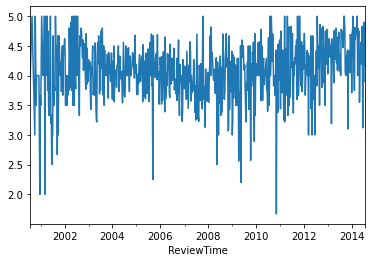

In [450]:
prod.overall.plot()

Text(0.5, 1.0, 'Random')

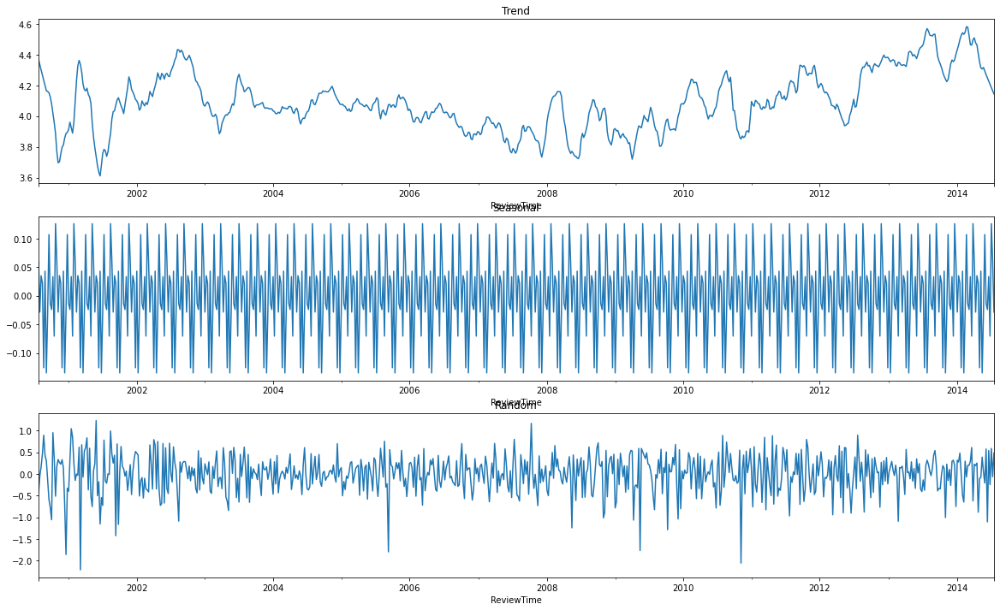

In [451]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(prod['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [452]:
prod1=prod['overall']
prod1

ReviewTime
2000-07-30    4.00
2000-08-06    4.25
2000-08-13    4.50
2000-08-20    4.75
2000-08-27    5.00
              ... 
2014-06-22    4.80
2014-06-29    3.89
2014-07-06    4.90
2014-07-13    4.16
2014-07-20    4.60
Freq: W-SUN, Name: overall, Length: 730, dtype: float64

In [453]:
prod1 = pd.DataFrame(prod1)

In [454]:
def checkStationarity(prod1):
  pvalue = adfuller(prod1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [455]:
ret = checkStationarity(prod1);
ret

'p-value=0.0024608969112551566. Data is stationary'

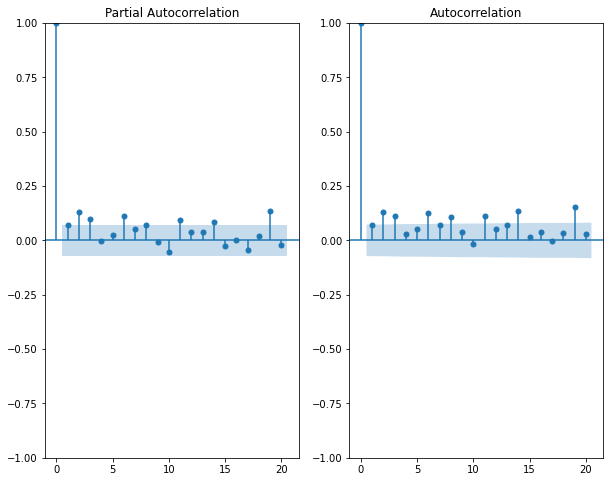

In [456]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(prod1,lags=20,ax=ax[0])
plot_acf(prod1.dropna(),lags=20,ax=ax[1])
plt.show()

In [457]:
ss = int(0.70 * len(top1['overall'])) 
train_df = prod1.iloc[:ss] 
test_df = prod1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 508, test = 222


In [458]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 508, test = 222


In [459]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  508
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -325.497
Date:                Sun, 13 Mar 2022   AIC                            680.994
Time:                        20:31:16   BIC                            744.452
Sample:                    07-30-2000   HQIC                           705.878
                         - 04-18-2010                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.0183      0.060     66.663      0.000       3.900       4.136
ar.L1          0.0041      0.553      0.007      0.994      -1.080       1.088
ar.L2          0.1929      0.437      0.441      0.6

In [460]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-07-30    4.018266
2000-08-06    4.016871
2000-08-13    4.033392
2000-08-20    4.067688
2000-08-27    4.112461
                ...   
2004-09-26    3.990344
2004-10-03    3.990492
2004-10-10    4.095200
2004-10-17    4.067296
2004-10-24    4.104530
Freq: W-SUN, Name: predicted_mean, Length: 222, dtype: float64


In [461]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      4.00   4.018266 -0.018266
1      4.25   4.016871  0.233129
2      4.50   4.033392  0.466608
3      4.75   4.067688  0.682312
4      5.00   4.112461  0.887539
..      ...        ...       ...
217    4.15   3.990344  0.159656
218    4.33   3.990492  0.339508
219    4.00   4.095200 -0.095200
220    4.06   4.067296 -0.007296
221    4.14   4.104530  0.035470

[222 rows x 3 columns]


In [462]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [463]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.243849663039332
	RMSE = 0.4938113638215832


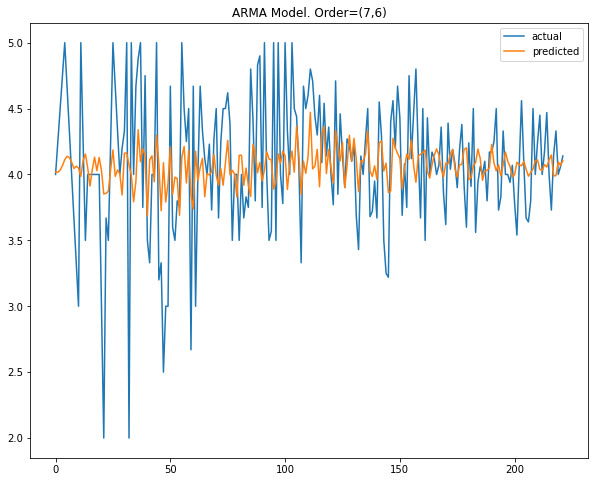

In [464]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [470]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m1)

2010-04-25    3.995331
2010-05-02    3.952854
2010-05-09    3.918251
2010-05-16    4.261058
2010-05-23    3.995102
2010-05-30    3.928956
2010-06-06    4.020608
2010-06-13    3.826075
2010-06-20    4.037410
2010-06-27    4.200456
2010-07-04    3.946324
2010-07-11    4.056311
2010-07-18    3.943419
2010-07-25    3.813321
2010-08-01    4.124805
2010-08-08    4.075971
2010-08-15    4.002574
2010-08-22    4.115246
2010-08-29    3.844069
2010-09-05    3.899030
2010-09-12    4.111660
2010-09-19    3.984563
2010-09-26    4.113019
2010-10-03    4.072293
2010-10-10    3.815916
2010-10-17    3.997187
2010-10-24    4.015429
2010-10-31    3.987492
2010-11-07    4.185386
2010-11-14    3.982257
2010-11-21    3.881258
Freq: W-SUN, Name: predicted_mean, dtype: float64


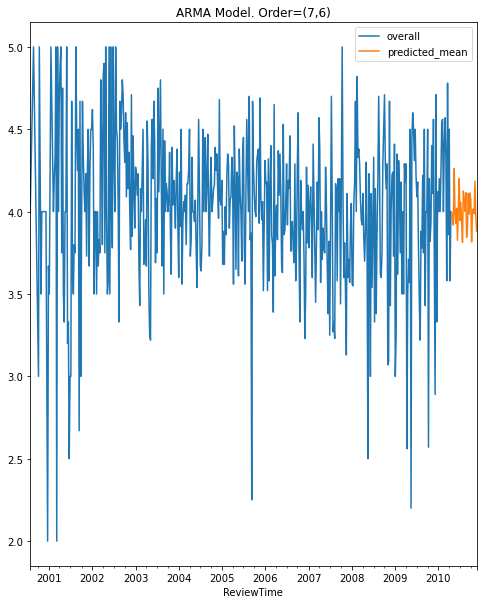

In [471]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

# Dataset 2(Sentiment Analysis and Clustering)

In [509]:
df1['sentiment'] = df1.apply(sent,axis=1)
df1.head()

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let reviews turn off this wond...,45.0,Positive
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative


In [510]:
df1['sentiment'].value_counts()

Positive    98746
Neutral     11582
Negative     7673
Name: sentiment, dtype: int64

In [511]:
review_pos = df1[df1["sentiment"]=='Positive'].dropna()
review_neu = df1[df1["sentiment"]=='Neutral'].dropna()
review_neg = df1[df1["sentiment"]=='Negative'].dropna()

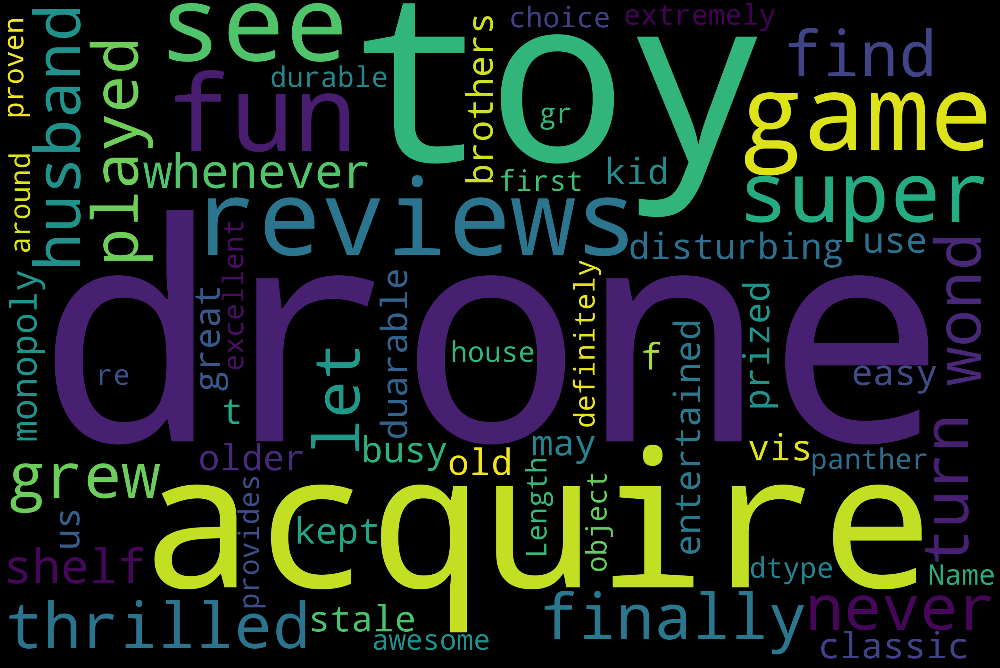

In [512]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

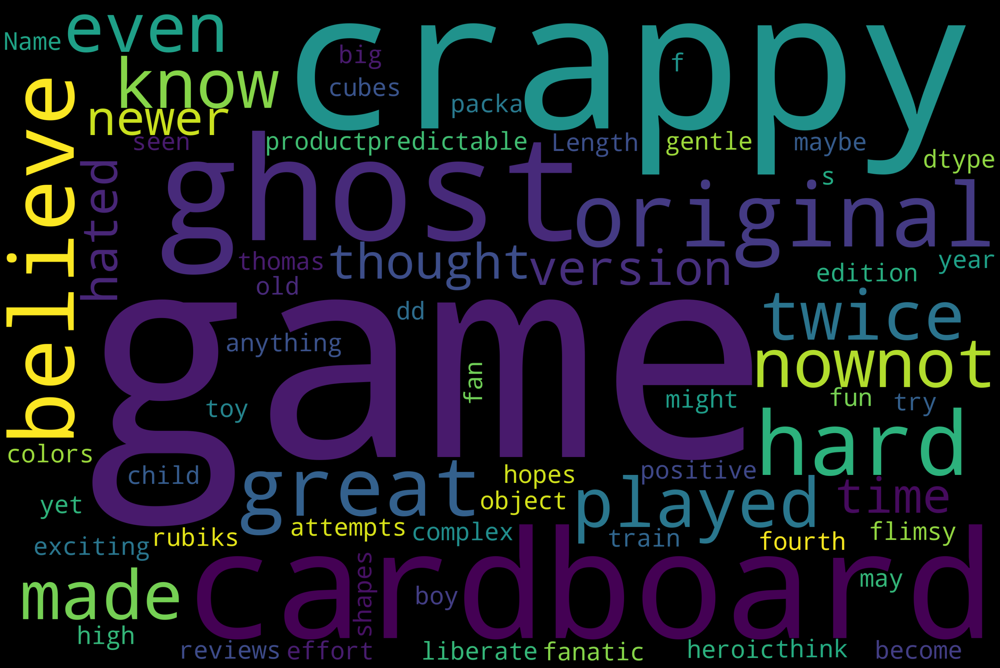

In [513]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [514]:
rev1=df1.copy()

In [515]:
rev1["category"].unique()

array(['["Toys & Games","Games","Board Games"]',
       '["Toys & Games","Puzzles","Floor Puzzles"]',
       '["Toys & Games","Puzzles","Brain Teasers"]',
       '["Toys & Games","Games","Card Games"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play"]',
       '["Toys & Games","Games"]',
       '["Toys & Games","Games","Standard Playing Card Decks"]',
       '["Toys & Games","Puppets","Finger Puppets"]',
       '["Toys & Games","Arts & Crafts","Stickers"]',
       '["Toys & Games","Action Figures & Statues","Action Figures"]',
       '["Toys & Games","Games","Tile Games"]',
       '["Toys & Games","Learning & Education","Science","Anatomy"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Drawing & Sketch Pads"]',
       '["Toys & Games","Games","DVD Games"]',
       '["Toys & Games","Hobbies","Remote & App Controlled Vehicles & Parts","Remote & App Controlled Vehicles"]',
       '["Toys & Games","Hobbies","Remote & App Controlled Vehicles & Par

In [113]:
counts1 = rev1["category"].value_counts().to_frame()
counts1

,category
"[""Toys & Games"",""Games"",""Board Games""]",9757
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511
...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5


In [114]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [115]:
rev1["reviews"].apply(lambda x: TextBlob(x).words).head() 

0    [we, thrilled, find, acquire, finally, husband...
1    [if, never, played, let, reviews, turn, off, t...
2    [whenever, i, see, game, shelf, i, get, distur...
3    [a, crappy, cardboard, ghost, original, hard, ...
4    [great, game, played, like, twice, even, know,...
Name: reviews, dtype: object

In [116]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [117]:
lemmatizer = WordNetLemmatizer()
def lemmatize_text(Df):
    Df.reviews = " ".join(lemmatizer.lemmatize(word) for word in Df.reviews.split())
    return Df
rev1= rev1.apply(lemmatize_text, axis = 1)

In [118]:
rev1

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative
...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable it easy use kid ...,0.0,Positive
118066,B00LBI9BKA,5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brother prized toy it extremely durable p...,50.0,Positive
118067,B00LBI9BKA,5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0,Positive
118068,B00LBI9BKA,5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0,Positive


In [119]:
rev1['polarity'] = rev1['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)

In [120]:
rev1.head()

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive,-0.001603
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive,0.282192
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive,0.033528
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative,-0.166667
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative,0.400000


In [121]:
avg_polarity1 = rev1.groupby("category")["polarity"].mean().to_frame()
avg_polarity1

,polarity
category,
"[""Toys & Games"",""Action Figures & Statues"",""Accessories""]",0.258646
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",0.253807
"[""Toys & Games"",""Action Figures & Statues"",""Imported"",""Sonic screwdriver that's really a flashlight"",""Super bright LED for timey-wimey adventuring"",""Have your collectible and use it, too!"",""Approx 6.5\"" in length"",""The Eleventh Doctor's handy device shines a bright green beam through light-emitting diodes.""]",0.252243
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",0.237416
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Vehicles""]",0.247413
...,...
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Electric Vehicles""]",0.210531
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pedal Cars""]",0.225855
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pull-Along Wagons""]",0.247045


In [122]:
counts1 = rev1["category"].value_counts().to_frame()
counts1

,category
"[""Toys & Games"",""Games"",""Board Games""]",9757
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511
...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5


In [123]:
avg_rating1 = rev1.groupby("category")["overall"].mean().to_frame()
avg_rating1

,overall
category,
"[""Toys & Games"",""Action Figures & Statues"",""Accessories""]",4.413793
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",4.362053
"[""Toys & Games"",""Action Figures & Statues"",""Imported"",""Sonic screwdriver that's really a flashlight"",""Super bright LED for timey-wimey adventuring"",""Have your collectible and use it, too!"",""Approx 6.5\"" in length"",""The Eleventh Doctor's handy device shines a bright green beam through light-emitting diodes.""]",4.513514
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",4.347195
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Vehicles""]",4.309148
...,...
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Electric Vehicles""]",4.555556
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pedal Cars""]",4.342857
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pull-Along Wagons""]",4.506289


In [124]:
fin_rev1 = counts1.join(avg_polarity1)
fin_rev1.head(30)

,category,polarity
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416
"[""Toys & Games"",""Kids' Electronics"",""Electronic Learning Toys""]",3270,0.220604
"[""Toys & Games"",""Toy Remote Control & Play Vehicles"",""Vehicle Playsets""]",2659,0.217225
"[""Toys & Games"",""Games"",""Card Games""]",2220,0.098920
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Stuffed Animals & Teddy Bears""]",2211,0.276910
"[""Toys & Games"",""Dolls & Accessories"",""Playsets""]",2206,0.235745


In [125]:
fin_rev1 = fin_rev1.join(avg_rating1)
fin_rev1

,category,polarity,overall
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195
...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000


In [126]:
fin_rev1['polarity_sentiment'] = fin_rev1.apply(sent1,axis=1)
fin_rev1

,category,polarity,overall,polarity_sentiment
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive
...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive


In [127]:
fin_rev1['product_ids']=fin_rev1.index
fin_rev1

,category,polarity,overall,polarity_sentiment,product_ids
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]"
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]"
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]"
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac..."
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl..."
...,...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive,"[""Toys & Games"",""Stuffed Animals & Plush Toys""..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]"
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea..."


In [128]:
fin_rev1.polarity_sentiment.value_counts()

Positive    359
Neutral      11
Negative      1
Name: polarity_sentiment, dtype: int64

In [129]:
fin_rev1.rename(columns = {'category':'counts'}, inplace = True)

In [130]:
fin_rev1.rename(columns = {'product_ids':'category'}, inplace = True)

In [131]:
fin_rev1

,counts,polarity,overall,polarity_sentiment,category
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]"
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]"
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]"
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac..."
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl..."
...,...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive,"[""Toys & Games"",""Stuffed Animals & Plush Toys""..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]"
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea..."


In [132]:
fin_rev1['polarity_sentiment'] = fin_rev1.apply(sent1,axis=1)
fin_rev1

,counts,polarity,overall,polarity_sentiment,category
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]"
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]"
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]"
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac..."
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl..."
...,...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive,"[""Toys & Games"",""Stuffed Animals & Plush Toys""..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]"
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea..."


In [133]:
labelencoder = LabelEncoder()
fin_rev1['category1']=labelencoder.fit_transform(fin_rev1['category'])
fin_rev1.head()

,counts,polarity,overall,polarity_sentiment,category,category1
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]",126
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",85
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]",69
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac...",1
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",3


In [134]:
fin_rev1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 371 entries, ["Toys & Games","Games","Board Games"] to ["Toys & Games","Puppets","Puppet Theaters"]
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   counts              371 non-null    int64  
 1   polarity            371 non-null    float64
 2   overall             371 non-null    float64
 3   polarity_sentiment  371 non-null    object 
 4   category            371 non-null    object 
 5   category1           371 non-null    int32  
dtypes: float64(2), int32(1), int64(1), object(2)
memory usage: 26.9+ KB


In [135]:
fin_rev1=fin_rev1.drop(['polarity_sentiment'], axis=1)
fin_rev1.head(3)

,counts,polarity,overall,category,category1
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,"[""Toys & Games"",""Games"",""Board Games""]",126
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",85
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,"[""Toys & Games"",""Building Toys"",""Building Sets""]",69


In [136]:
fin_rev1.reset_index()

,index,counts,polarity,overall,category,category1
0,"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,"[""Toys & Games"",""Games"",""Board Games""]",126
1,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",85
2,"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,"[""Toys & Games"",""Building Toys"",""Building Sets""]",69
3,"[""Toys & Games"",""Action Figures & Statues"",""Ac...",5571,0.253807,4.362053,"[""Toys & Games"",""Action Figures & Statues"",""Ac...",1
4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",3511,0.237416,4.347195,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",3
...,...,...,...,...,...,...
366,"[""Toys & Games"",""Stuffed Animals & Plush Toys""...",5,0.338711,4.400000,"[""Toys & Games"",""Stuffed Animals & Plush Toys""...",343
367,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",100
368,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",5,0.310237,4.000000,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",38
369,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea...",5,0.170259,3.400000,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea...",97


In [137]:
rev1['polarity_sentiment'] = rev1.apply(sent1,axis=1)
rev1

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive,-0.001603,Negative
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive,0.282192,Positive
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive,0.033528,Neutral
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative,-0.166667,Negative
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative,0.400000,Positive
...,...,...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable it easy use kid ...,0.0,Positive,0.373333,Positive
118066,B00LBI9BKA,5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brother prized toy it extremely durable p...,50.0,Positive,0.170972,Positive
118067,B00LBI9BKA,5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0,Positive,0.380635,Positive
118068,B00LBI9BKA,5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0,Positive,0.282292,Positive


In [138]:
review_pos1 = rev1[rev1["polarity_sentiment"]=='Positive'].dropna()
review_neu1 = rev1[rev1["polarity_sentiment"]=='Neutral'].dropna()
review_neg1 = rev1[rev1["polarity_sentiment"]=='Negative'].dropna()

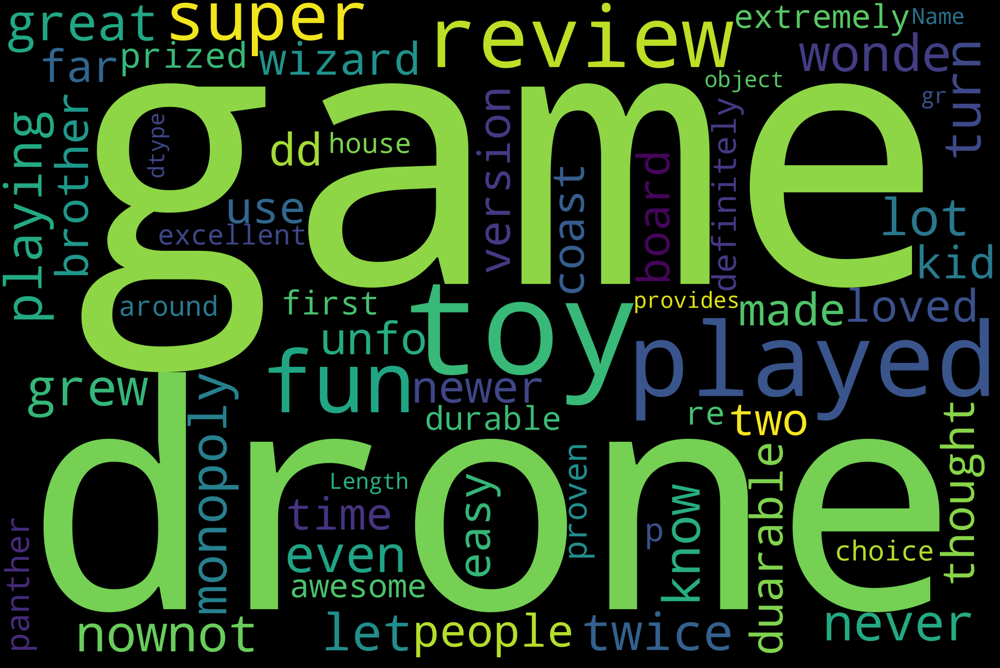

In [139]:
text = review_pos1["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

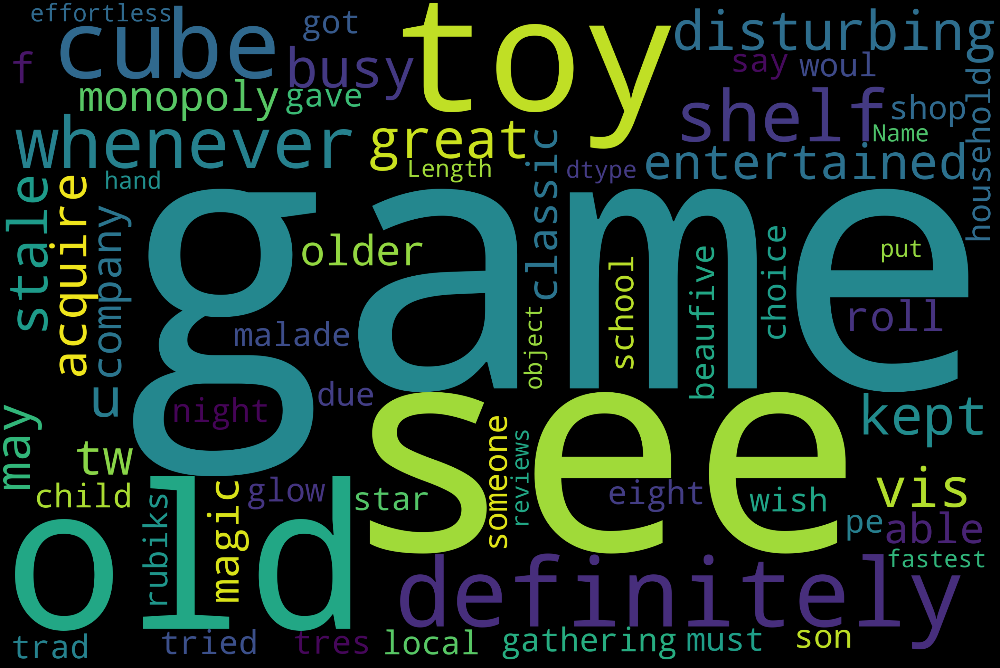

In [140]:
text = review_neu1["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

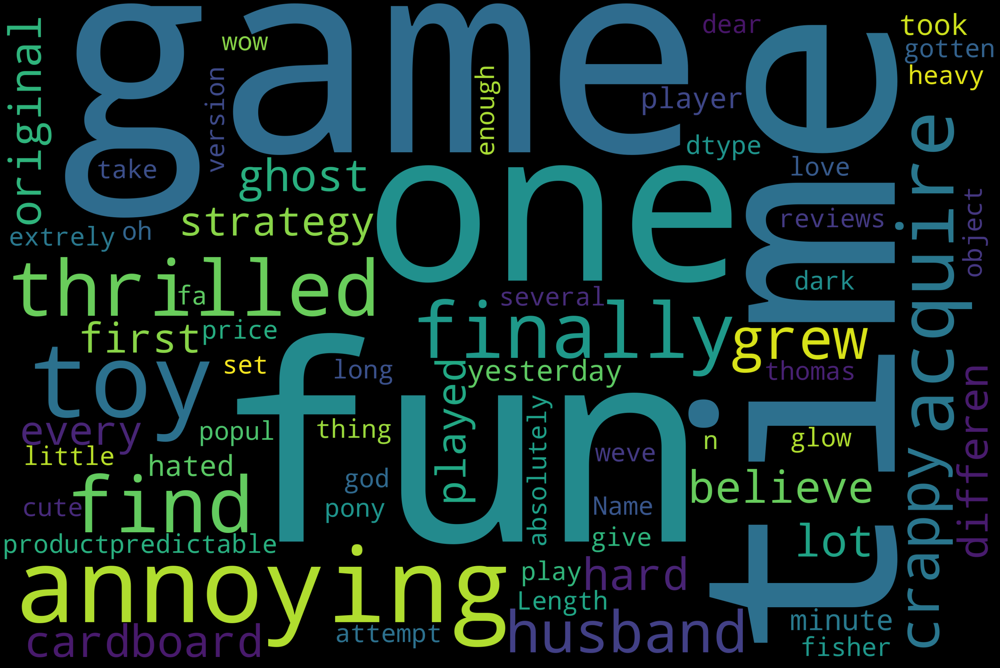

In [141]:
text = review_neg1["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [142]:
review_pos1.to_csv('rev_pos1.csv')

In [143]:
review_neu1.to_csv('rev_neu1.csv')

In [144]:
review_neg1.to_csv('rev_neg1.csv')

In [145]:
fin_rev1 = fin_rev1.reset_index(drop=True)

In [144]:
#fin_rev1=fin_rev1.drop(['category'], axis=1)
#fin_rev1.head()

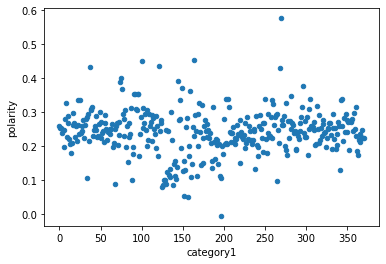

In [145]:
fin_rev1.plot.scatter(x='category1',y='polarity')
plt.show()

In [ ]:
std_scaler = StandardScaler()
b = fin_rev1.select_dtypes('number')
std_scaler = StandardScaler()
fin_rev1_std = fin_rev1
scale_columns = ['category1','polarity']
fin_rev1_std[scale_columns] = std_scaler.fit_transform(fin_rev1[scale_columns])

In [ ]:
c = std_scaler.fit_transform(b)

In [ ]:
#! pip install hdbscan

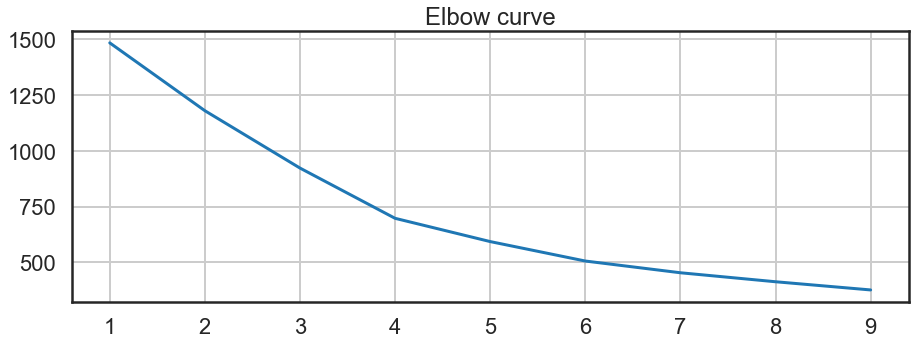

In [ ]:
import warnings
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
warnings.filterwarnings("ignore")
from string import ascii_letters 
import matplotlib.cm as cm
%matplotlib inline 
from sklearn.preprocessing import MinMaxScaler, StandardScaler, FunctionTransformer
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
sns.set_context('poster')
sns.set_style('white') 
sns.set_color_codes() 
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}
warnings.filterwarnings("ignore")
distorsions = []
for k in range(1, 10):
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(c)
  distorsions.append(kmeans.inertia_)
fig = plt.figure(figsize=(15, 5))
plt.plot(range(1, 10), distorsions)
plt.grid(True)
plt.title('Elbow curve');

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=10)
  cluster_labels = clusterer.fit_predict(c)
  silhouette_avg = silhouette_score(c, cluster_labels)
  print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.2583765931447995
For n_clusters = 3 The average silhouette_score is : 0.2696154777301544
For n_clusters = 4 The average silhouette_score is : 0.2959580875447849
For n_clusters = 5 The average silhouette_score is : 0.2776224563569983
For n_clusters = 6 The average silhouette_score is : 0.3099759062334633
For n_clusters = 7 The average silhouette_score is : 0.26609304294348485
For n_clusters = 8 The average silhouette_score is : 0.269758483579758
For n_clusters = 9 The average silhouette_score is : 0.2800512738295598
For n_clusters = 10 The average silhouette_score is : 0.25822351274536604
For n_clusters = 11 The average silhouette_score is : 0.26449354388777174
For n_clusters = 12 The average silhouette_score is : 0.26745036556172014
For n_clusters = 13 The average silhouette_score is : 0.2535694980577414
For n_clusters = 14 The average silhouette_score is : 0.25270542984848915
For n_clusters = 15 The average silhouette_score is : 0

eps =  0.5 ,min_samples =  10 -1    217
 0     91
 1     48
 3      8
 2      7
dtype: int64


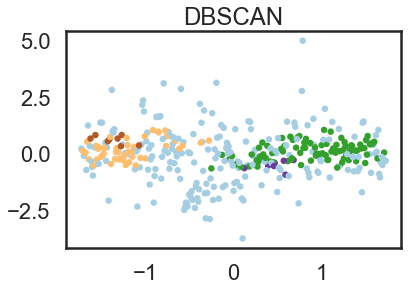

eps =  0.5 ,min_samples =  11 -1    242
 0     86
 1     32
 2     11
dtype: int64


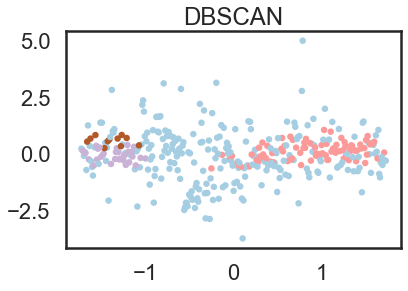

eps =  0.5 ,min_samples =  12 -1    257
 0     82
 1     32
dtype: int64


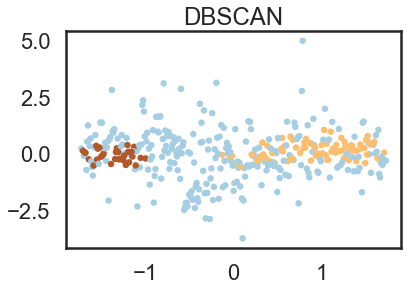

eps =  0.6 ,min_samples =  10 -1    146
 0    139
 1     86
dtype: int64


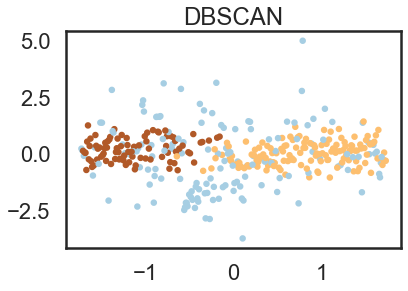

eps =  0.6 ,min_samples =  11 -1    157
 0    136
 1     78
dtype: int64


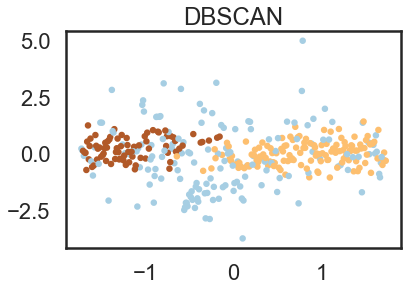

eps =  0.6 ,min_samples =  12 -1    164
 0    129
 1     78
dtype: int64


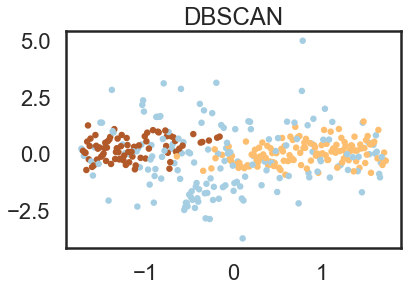

eps =  0.7 ,min_samples =  10  0    277
-1     84
 1     10
dtype: int64


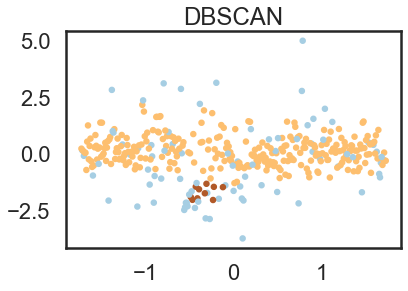

eps =  0.7 ,min_samples =  11  0    263
-1    108
dtype: int64


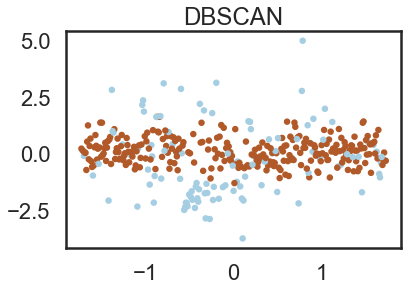

eps =  0.7 ,min_samples =  12  0    262
-1    109
dtype: int64


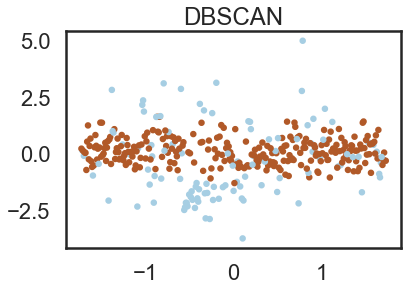

eps =  0.73 ,min_samples =  10  0    290
-1     71
 1     10
dtype: int64


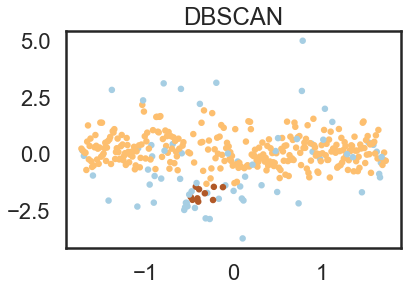

eps =  0.73 ,min_samples =  11  0    285
-1     75
 1     11
dtype: int64


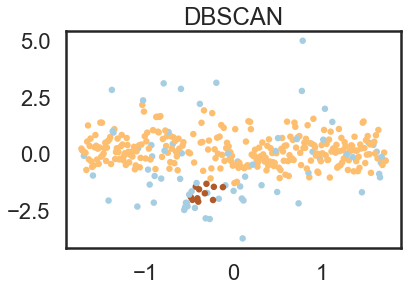

eps =  0.73 ,min_samples =  12  0    276
-1     95
dtype: int64


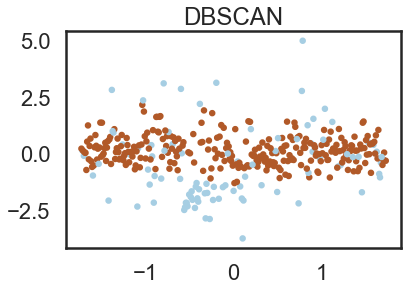

In [ ]:
eps=[0.5,0.6,0.7,0.73] 
min_samples=[10,11,12]
fin_rev_scaled1=fin_rev1[scale_columns]
for i in eps:
  for j in min_samples:
    dbscan = DBSCAN(eps=i, min_samples=j) 
    y_pred = dbscan.fit_predict(c)
    d=pd.DataFrame(y_pred)
    print('eps = ', i,',min_samples = ',j,d.value_counts() )
    plt.scatter(fin_rev1['category1'], fin_rev1['polarity'],c=y_pred, cmap='Paired',s=20) 
    plt.title("DBSCAN")
    plt.show()

eps =  0.5 ,min_samples =  10  0    276
-1     95
dtype: int64


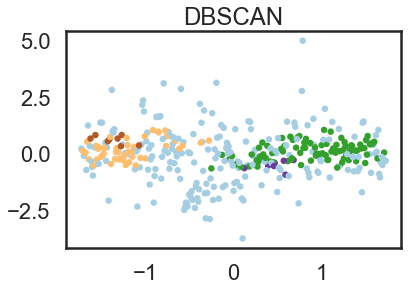

In [ ]:
eps=  0.5 
min_samples=10    
fin_rev_scaled1=fin_rev1[scale_columns]
dbscan = DBSCAN(eps=eps, min_samples=min_samples) 
fin_rev1['clusterid'] = dbscan.fit_predict(c)
y_pred=fin_rev1['clusterid'] 
print('eps = ', eps,',min_samples = ',min_samples,d.value_counts() )
plt.scatter(fin_rev1['category1'], fin_rev1['polarity'],c=y_pred, cmap='Paired',s=20) 
plt.title("DBSCAN")
plt.show()

In [ ]:
clust_0 = fin_rev1[fin_rev1['clusterid']==0]['category'].unique()
print(len(clust_0))
clust_0

91


array(['["Toys & Games","Stuffed Animals & Plush Toys","Plush Figures"]',
       '["Toys & Games","Learning & Education","Basic & Life Skills Toys"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Die-Cast Vehicles"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Play Trains & Railway Sets","Accessories","Train Tracks"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Drums & Percussion"]',
       '["Toys & Games","Learning & Education","Mathematics & Counting"]',
       '["Toys & Games","Puzzles"]',
       '["Toys & Games","Sports & Outdoor Play","Play Tents & Tunnels"]',
       '["Toys & Games","Learning & Education","Science","Biology"]',
       '["Toys & Games","Kids\' Electronics"]',
       '["Toys & Games","Kids\' Electronics","Cameras & Camcorders"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Pianos & Keyboards"]',
       '["Toys & Games","Novelty & Gag Toys","Magic Kits & Accessories"]',
       

In [ ]:
clust_neg1 = fin_rev1[fin_rev1['clusterid']==-1]['category'].unique()
print(len(clust_neg1))
clust_neg1

217


array(['["Toys & Games","Games","Board Games"]',
       '["Toys & Games","Dolls & Accessories","Dolls"]',
       '["Toys & Games","Building Toys","Building Sets"]',
       '["Toys & Games","Action Figures & Statues","Action Figures"]',
       '["Toys & Games","Action Figures & Statues","Playsets & Vehicles","Playsets"]',
       '["Toys & Games","Kids\' Electronics","Electronic Learning Toys"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Vehicle Playsets"]',
       '["Toys & Games","Games","Card Games"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Stuffed Animals & Teddy Bears"]',
       '["Toys & Games","Dolls & Accessories","Playsets"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Play Vehicles"]',
       '["Toys & Games","Puzzles","Jigsaw Puzzles"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play","Kitchen Toys","Play Food"]',
       '["Toys & Games","Sports & Outdoor Play","Blasters & Foam Play"]',
       '["Toys & G

In [ ]:
clust_1 = fin_rev1[fin_rev1['clusterid']==1]['category'].unique()
print(len(clust_1))
clust_1

48


array(['["Toys & Games","Baby & Toddler Toys","Push & Pull Toys"]',
       '["Toys & Games","Baby & Toddler Toys","Stacking & Nesting Toys"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play","Construction Tools"]',
       '["Toys & Games","Baby & Toddler Toys","Activity Play Centers"]',
       '["Toys & Games","Arts & Crafts","Craft Kits"]',
       '["Toys & Games","Dolls & Accessories"]',
       '["Toys & Games","Building Toys","Stacking Blocks"]',
       '["Toys & Games","Action Figures & Statues","Playsets & Vehicles","Vehicles"]',
       '["Toys & Games","Action Figures & Statues"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Chalk"]',
       '["Toys & Games","Arts & Crafts","Drawing & Sketching Tablets"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Colored Pencils"]',
       '["Toys & Games","Arts & Crafts","Craft Kits","Sewing"]',
     

In [ ]:
cluster0=fin_rev1[(fin_rev1['clusterid'] == 0)]
cluster0high = cluster0.sort_values(by=['overall'], ascending=False)
cluster0high.head(5)

,counts,polarity,overall,category,category1,clusterid
289,17,0.523243,4.647059,"[""Toys & Games"",""Sports & Outdoor Play"",""Pools...",1.260527,0
173,78,-0.254471,4.589744,"[""Toys & Games"",""Sports & Outdoor Play"",""Play ...",1.064445,0
122,151,0.420468,4.556291,"[""Toys & Games"",""Sports & Outdoor Play"",""Sports""]",1.437934,0
82,296,-0.021678,4.547297,"[""Toys & Games"",""Stuffed Animals & Plush Toys""...",1.512632,0
158,100,0.768652,4.540000,"[""Toys & Games"",""Novelty & Gag Toys"",""Temporar...",0.644269,0


In [ ]:
a = cluster0high.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Pool Toys","Inflatable Water Slides"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Freestanding Climbers"]',
       '["Toys & Games","Sports & Outdoor Play","Sports"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Plush Puppets"]',
       '["Toys & Games","Novelty & Gag Toys","Temporary Tattoos"]',
       '["Toys & Games","Tricycles, Scooters & Wagons","Pull-Along Wagons"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Play Trains & Railway Sets","Accessories","Train Tracks"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Play Set Attachments","Swings"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Freestanding Slides"]',
       '["Toys & Games","Party Supplies","Tablecovers"]',
       '["Toys & Games","Party Supplies","Party Tableware","Cups"]',
       '["Toys & Games","T

In [ ]:
cluster0low = cluster0.sort_values(by=['overall'], ascending=True)
cluster0low.head()

,counts,polarity,overall,category,category1,clusterid
237,33,-0.546840,4.030303,"[""Toys & Games"",""Learning & Education"",""Geogra...",0.270780,0
146,119,-0.103424,4.033613,"[""Toys & Games"",""Learning & Education"",""Musica...",0.298792,0
250,26,-0.048940,4.038462,"[""Toys & Games"",""Sports & Outdoor Play"",""Marbl...",1.045770,0
126,145,-0.189097,4.041379,"[""Toys & Games"",""Toy Remote Control & Play Veh...",1.634016,0
69,351,-0.541673,4.056980,"[""Toys & Games"",""Kids' Electronics""]",0.177407,0


In [ ]:
a = cluster0low.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Learning & Education","Geography"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Guitars & Strings"]',
       '["Toys & Games","Sports & Outdoor Play","Marble Games"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Pull Back Vehicles"]',
       '["Toys & Games","Kids\' Electronics"]',
       '["Toys & Games","Sports & Outdoor Play","Sports","Toy Sports","Toy Baseball"]',
       '["Toys & Games","Sports & Outdoor Play","Slumber Bags"]',
       '["Toys & Games","Sports & Outdoor Play","Nature Exploration Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Sprinklers"]',
       '["Toys & Games","Party Supplies","Party Favors"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Basketball & Volleyball Sets"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Plush Interactive Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Pool Rafts & Inflat

In [ ]:
clusterneg1=fin_rev1[(fin_rev1['clusterid'] == -1)]
clusterneg1high = clusterneg1.sort_values(by=['overall'], ascending=False)
clusterneg1high.head()

,counts,polarity,overall,category,category1,clusterid
342,6,4.981076,5.0,"[""Toys & Games"",""Party Supplies"",""Party Tablew...",0.784328,-1
367,5,3.108605,5.0,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",-0.793665,-1
344,6,2.362228,5.0,"[""Toys & Games"",""Dolls & Accessories"",""Doll Ac...",-1.027096,-1
332,7,0.633738,5.0,"[""Toys & Games"",""Sports & Outdoor Play"",""Kites...",1.017759,-1
346,6,1.992346,5.0,"[""Toys & Games"",""Sports & Outdoor Play"",""Kites...",1.036433,-1


In [ ]:
a = clusterneg1high.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Party Supplies","Party Tableware","Plates"]',
       '["Toys & Games","Dress Up & Pretend Play","Hats"]',
       '["Toys & Games","Dolls & Accessories","Doll Accessories","Clothing & Shoes","Made by Sophia\'s, Designer Doll Clothes Affordably Priced!","2 Great Pairs Included with Heart Cut Out Design","1 Pair of Hot Pink Garden Sandals","1 Pair of White Garden Sandals. Sophia\'s Copyright Design","Made by Sophia\'s, Leading Doll Furniture, Doll Clothes, Doll Shoes & Doll Accessory Maker!"]',
       '["Toys & Games","Sports & Outdoor Play","Kites & Wind Spinners","Kite Accessories"]',
       '["Toys & Games","Sports & Outdoor Play","Kites & Wind Spinners","Wind Spinners"]',
       '["Toys & Games","Games","Game Accessories","Game Pieces"]',
       '["Toys & Games","Hobbies","Remote & App Controlled Vehicles & Parts","Remote & App Controlled Vehicles","Trucks"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Teeter Totters"]'

In [ ]:
clusterneg1low = clusterneg1.sort_values(by=['overall'], ascending=True)
clusterneg1low.head()

,counts,polarity,overall,category,category1,clusterid
343,6,-2.130785,2.500000,"[""Toys & Games"",""Dress Up & Pretend Play"",""Acc...",-0.905712,-1
358,5,-1.336715,2.800000,"[""Toys & Games"",""Dolls & Accessories"",""Dolls"",...",-0.952398,-1
221,42,-2.039983,2.952381,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",-1.419260,-1
299,13,-2.361511,3.000000,"[""Toys & Games"",""Games"",""Game Room Games""]",-0.438850,-1
248,26,-0.461887,3.192308,"[""Toys & Games"",""Learning & Education"",""Detect...",0.214756,-1


In [ ]:
a = clusterneg1low.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Dress Up & Pretend Play","Accessories","Plastic","Imported","0.1\\" high","0.4\\" wide","13-Inch long molded plastic wand","Officially licensed Harry Potter Movie merchandise","Rubies brings you official Hogwarts robes and ties"]',
       '["Toys & Games","Dolls & Accessories","Dolls","Allows child to dress up like Olivia. 2 different dress-up themes; Princess and Safari Adventurer^Be a ballerina or a safari adventurer, all in the same day, with 2 different dress-up themes in 1 complete set^Decorate and personalize your trunk with special Olivia stickers^Tutu, leg warmers, ballet slippers, 2 bow, crown, telescope, safari hat, and a trunk for storage^"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Paints","Finger Paint"]',
       '["Toys & Games","Games","Game Room Games"]',
       '["Toys & Games","Learning & Education","Detective & Spy"]',
       '["Toys & Games","Sports & Outdoor Play","Sports","Boxing","Punching Bags"]',
       '[

In [ ]:
cluster1=fin_rev1[(fin_rev1['clusterid'] == 1)]
cluster1high = cluster1.sort_values(by=['overall'], ascending=False)
cluster1high.head()

,counts,polarity,overall,category,category1,clusterid
68,359,1.054136,4.568245,"[""Toys & Games"",""Dolls & Accessories""]",-0.915049,1
105,198,0.263988,4.560606,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",-1.465946,1
242,30,0.709789,4.533333,"[""Toys & Games"",""Baby & Toddler Toys"",""Car Sea...",-1.213841,1
155,106,0.550019,4.518868,"[""Toys & Games"",""Action Figures & Statues"",""St...",-1.662028,1
238,33,0.987939,4.515152,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea...",-0.859026,1


In [ ]:
a = cluster1high.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Dolls & Accessories"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Colored Pencils"]',
       '["Toys & Games","Baby & Toddler Toys","Car Seat & Stroller Toys"]',
       '["Toys & Games","Action Figures & Statues","Statues & Bobbleheads","Statues"]',
       '["Toys & Games","Dress Up & Pretend Play","Beauty & Fashion","Makeup"]',
       '["Toys & Games","Action Figures & Statues","Imported","Sonic screwdriver that\'s really a flashlight","Super bright LED for timey-wimey adventuring","Have your collectible and use it, too!","Approx 6.5\\" in length","The Eleventh Doctor\'s handy device shines a bright green beam through light-emitting diodes."]',
       '["Toys & Games","Dress Up & Pretend Play"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play","Grocery Shopping","Cash Registers"]',
       '["Toys & Games","Dolls & Accessories","Doll Accessories","Furniture"]',
       '["Toys & Games","Arts & Crafts","Craft Kits","S

In [ ]:
cluster1low = cluster1.sort_values(by=['overall'], ascending=True)
cluster1low.head()

,counts,polarity,overall,category,category1,clusterid
258,25,-0.494228,4.040000,"[""Toys & Games"",""Baby & Toddler Toys"",""Toy Gif...",-1.111131,1
213,46,-0.432242,4.043478,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",-1.391248,1
219,42,-0.498942,4.071429,"[""Toys & Games"",""Arts & Crafts"",""Craft Kits"",""...",-1.587330,1
67,373,-0.041051,4.107239,"[""Toys & Games"",""Arts & Crafts"",""Craft Kits""]",-1.484620,1
261,24,0.057196,4.125000,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",-1.680702,1


In [ ]:
a = cluster0low.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Learning & Education","Geography"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Guitars & Strings"]',
       '["Toys & Games","Sports & Outdoor Play","Marble Games"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Pull Back Vehicles"]',
       '["Toys & Games","Kids\' Electronics"]',
       '["Toys & Games","Sports & Outdoor Play","Sports","Toy Sports","Toy Baseball"]',
       '["Toys & Games","Sports & Outdoor Play","Slumber Bags"]',
       '["Toys & Games","Sports & Outdoor Play","Nature Exploration Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Sprinklers"]',
       '["Toys & Games","Party Supplies","Party Favors"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Basketball & Volleyball Sets"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Plush Interactive Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Pool Rafts & Inflat

In [ ]:
test_data1 = np.vstack([fin_rev1]) 

In [ ]:
import hdbscan
min_size=[10,11,14,17,18]
clusters=[]
outliers=[]
for i in min_size:
  clusterer_label = hdbscan.HDBSCAN(min_cluster_size=i).fit_predict(c)
  a,b=np.unique(clusterer_label,return_counts=True)
  print('---------','for',i,'min_samples','-------------')
  clusters.append(len(a))
  print('the number of clusters:',len(a))
  if(a[0]==-1):
    outliers.append(b[0])
    print('No. of outliers is: ',b[0])
  else:
    outliers.append(0)
    print('No. of outliers: 0')

--------- for 10 min_samples -------------
the number of clusters: 3
No. of outliers is:  231
--------- for 11 min_samples -------------
the number of clusters: 3
No. of outliers is:  239
--------- for 14 min_samples -------------
the number of clusters: 3
No. of outliers is:  260
--------- for 17 min_samples -------------
the number of clusters: 3
No. of outliers is:  265
--------- for 18 min_samples -------------
the number of clusters: 3
No. of outliers is:  278


In [ ]:
test_data = np.vstack(c)

In [ ]:
clusterer1 = hdbscan.HDBSCAN(min_cluster_size=16, gen_min_span_tree=True) 
clusterer1.fit(test_data)

HDBSCAN(gen_min_span_tree=True, min_cluster_size=16)

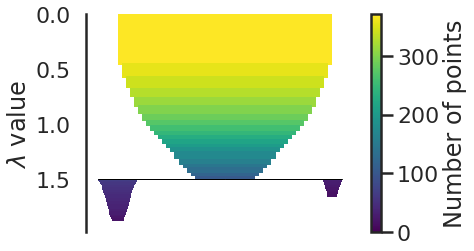

In [ ]:
clusterer1.condensed_tree_.plot()

For:  15
no. of clusters formed are:  3
for min samples:  15 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


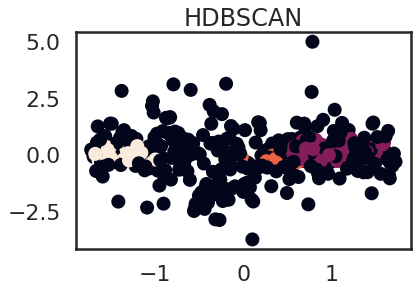

the number of clusters: 3
No. of outliers is:  266
For:  16
no. of clusters formed are:  3
for min samples:  16 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


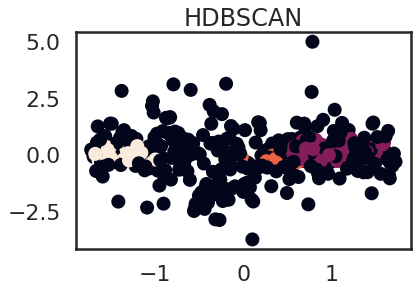

the number of clusters: 3
No. of outliers is:  271
For:  17
no. of clusters formed are:  3
for min samples:  17 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


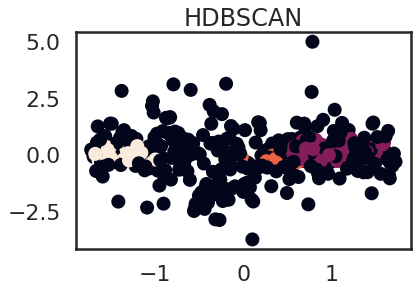

the number of clusters: 3
No. of outliers is:  265
For:  18
no. of clusters formed are:  3
for min samples:  18 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


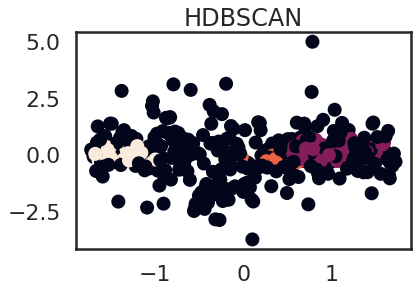

the number of clusters: 3
No. of outliers is:  278
For:  19
no. of clusters formed are:  3
for min samples:  19 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


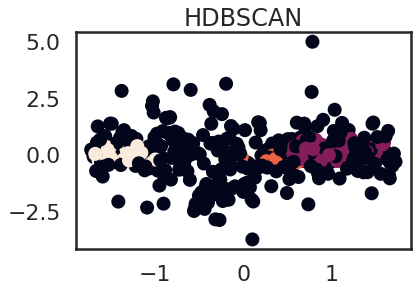

the number of clusters: 3
No. of outliers is:  281


In [ ]:
min_size=[15,16,17,18,19]
clusters=[]
outliers=[]
for i in min_size:
  clusterer_label = hdbscan.HDBSCAN(min_cluster_size=i).fit_predict(c)
  a,b=np.unique(clusterer_label,return_counts=True)
  print('For: ',i)
  clusters.append(len(a))
  print('no. of clusters formed are: ',len(a))
  d=pd.DataFrame(y_pred)
  print('for min samples: ',i,',','cluster count: ','\n',d.value_counts())
  plt.scatter(fin_rev1['category1'],fin_rev1['polarity'],c = y_pred)
  plt.title('HDBSCAN')
  plt.show()
  print('the number of clusters:',len(a))
  if(a[0]==-1):
    outliers.append(b[0])
    print('No. of outliers is: ',b[0])
  else:
    outliers.append(0)
    print('No. of outliers: 0')

# Time Series Ananlysis

## Neutral Reviews

In [346]:
top = rev1[(rev1['polarity_sentiment'] == 'Neutral')]
top

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive,0.033528,Neutral
5,786950072,5,A1GDPTMBF6VYSC,"[""Toys & Games"",""Games"",""Board Games""]",2013-02-04,great game stale kept u busy entertained no tw...,0.0,Positive,0.014286,Neutral
6,786950072,4,A368JTR1WZASA3,"[""Toys & Games"",""Games"",""Board Games""]",2011-06-13,acquire may old monopoly older i see classic f...,50.0,Positive,0.083894,Neutral
8,786950072,3,A6DR798RBPIGT,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-23,for company able roll magic the gathering trad...,0.0,Neutral,0.069643,Neutral
12,786955708,5,A2O1SP6ZPJKCAS,"[""Toys & Games"",""Games"",""Board Games""]",2012-04-25,i got game local shop i must say i wish i woul...,33.0,Positive,0.060648,Neutral
...,...,...,...,...,...,...,...,...,...,...
117998,B00J5KVSWK,3,ANRD6B90QL0FF,"[""Toys & Games"",""Arts & Crafts""]",2014-07-01,this toy definitely child eight i tried i gave...,0.0,Neutral,0.033594,Neutral
118016,B00JRCB3HQ,5,A2Q9KLA3E0RYNI,"[""Toys & Games"",""Building Toys"",""Building Sets""]",2014-07-10,malade tres beaufive star,0.0,Positive,0.000000,Neutral
118024,B00JV9D9M2,5,A2KMMT6KLYAFFF,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-04,this definitely son toy choice night due glow ...,0.0,Positive,0.039583,Neutral
118043,B00KZAROWC,5,A17V9XL4CWTQ6G,"[""Toys & Games"",""Puzzles"",""Brain Teasers"",""Maz...",2014-07-13,if someone household old school rubiks cube pe...,0.0,Positive,0.100000,Neutral


In [347]:
top.isnull().sum()

product_id            0
overall               0
reviewerID            0
category              0
ReviewTime            0
reviews               0
helpful_rate          0
sentiment             0
polarity              0
polarity_sentiment    0
dtype: int64

In [348]:
top = top.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
top

,overall,category,ReviewTime,polarity,polarity_sentiment
2,4,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,0.033528,Neutral
5,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-02-04,0.014286,Neutral
6,4,"[""Toys & Games"",""Games"",""Board Games""]",2011-06-13,0.083894,Neutral
8,3,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-23,0.069643,Neutral
12,5,"[""Toys & Games"",""Games"",""Board Games""]",2012-04-25,0.060648,Neutral
...,...,...,...,...,...
117998,3,"[""Toys & Games"",""Arts & Crafts""]",2014-07-01,0.033594,Neutral
118016,5,"[""Toys & Games"",""Building Toys"",""Building Sets""]",2014-07-10,0.000000,Neutral
118024,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-04,0.039583,Neutral
118043,5,"[""Toys & Games"",""Puzzles"",""Brain Teasers"",""Maz...",2014-07-13,0.100000,Neutral


In [349]:
top['ReviewTime'] = pd.to_datetime(top['ReviewTime'])

In [350]:
top = top.set_index("ReviewTime")
print(top)

            overall                                           category  \
ReviewTime                                                               
2012-09-10        4             ["Toys & Games","Games","Board Games"]   
2013-02-04        5             ["Toys & Games","Games","Board Games"]   
2011-06-13        4             ["Toys & Games","Games","Board Games"]   
2013-07-23        3             ["Toys & Games","Games","Board Games"]   
2012-04-25        5             ["Toys & Games","Games","Board Games"]   
...             ...                                                ...   
2014-07-01        3                   ["Toys & Games","Arts & Crafts"]   
2014-07-10        5   ["Toys & Games","Building Toys","Building Sets"]   
2014-07-04        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-13        5  ["Toys & Games","Puzzles","Brain Teasers","Maz...   
2014-07-07        5  ["Toys & Games","Puzzles","Brain Teasers","Maz...   

            polarity polarity_sentime

In [351]:
top=top.sort_values(by='ReviewTime')
top

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
2000-08-31,5,"[""Toys & Games"",""Games"",""Board Games""]",0.029167,Neutral
2000-08-31,5,"[""Toys & Games"",""Games"",""Board Games""]",0.029167,Neutral
2000-09-30,4,"[""Toys & Games"",""Baby & Toddler Toys"",""Music &...",0.056250,Neutral
2000-09-30,4,"[""Toys & Games"",""Baby & Toddler Toys"",""Music &...",0.056250,Neutral
2000-11-20,3,"[""Toys & Games"",""Games"",""Board Games""]",0.012000,Neutral
...,...,...,...,...
2014-07-22,3,"[""Toys & Games"",""Learning & Education"",""Basic ...",0.088235,Neutral
2014-07-22,4,"[""Toys & Games"",""Games"",""Card Games""]",0.033198,Neutral
2014-07-22,3,"[""Toys & Games"",""Dress Up & Pretend Play"",""Pre...",0.057993,Neutral


In [352]:
top = top.resample('W').mean().round(2)

In [353]:
top = top.interpolate(method='linear')
top

,overall,polarity
ReviewTime,,
2000-09-03,5.00,0.0300
2000-09-10,4.75,0.0375
2000-09-17,4.50,0.0450
2000-09-24,4.25,0.0525
2000-10-01,4.00,0.0600
...,...,...
2014-06-29,4.07,0.0400
2014-07-06,4.21,0.0400
2014-07-13,4.34,0.0300


<AxesSubplot:xlabel='ReviewTime'>

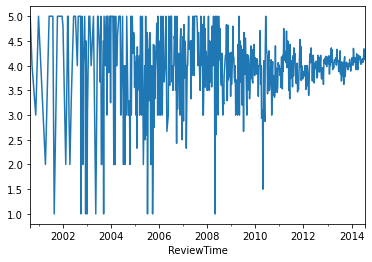

In [354]:
top.overall.plot()

Text(0.5, 1.0, 'Random')

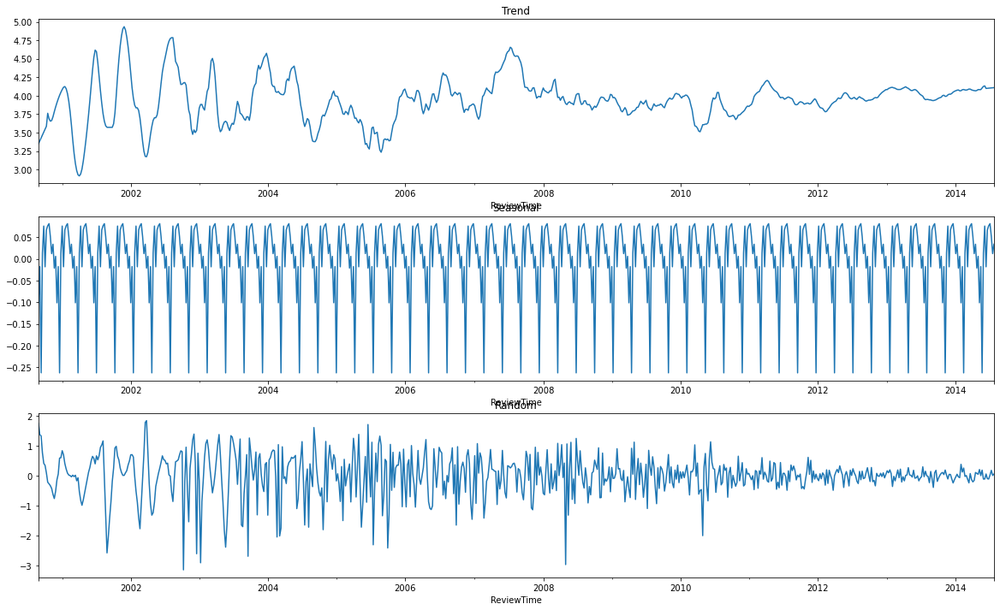

In [355]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(top['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [356]:
top1=top['overall']
top1

ReviewTime
2000-09-03    5.00
2000-09-10    4.75
2000-09-17    4.50
2000-09-24    4.25
2000-10-01    4.00
              ... 
2014-06-29    4.07
2014-07-06    4.21
2014-07-13    4.34
2014-07-20    4.13
2014-07-27    4.20
Freq: W-SUN, Name: overall, Length: 726, dtype: float64

In [357]:
top1 = pd.DataFrame(top1)

In [358]:
def checkStationarity(top1):
  pvalue = adfuller(top1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [359]:
ret = checkStationarity(top1);
ret

'p-value=1.9498525926342773e-20. Data is stationary'

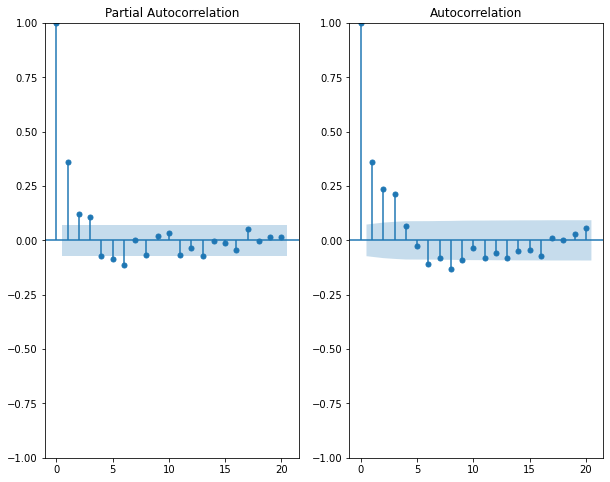

In [360]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(top1,lags=20,ax=ax[0])
plot_acf(top1.dropna(),lags=20,ax=ax[1])
plt.show()

In [361]:
ss = int(0.80 * len(top1['overall'])) 
train_df = top1.iloc[:ss] 
test_df = top1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 580, test = 146


In [362]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 580, test = 146


In [363]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  580
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -671.773
Date:                Sun, 13 Mar 2022   AIC                           1373.546
Time:                        20:13:44   BIC                           1438.992
Sample:                    09-03-2000   HQIC                          1399.062
                         - 10-09-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.9251      0.051     77.504      0.000       3.826       4.024
ar.L1          0.6999      3.647      0.192      0.848      -6.448       7.847
ar.L2          0.7130      0.326      2.187      0.0

In [364]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-09-03    3.925091
2000-09-10    4.321948
2000-09-17    4.323917
2000-09-24    4.288876
2000-10-01    4.120614
                ...   
2003-05-18    3.391319
2003-05-25    2.807861
2003-06-01    2.564300
2003-06-08    2.679185
2003-06-15    3.175457
Freq: W-SUN, Name: predicted_mean, Length: 146, dtype: float64


In [365]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      5.00   3.925091  1.074909
1      4.75   4.321948  0.428052
2      4.50   4.323917  0.176083
3      4.25   4.288876 -0.038876
4      4.00   4.120614 -0.120614
..      ...        ...       ...
141    1.80   3.391319 -1.591319
142    1.00   2.807861 -1.807861
143    2.00   2.564300 -0.564300
144    3.00   2.679185  0.320815
145    4.00   3.175457  0.824543

[146 rows x 3 columns]


In [366]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [367]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.6323905971220247
	RMSE = 0.795229902054761


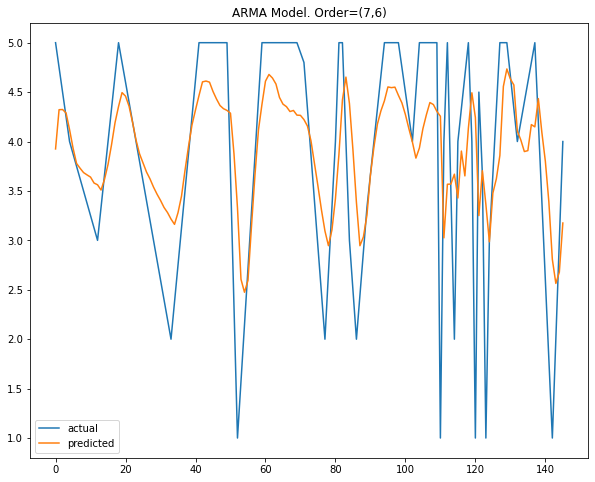

In [368]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [369]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+70, typ='levels')
print(fcast_m1)

2011-10-16    3.805520
2011-10-23    3.902314
2011-10-30    3.828749
2011-11-06    3.925161
2011-11-13    3.881751
                ...   
2013-01-20    3.942578
2013-01-27    3.913473
2013-02-03    3.927550
2013-02-10    3.932250
2013-02-17    3.910733
Freq: W-SUN, Name: predicted_mean, Length: 71, dtype: float64


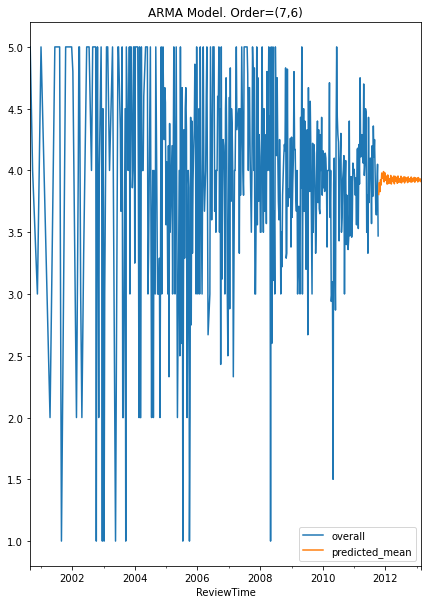

In [370]:
train.plot(figsize=(7,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Negative Sentiments

In [472]:
sec = rev1[(rev1['polarity_sentiment'] == 'Negative')]
sec

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive,-0.001603,Negative
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative,-0.166667,Negative
9,786950072,5,A3FI4WZ8EQTRS5,"[""Toys & Games"",""Games"",""Board Games""]",2014-06-21,it fun game a lot strategy every game differen...,0.0,Positive,-0.016667,Negative
10,786950072,5,A105H7LA4UCUKN,"[""Toys & Games"",""Games"",""Board Games""]",2011-03-20,played first time yesterday player took minute...,0.0,Positive,-0.010667,Negative
14,786955708,1,A3VEEHFVY1YSDC,"[""Toys & Games"",""Games"",""Board Games""]",2013-01-10,hated productpredictable not fun it attempt fa...,19.0,Negative,-0.194792,Negative
...,...,...,...,...,...,...,...,...,...,...
117951,B00J49UTP4,3,A2KFWHHUFVKFXZ,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-07-05,this one annoying toy weve gotten long time i ...,0.0,Neutral,-0.044129,Negative
117954,B00J49UTP4,3,AF8SREA2XE7BJ,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-06-30,oh dear god thing annoying it cute enough toy ...,0.0,Neutral,-0.053108,Negative
117971,B00J49UTW2,3,A1GNYV0RA0EQSS,"[""Toys & Games"",""Toy Remote Control & Play Veh...",2014-07-07,i several thomas take n play set one give wow ...,50.0,Neutral,-0.210204,Negative
117993,B00J49UTWC,4,A33230MIA3W7G4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",2014-07-20,fisher price version my little pony with popul...,50.0,Positive,-0.048214,Negative


In [473]:
sec = sec.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
sec

,overall,category,ReviewTime,polarity,polarity_sentiment
0,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,-0.001603,Negative
3,1,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,-0.166667,Negative
9,5,"[""Toys & Games"",""Games"",""Board Games""]",2014-06-21,-0.016667,Negative
10,5,"[""Toys & Games"",""Games"",""Board Games""]",2011-03-20,-0.010667,Negative
14,1,"[""Toys & Games"",""Games"",""Board Games""]",2013-01-10,-0.194792,Negative
...,...,...,...,...,...
117951,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-07-05,-0.044129,Negative
117954,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-06-30,-0.053108,Negative
117971,3,"[""Toys & Games"",""Toy Remote Control & Play Veh...",2014-07-07,-0.210204,Negative
117993,4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",2014-07-20,-0.048214,Negative


In [474]:
sec['ReviewTime'] = pd.to_datetime(sec['ReviewTime'])

In [475]:
sec = sec.set_index("ReviewTime")
print(sec)

            overall                                           category  \
ReviewTime                                                               
2013-05-08        5             ["Toys & Games","Games","Board Games"]   
2012-06-05        1             ["Toys & Games","Games","Board Games"]   
2014-06-21        5             ["Toys & Games","Games","Board Games"]   
2011-03-20        5             ["Toys & Games","Games","Board Games"]   
2013-01-10        1             ["Toys & Games","Games","Board Games"]   
...             ...                                                ...   
2014-07-05        3             ["Toys & Games","Baby & Toddler Toys"]   
2014-06-30        3             ["Toys & Games","Baby & Toddler Toys"]   
2014-07-07        3  ["Toys & Games","Toy Remote Control & Play Veh...   
2014-07-20        4  ["Toys & Games","Action Figures & Statues","Pl...   
2014-06-27        5  ["Toys & Games","Hobbies","Remote & App Contro...   

            polarity polarity_sentime

In [476]:
sec=sec.sort_values(by='ReviewTime')
sec

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
2000-10-10,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.115278,Negative
2000-10-10,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.115278,Negative
2000-12-02,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.034583,Negative
2000-12-02,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.034583,Negative
2000-12-08,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.000309,Negative
...,...,...,...,...
2014-07-21,4,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",-0.112500,Negative
2014-07-21,3,"[""Toys & Games"",""Games"",""Card Games""]",-0.128711,Negative
2014-07-21,4,"[""Toys & Games"",""Games"",""Board Games"",""Importe...",-0.066667,Negative


In [477]:
sec = sec.resample('W').mean().round(2)

In [478]:
sec = sec.interpolate(method='linear')
sec

,overall,polarity
ReviewTime,,
2000-10-15,5.00,-0.120000
2000-10-22,5.00,-0.107143
2000-10-29,5.00,-0.094286
2000-11-05,5.00,-0.081429
2000-11-12,5.00,-0.068571
...,...,...
2014-06-29,3.42,-0.100000
2014-07-06,3.46,-0.150000
2014-07-13,3.32,-0.160000


<AxesSubplot:xlabel='ReviewTime'>

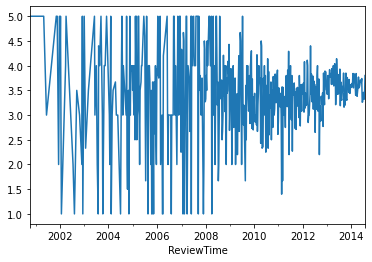

In [479]:
sec.overall.plot()

Text(0.5, 1.0, 'Random')

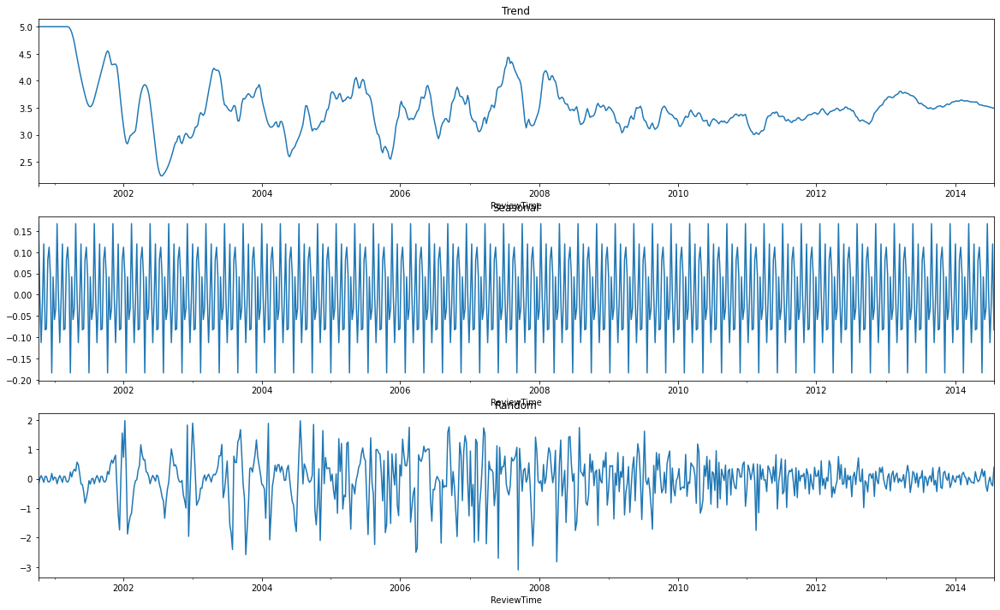

In [480]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(sec['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [481]:
sec1=sec['overall']
sec1

ReviewTime
2000-10-15    5.00
2000-10-22    5.00
2000-10-29    5.00
2000-11-05    5.00
2000-11-12    5.00
              ... 
2014-06-29    3.42
2014-07-06    3.46
2014-07-13    3.32
2014-07-20    3.38
2014-07-27    3.80
Freq: W-SUN, Name: overall, Length: 720, dtype: float64

In [482]:
sec1 = pd.DataFrame(sec1)

In [483]:
def checkStationarity(sec1):
  pvalue = adfuller(sec1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [484]:
ret = checkStationarity(sec1);
ret

'p-value=1.499407018298035e-14. Data is stationary'

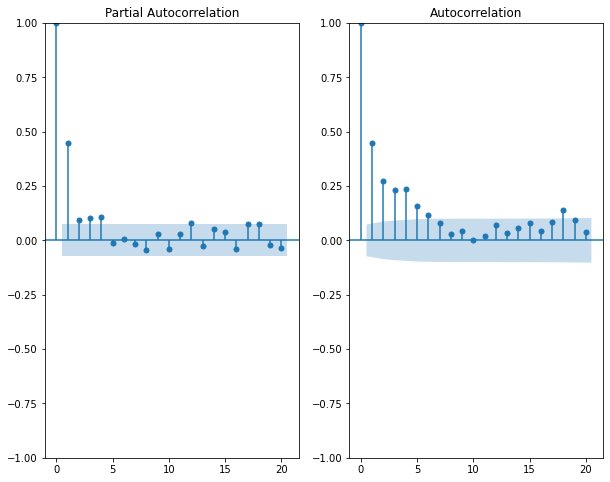

In [485]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(sec1,lags=20,ax=ax[0])
plot_acf(sec1.dropna(),lags=20,ax=ax[1])
plt.show()

In [486]:
ss = int(0.80 * len(top1['overall'])) 
train_df = sec1.iloc[:ss] 
test_df = sec1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 580, test = 140


In [487]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 580, test = 140


In [488]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  580
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -748.601
Date:                Sun, 13 Mar 2022   AIC                           1527.201
Time:                        20:36:28   BIC                           1592.647
Sample:                    10-15-2000   HQIC                          1552.717
                         - 11-20-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5124      0.114     30.817      0.000       3.289       3.736
ar.L1          0.6400      4.162      0.154      0.878      -7.518       8.798
ar.L2          0.1669      4.118      0.041      0.9

In [489]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-10-15    3.512442
2000-10-22    4.192488
2000-10-29    4.262816
2000-11-05    4.328201
2000-11-12    4.403146
                ...   
2003-05-18    4.171119
2003-05-25    3.994243
2003-06-01    4.348406
2003-06-08    4.198909
2003-06-15    4.251390
Freq: W-SUN, Name: predicted_mean, Length: 140, dtype: float64


In [490]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

       actual  predicted       err
0    5.000000   3.512442  1.487558
1    5.000000   4.192488  0.807512
2    5.000000   4.262816  0.737184
3    5.000000   4.328201  0.671799
4    5.000000   4.403146  0.596854
..        ...        ...       ...
135  4.653846   4.171119  0.482728
136  4.769231   3.994243  0.774988
137  4.884615   4.348406  0.536209
138  5.000000   4.198909  0.801091
139  3.000000   4.251390 -1.251390

[140 rows x 3 columns]


In [491]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [492]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.5239362540003367
	RMSE = 0.7238344106218885


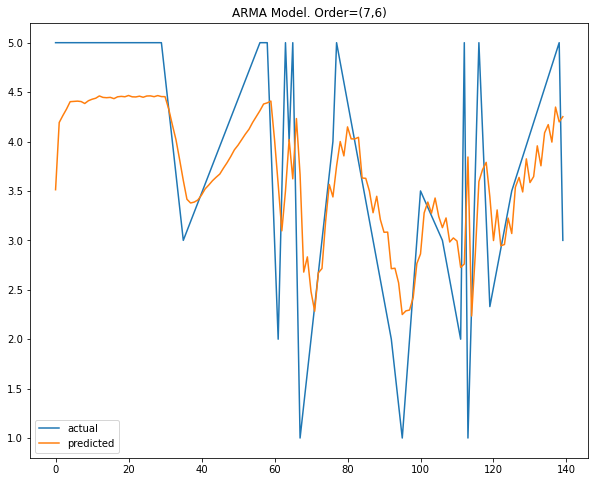

In [493]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [499]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m1)

2011-11-27    3.574952
2011-12-04    3.288451
2011-12-11    3.472185
2011-12-18    3.551293
2011-12-25    3.388253
2012-01-01    3.610127
2012-01-08    3.470484
2012-01-15    3.407494
2012-01-22    3.578681
2012-01-29    3.397926
2012-02-05    3.507778
2012-02-12    3.570131
2012-02-19    3.412712
2012-02-26    3.571313
2012-03-04    3.493852
2012-03-11    3.436646
2012-03-18    3.583039
2012-03-25    3.448840
2012-04-01    3.506225
2012-04-08    3.564977
2012-04-15    3.435377
2012-04-22    3.551733
2012-04-29    3.512827
2012-05-06    3.455694
2012-05-13    3.571866
2012-05-20    3.474015
2012-05-27    3.500706
2012-06-03    3.557684
2012-06-10    3.455679
2012-06-17    3.538484
2012-06-24    3.522490
Freq: W-SUN, Name: predicted_mean, dtype: float64


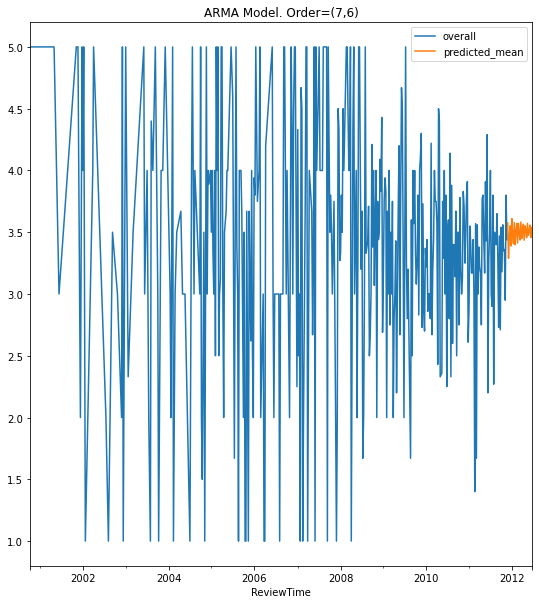

In [500]:
train.plot(figsize=(9,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## For a particular catgeory

In [289]:
neg  = rev1[(rev1['polarity_sentiment'] == 'Negative')]

In [290]:
neg = neg.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
neg

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
0,786950072,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,-0.001603,Negative
3,786950072,1,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,-0.166667,Negative
9,786950072,5,"[""Toys & Games"",""Games"",""Board Games""]",2014-06-21,-0.016667,Negative
10,786950072,5,"[""Toys & Games"",""Games"",""Board Games""]",2011-03-20,-0.010667,Negative
14,786955708,1,"[""Toys & Games"",""Games"",""Board Games""]",2013-01-10,-0.194792,Negative
...,...,...,...,...,...,...
117951,B00J49UTP4,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-07-05,-0.044129,Negative
117954,B00J49UTP4,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-06-30,-0.053108,Negative
117971,B00J49UTW2,3,"[""Toys & Games"",""Toy Remote Control & Play Veh...",2014-07-07,-0.210204,Negative
117993,B00J49UTWC,4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",2014-07-20,-0.048214,Negative


In [291]:
counts = neg["category"].value_counts().to_frame()
counts

,category
"[""Toys & Games"",""Games"",""Board Games""]",2354
"[""Toys & Games"",""Games"",""Card Games""]",469
"[""Toys & Games"",""Building Toys"",""Building Sets""]",410
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",368
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",347
...,...
"[""Toys & Games"",""Hobbies"",""Remote & App Controlled Vehicles & Parts"",""Remote & App Controlled Vehicle Parts"",""Wheels & Tires"",""Accessories""]",1
"[""Toys & Games"",""Party Supplies"",""Tablecovers""]",1
"[""Toys & Games"",""Arts & Crafts"",""Craft Kits"",""Wood""]",1
"[""Toys & Games"",""Learning & Education"",""Musical Instruments"",""Wind & Brass""]",1


In [292]:
avg_rating = neg.groupby('category')["overall"].mean().to_frame()
avg_rating

,overall
category,
"[""Toys & Games"",""Action Figures & Statues"",""Accessories""]",3.500000
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",3.296196
"[""Toys & Games"",""Action Figures & Statues"",""Imported"",""Sonic screwdriver that's really a flashlight"",""Super bright LED for timey-wimey adventuring"",""Have your collectible and use it, too!"",""Approx 6.5\"" in length"",""The Eleventh Doctor's handy device shines a bright green beam through light-emitting diodes.""]",4.000000
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3.407035
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Vehicles""]",3.000000
...,...
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Electric Vehicles""]",4.200000
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pedal Cars""]",2.666667
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pull-Along Wagons""]",3.769231


In [293]:
proj = counts.join(avg_rating)
proj.head(30)

,category,overall
"[""Toys & Games"",""Games"",""Board Games""]",2354,4.032710
"[""Toys & Games"",""Games"",""Card Games""]",469,4.170576
"[""Toys & Games"",""Building Toys"",""Building Sets""]",410,3.678049
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",368,3.296196
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",347,3.259366
"[""Toys & Games"",""Kids' Electronics"",""Electronic Learning Toys""]",244,3.127049
"[""Toys & Games"",""Kids' Electronics"",""Systems & Accessories"",""Electronic Software & Books""]",224,4.040179
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",199,3.407035
"[""Toys & Games"",""Toy Remote Control & Play Vehicles"",""Vehicle Playsets""]",193,2.751295
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Stuffed Animals & Teddy Bears""]",124,3.475806


In [294]:
prod  = rev1[(rev1['category'] == '["Toys & Games","Games","Card Games"]')]

In [295]:
prod

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
49,096625757X,3,A187JLGNRZCU2J,"[""Toys & Games"",""Games"",""Card Games""]",2013-12-04,bought year old girl card probably appropriate...,0.0,Neutral,0.133333,Positive
50,096625757X,4,A313P3FY0KBUW8,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-29,this really fun conversation starter especiall...,0.0,Positive,0.015179,Neutral
51,096625757X,5,A124OY4FLG30V0,"[""Toys & Games"",""Games"",""Card Games""]",2013-10-11,while vacation kid got hooked would you rather...,0.0,Positive,0.033333,Neutral
52,096625757X,4,A12ZPX7NST48Q4,"[""Toys & Games"",""Games"",""Card Games""]",2014-02-21,cute card game great traveling teen adult we t...,0.0,Positive,-0.016667,Negative
53,096625757X,3,A13G1TKIKHGV3F,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-26,we played game family thanksgiving there way r...,50.0,Neutral,0.032083,Neutral
...,...,...,...,...,...,...,...,...,...,...
117509,B00HVFBT1G,5,A1HU0Y4JENS74E,"[""Toys & Games"",""Games"",""Card Games""]",2014-06-12,my yearold son i enjoy playing this expansion ...,0.0,Positive,0.000000,Neutral
117510,B00HVFBT1G,4,AD8SR4DNEN1YM,"[""Toys & Games"",""Games"",""Card Games""]",2014-07-13,without played it changeling seem like need se...,0.0,Positive,-0.333333,Negative
117511,B00HVFBT1G,5,A3HWQBKOVVBS00,"[""Toys & Games"",""Games"",""Card Games""]",2014-05-02,great fun expansion already fun game it add ch...,0.0,Positive,0.116667,Positive
117512,B00HVFBT1G,5,A3OD9DU3A0NCCI,"[""Toys & Games"",""Games"",""Card Games""]",2014-04-17,i apparent minority liked cthulhu expansion sc...,50.0,Positive,0.100455,Positive


In [296]:
prod = prod.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
prod

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
49,096625757X,3,"[""Toys & Games"",""Games"",""Card Games""]",2013-12-04,0.133333,Positive
50,096625757X,4,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-29,0.015179,Neutral
51,096625757X,5,"[""Toys & Games"",""Games"",""Card Games""]",2013-10-11,0.033333,Neutral
52,096625757X,4,"[""Toys & Games"",""Games"",""Card Games""]",2014-02-21,-0.016667,Negative
53,096625757X,3,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-26,0.032083,Neutral
...,...,...,...,...,...,...
117509,B00HVFBT1G,5,"[""Toys & Games"",""Games"",""Card Games""]",2014-06-12,0.000000,Neutral
117510,B00HVFBT1G,4,"[""Toys & Games"",""Games"",""Card Games""]",2014-07-13,-0.333333,Negative
117511,B00HVFBT1G,5,"[""Toys & Games"",""Games"",""Card Games""]",2014-05-02,0.116667,Positive
117512,B00HVFBT1G,5,"[""Toys & Games"",""Games"",""Card Games""]",2014-04-17,0.100455,Positive


In [297]:
prod.overall.value_counts()

5    1489
4     479
3     172
2      53
1      27
Name: overall, dtype: int64

In [298]:
prod['ReviewTime'] = pd.to_datetime(prod['ReviewTime'])

In [299]:
prod = prod.set_index("ReviewTime")
print(prod)

            product_id  overall                               category  \
ReviewTime                                                               
2013-12-04  096625757X        3  ["Toys & Games","Games","Card Games"]   
2012-11-29  096625757X        4  ["Toys & Games","Games","Card Games"]   
2013-10-11  096625757X        5  ["Toys & Games","Games","Card Games"]   
2014-02-21  096625757X        4  ["Toys & Games","Games","Card Games"]   
2012-11-26  096625757X        3  ["Toys & Games","Games","Card Games"]   
...                ...      ...                                    ...   
2014-06-12  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   
2014-07-13  B00HVFBT1G        4  ["Toys & Games","Games","Card Games"]   
2014-05-02  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   
2014-04-17  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   
2014-05-05  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   

            polarity polarity_sentime

In [300]:
prod=prod.sort_values(by='ReviewTime')
prod

,product_id,overall,category,polarity,polarity_sentiment
ReviewTime,,,,,
2000-07-28,B00004SDAP,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2000-07-28,B00004SDAP,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2001-12-25,B00000DMBD,5,"[""Toys & Games"",""Games"",""Card Games""]",0.018681,Neutral
2002-07-15,B00000DMBD,5,"[""Toys & Games"",""Games"",""Card Games""]",0.089394,Neutral
2002-10-17,B00000GBQJ,5,"[""Toys & Games"",""Games"",""Card Games""]",0.170417,Positive
...,...,...,...,...,...
2014-07-22,B004U7JJWE,4,"[""Toys & Games"",""Games"",""Card Games""]",0.550000,Positive
2014-07-22,B00FG1U7FQ,4,"[""Toys & Games"",""Games"",""Card Games""]",0.033198,Neutral
2014-07-22,B001ESQTUM,5,"[""Toys & Games"",""Games"",""Card Games""]",0.700000,Positive


In [301]:
prod = prod.resample('W').mean().round(2)

In [302]:
prod = prod.interpolate(method='linear')
prod

,overall,polarity
ReviewTime,,
2000-07-30,5.00,0.150000
2000-08-06,5.00,0.148243
2000-08-13,5.00,0.146486
2000-08-20,5.00,0.144730
2000-08-27,5.00,0.142973
...,...,...
2014-06-29,4.67,0.150000
2014-07-06,4.38,0.140000
2014-07-13,4.41,0.120000


In [303]:
prod = prod.dropna()

<AxesSubplot:xlabel='ReviewTime'>

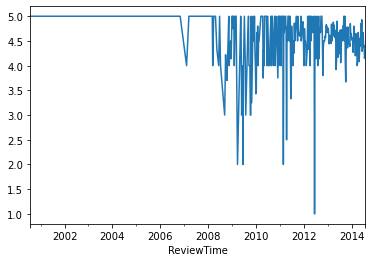

In [304]:
prod.overall.plot()

In [305]:
prod1=prod['overall']
prod1

ReviewTime
2000-07-30    5.00
2000-08-06    5.00
2000-08-13    5.00
2000-08-20    5.00
2000-08-27    5.00
              ... 
2014-06-29    4.67
2014-07-06    4.38
2014-07-13    4.41
2014-07-20    4.15
2014-07-27    4.27
Freq: W-SUN, Name: overall, Length: 731, dtype: float64

In [306]:
prod1 = pd.DataFrame(prod1)

In [307]:
def checkStationarity(prod1):
  pvalue = adfuller(prod1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [308]:
ret = checkStationarity(prod1);
ret

'p-value=0.051574322754565576. Data is not stationary'

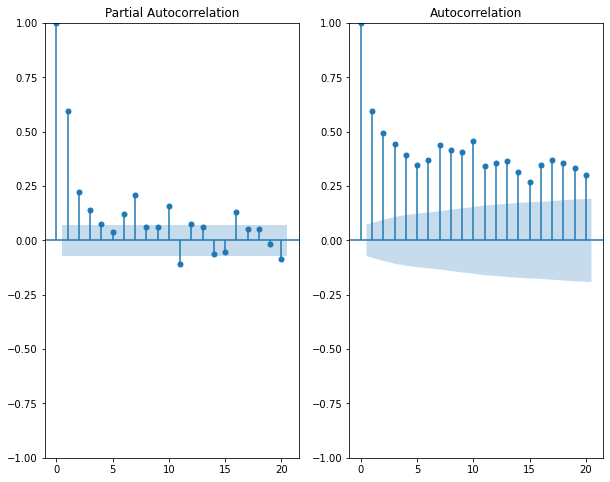

In [309]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(prod1,lags=20,ax=ax[0])
plot_acf(prod1.dropna(),lags=20,ax=ax[1])
plt.show()

In [310]:
ss = int(0.80 * len(prod1['overall'])) 
train_df = prod1.iloc[:ss] 
test_df = prod1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 584, test = 147


In [311]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 584, test = 147


In [312]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  584
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -191.327
Date:                Sun, 13 Mar 2022   AIC                            412.654
Time:                        20:11:39   BIC                            478.203
Sample:                    07-30-2000   HQIC                           438.202
                         - 10-02-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.7623      0.378     12.597      0.000       4.021       5.503
ar.L1          0.2517      0.199      1.264      0.206      -0.139       0.642
ar.L2          0.3441      0.251      1.371      0.1

In [313]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-07-30    4.762252
2000-08-06    4.926729
2000-08-13    4.940351
2000-08-20    4.945484
2000-08-27    4.948737
                ...   
2003-04-20    4.980236
2003-04-27    4.980073
2003-05-04    4.980066
2003-05-11    4.980236
2003-05-18    4.980076
Freq: W-SUN, Name: predicted_mean, Length: 147, dtype: float64


In [314]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0       5.0   4.762252  0.237748
1       5.0   4.926729  0.073271
2       5.0   4.940351  0.059649
3       5.0   4.945484  0.054516
4       5.0   4.948737  0.051263
..      ...        ...       ...
142     5.0   4.980236  0.019764
143     5.0   4.980073  0.019927
144     5.0   4.980066  0.019934
145     5.0   4.980236  0.019764
146     5.0   4.980076  0.019924

[147 rows x 3 columns]


In [315]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [316]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.0009204928224848643
	RMSE = 0.030339624626630837


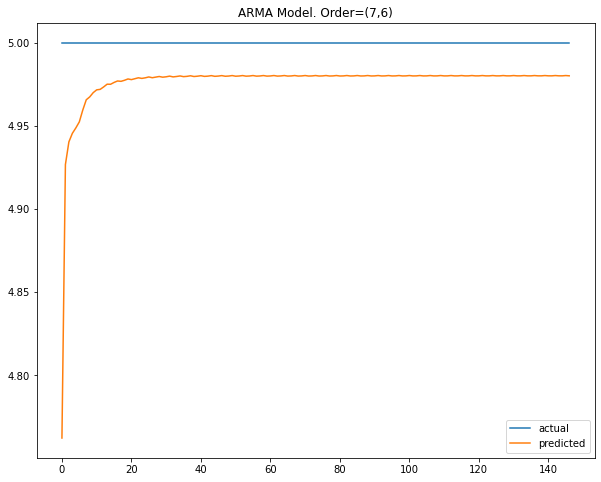

In [317]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [318]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+44, typ='levels')
print(fcast_m1)

2011-10-09    4.417810
2011-10-16    4.690135
2011-10-23    4.542688
2011-10-30    4.514988
2011-11-06    4.774001
2011-11-13    4.631022
2011-11-20    4.518012
2011-11-27    4.748471
2011-12-04    4.605250
2011-12-11    4.512553
2011-12-18    4.736847
2011-12-25    4.639109
2012-01-01    4.526782
2012-01-08    4.744508
2012-01-15    4.648144
2012-01-22    4.535252
2012-01-29    4.731124
2012-02-05    4.663584
2012-02-12    4.540123
2012-02-19    4.732054
2012-02-26    4.673963
2012-03-04    4.552637
2012-03-11    4.724676
2012-03-18    4.687125
2012-03-25    4.558417
2012-04-01    4.722779
2012-04-08    4.694971
2012-04-15    4.569733
2012-04-22    4.717205
2012-04-29    4.705765
2012-05-06    4.577117
2012-05-13    4.715082
2012-05-20    4.712219
2012-05-27    4.587569
2012-06-03    4.710524
2012-06-10    4.720489
2012-06-17    4.595591
2012-06-24    4.708524
2012-07-01    4.725751
2012-07-08    4.605480
2012-07-15    4.704978
2012-07-22    4.731951
2012-07-29    4.613665
2012-08-05 

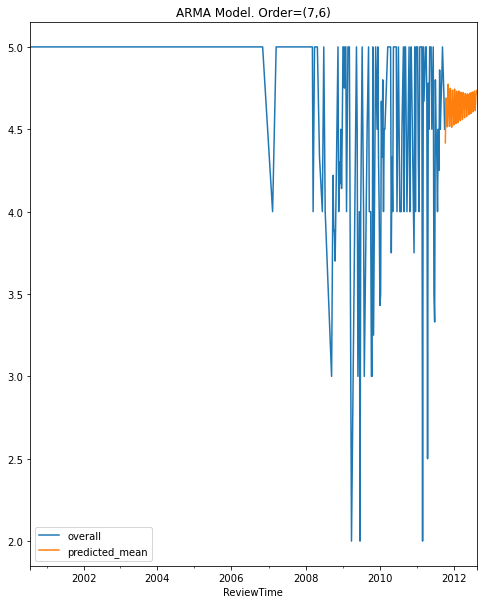

In [319]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Positive Sentiment

In [258]:
third = rev1[(rev1['polarity_sentiment'] == 'Positive')]
third

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive,0.282192,Positive
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative,0.400000,Positive
7,786950072,4,AUNK2GN1VD1OD,"[""Toys & Games"",""Games"",""Board Games""]",2013-11-18,i grew playing monopoly lot people did it unfo...,50.0,Positive,0.131538,Positive
11,786950072,1,A3A31QU1F6KCUX,"[""Toys & Games"",""Games"",""Board Games""]",2009-10-02,we game made thought newer version would time ...,44.0,Negative,0.103611,Positive
15,786955708,5,A256SIW5MV0DN4,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-26,i loved dd board game wizard coast far i two a...,0.0,Positive,0.224545,Positive
...,...,...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable it easy use kid ...,0.0,Positive,0.373333,Positive
118066,B00LBI9BKA,5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brother prized toy it extremely durable p...,50.0,Positive,0.170972,Positive
118067,B00LBI9BKA,5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0,Positive,0.380635,Positive
118068,B00LBI9BKA,5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0,Positive,0.282292,Positive


In [259]:
third = third.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
third

,overall,category,ReviewTime,polarity,polarity_sentiment
1,5,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,0.282192,Positive
4,2,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,0.400000,Positive
7,4,"[""Toys & Games"",""Games"",""Board Games""]",2013-11-18,0.131538,Positive
11,1,"[""Toys & Games"",""Games"",""Board Games""]",2009-10-02,0.103611,Positive
15,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-26,0.224545,Positive
...,...,...,...,...,...
118065,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,0.373333,Positive
118066,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,0.170972,Positive
118067,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,0.380635,Positive
118068,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,0.282292,Positive


In [260]:
third['ReviewTime'] = pd.to_datetime(third['ReviewTime'])

In [261]:
third = third.set_index("ReviewTime")
print(third)

            overall                                           category  \
ReviewTime                                                               
2008-11-23        5             ["Toys & Games","Games","Board Games"]   
2013-06-12        2             ["Toys & Games","Games","Board Games"]   
2013-11-18        4             ["Toys & Games","Games","Board Games"]   
2009-10-02        1             ["Toys & Games","Games","Board Games"]   
2013-07-26        5             ["Toys & Games","Games","Board Games"]   
...             ...                                                ...   
2014-07-07        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-07        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-08        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-18        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-15        4  ["Toys & Games","Hobbies","Remote & App Contro...   

            polarity polarity_sentime

In [262]:
third=third.sort_values(by='ReviewTime')
third

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
2000-07-28,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2000-07-28,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2000-09-04,5,"[""Toys & Games"",""Baby & Toddler Toys""]",0.345000,Positive
2000-09-04,5,"[""Toys & Games"",""Baby & Toddler Toys""]",0.345000,Positive
2000-10-01,5,"[""Toys & Games"",""Learning & Education"",""Musica...",0.335417,Positive
...,...,...,...,...
2014-07-23,3,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",0.433333,Positive
2014-07-23,5,"[""Toys & Games"",""Building Toys"",""Building Sets""]",0.500000,Positive
2014-07-23,4,"[""Toys & Games"",""Dolls & Accessories"",""Playsets""]",0.108923,Positive


In [263]:
third = third.resample('W').mean().round(2)

In [264]:
third = third.interpolate(method='linear')
third

,overall,polarity
ReviewTime,,
2000-07-30,5.00,0.150000
2000-08-06,5.00,0.181667
2000-08-13,5.00,0.213333
2000-08-20,5.00,0.245000
2000-08-27,5.00,0.276667
...,...,...
2014-06-29,4.57,0.320000
2014-07-06,4.60,0.360000
2014-07-13,4.60,0.390000


<AxesSubplot:xlabel='ReviewTime'>

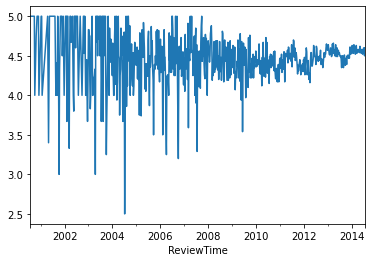

In [265]:
third.overall.plot()

Text(0.5, 1.0, 'Random')

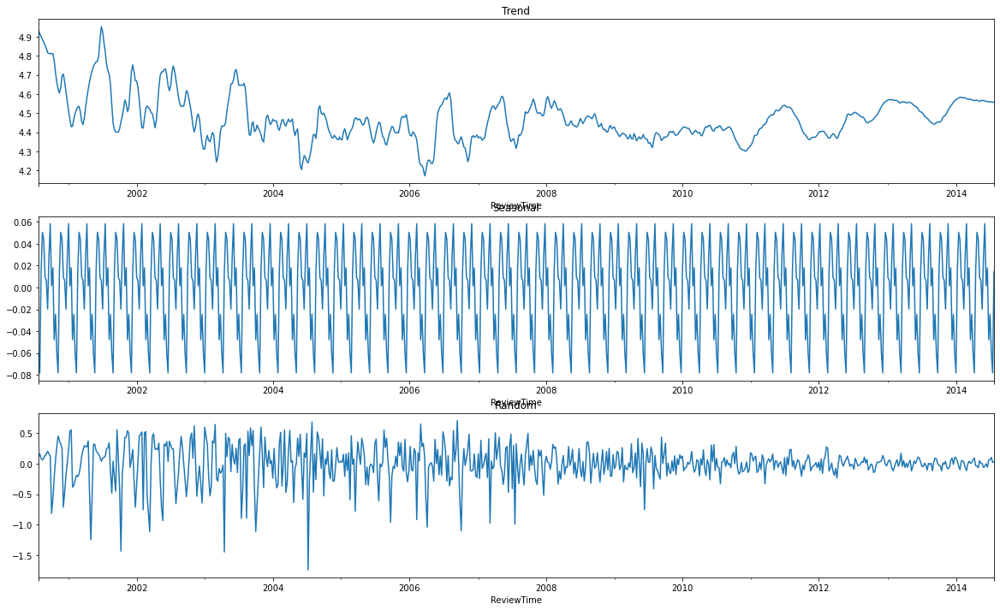

In [266]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(third['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [267]:
third1=third['overall']
third1

ReviewTime
2000-07-30    5.00
2000-08-06    5.00
2000-08-13    5.00
2000-08-20    5.00
2000-08-27    5.00
              ... 
2014-06-29    4.57
2014-07-06    4.60
2014-07-13    4.60
2014-07-20    4.50
2014-07-27    4.60
Freq: W-SUN, Name: overall, Length: 731, dtype: float64

In [268]:
third1 = pd.DataFrame(third1)

In [269]:
def checkStationarity(third1):
  pvalue = adfuller(third1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [270]:
ret = checkStationarity(third1);
ret

'p-value=2.0233723602210268e-22. Data is stationary'

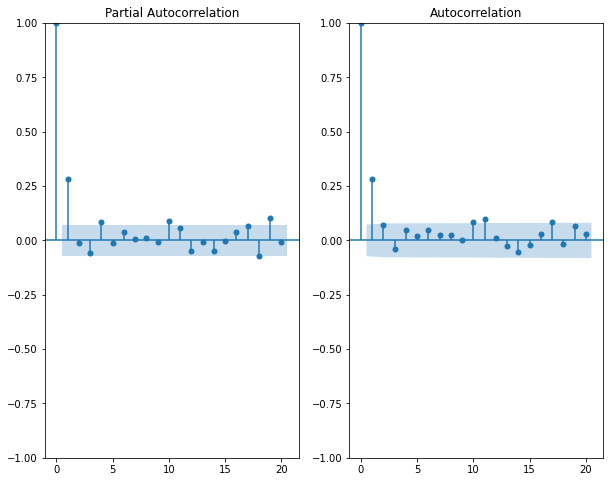

In [271]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(third1.dropna(),lags=20,ax=ax[0])
plot_acf(third1.dropna(),lags=20,ax=ax[1])
plt.show()

In [272]:
ss = int(0.80 * len(third1['overall'])) 
train_df = third1.iloc[:ss] 
test_df = third1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 584, test = 147


In [273]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 584, test = 147


In [274]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  584
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -199.770
Date:                Sun, 13 Mar 2022   AIC                            429.541
Time:                        20:09:18   BIC                            495.089
Sample:                    07-30-2000   HQIC                           455.088
                         - 10-02-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.5161      0.154     29.322      0.000       4.214       4.818
ar.L1          0.1401      0.108      1.292      0.196      -0.072       0.353
ar.L2         -0.5106      0.082     -6.203      0.0

In [275]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-07-30    4.516079
2000-08-06    4.670646
2000-08-13    4.673009
2000-08-20    4.684910
2000-08-27    4.708855
                ...   
2003-04-20    4.385717
2003-04-27    4.162358
2003-05-04    4.741518
2003-05-11    4.564378
2003-05-18    4.584556
Freq: W-SUN, Name: predicted_mean, Length: 147, dtype: float64


In [276]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      5.00   4.516079  0.483921
1      5.00   4.670646  0.329354
2      5.00   4.673009  0.326991
3      5.00   4.684910  0.315090
4      5.00   4.708855  0.291145
..      ...        ...       ...
142    3.00   4.385717 -1.385717
143    5.00   4.162358  0.837642
144    4.67   4.741518 -0.071518
145    5.00   4.564378  0.435622
146    5.00   4.584556  0.415444

[147 rows x 3 columns]


In [277]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [278]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.170476633397981
	RMSE = 0.41288816088376884


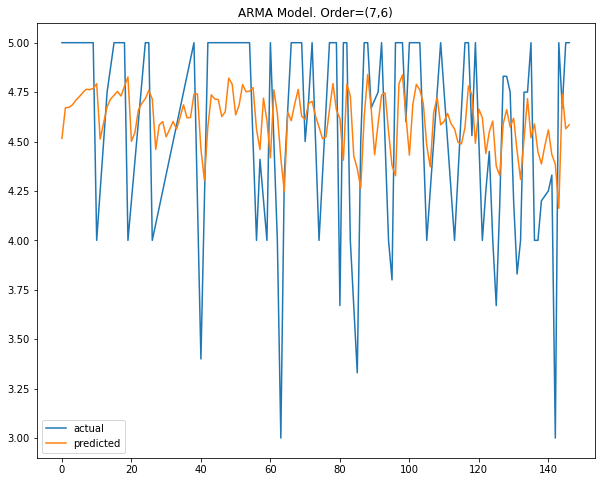

In [279]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [287]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+60, typ='levels')
print(fcast_m1)

2011-10-09    4.477442
2011-10-16    4.454147
2011-10-23    4.388745
2011-10-30    4.483843
2011-11-06    4.475569
                ...   
2012-11-04    4.475416
2012-11-11    4.476186
2012-11-18    4.415888
2012-11-25    4.457710
2012-12-02    4.485217
Freq: W-SUN, Name: predicted_mean, Length: 61, dtype: float64


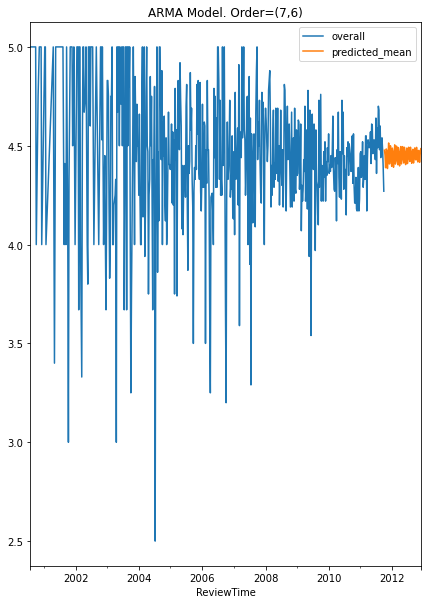

In [288]:
train.plot(figsize=(7,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

In [252]:
rev.to_csv('Video_Gamesfin.csv')

In [253]:
rev1.to_csv('Toys_and_Gamesfin.csv')